<a href="https://colab.research.google.com/github/NataliaBlueCloud/traffic-latency-simulator/blob/main/simulation_MG1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [176]:
system('git clone https://github.com/NataliaBlueCloud/traffic-latency-simulator.git')


In [6]:
install.packages("igraph")
install.packages("simmer")
install.packages("SciViews")
install.packages("hrbrthemes")
install.packages("viridis")
install.packages("googledrive")
install.packages("readxl")
install.packages("openxlsx")


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘gdtools’


Warning message in install.packages("hrbrthemes"):
“installation of package ‘gdtools’ had non-zero exit status”
Warning message in install.packages("hrbrthemes"):
“installation of package ‘hrbrthemes’ had non-zero exit status”
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [51]:
library(ggplot2)
library(igraph)
library(stringr)
library(simmer)
library(tidyverse)
library(readr)
library(SciViews)
library(dplyr)
library(viridis)
library(readxl)
library(openxlsx)

In [52]:
source("/content/traffic-latency-simulator/func/igraph_functions.R")
source("/content/traffic-latency-simulator/func/general_function_base.R")
source("/content/traffic-latency-simulator/func/simmer_function_base.R")

#Input data

The **average packet size** is taken from: Amsterdam Internet Exchange Ethernet Frame Size Distribution, statistics available online at https://stats.ams-ix.net/sflow/size.html, accessed on July 2023

Packet sizes in Bytes: 64-127, 128-511, 512 - 1023, 1024 - 1513, 1514, more than 1515.


With their probabilities: 0.332, 0.054, 0.033, 0.037, 0.346, 0.146, 0.052

In [105]:
PS_size=c((64+127)/2,(128+255)/2,(256+511)/2, (512+1023)/2, (1024+1513)/2, 1514, (1515+9100)/2)
PS_weights=c(33.2/100, 5.4/100, 3.3/100, 3.7/100, 34.6/100, 14.6/100, 5.2/100)
N = sum(PS_size*PS_weights)
N
var_N <- sum(PS_size^2*PS_weights) - N^2
Cs2 <- var_N/(N^2)

CapacityGbps = 10
#Calculation of delays for different capacities
Load_local = 0.3
Load_regional = 0.5
Load_national = 0.4

[1] 1019.035

Input excel file with topology information: links, nodes, traffic

Prefix base - the common name for the nodes in the file.

In [106]:
topology_choice <- readline(prompt = "Enter 'Tokyo' or 'Milano' to choose the respective topology: ")

# Define the file paths based on user input
if (tolower(topology_choice) == "tokyo" | tolower(topology_choice) == "Tokyo") {
  file_name_v2 <- "/content/traffic-latency-simulator/input_files/Metro_topology_full_Tokyo.xlsx"
  prefix_base <- "Tokyo_"
  topology_name = "Tokyo"
  print(file_name_v2)
} else if (tolower(topology_choice) == "milano" | tolower(topology_choice) == "Milano") {
  file_name_v2 <- "/content/traffic-latency-simulator/input_files/Metro_topology_full_Milano.xlsx"
  prefix_base <- "Node"
  topology_name = "Milano"
  print(file_name_v2)
} else {
  stop("Invalid input. Please enter either 'Tokyo' or 'Milano'.")
}

Enter 'Tokyo' or 'Milano' to choose the respective topology: Tokyo
[1] "/content/traffic-latency-simulator/input_files/Metro_topology_full_Tokyo.xlsx"


In [107]:
nodes_info <- read_excel(file_name_v2, sheet = 1)
links_info <- read_excel(file_name_v2, sheet = 2)
traffic_file <- read_excel(file_name_v2, sheet = 3)

In [108]:
print(links_info)
print(nodes_info)
print(traffic_file)

# A tibble: 86 × 4
   sourceID destinationID distanceKm capacityGbps
   <chr>    <chr>              <dbl>        <dbl>
 1 Tokyo_01 Tokyo_02             1          1346.
 2 Tokyo_01 Tokyo_03             1           928.
 3 Tokyo_01 Tokyo_04             0.8           0 
 4 Tokyo_01 Tokyo_05             0.8           0 
 5 Tokyo_01 Tokyo_06             0.8        1750.
 6 Tokyo_02 Tokyo_01             1          8856.
 7 Tokyo_02 Tokyo_03             1             0 
 8 Tokyo_02 Tokyo_08             1           917.
 9 Tokyo_03 Tokyo_01             1          7263.
10 Tokyo_03 Tokyo_02             1             0 
# ℹ 76 more rows
# A tibble: 23 × 11
   node_name node_code `Node Type`  `Central office type` Reference Regional C…¹
   <chr>     <chr>     <chr>        <chr>                 <chr>                 
 1 Tokyo_01  HL2       Metro Core … National CO           Tokyo_07              
 2 Tokyo_02  HL4       Metro Aggre… Local CO              Tokyo_07              
 3 Tokyo_03  HL4    

Definition of national and regional Cental Offices (COs).

In [109]:
national_nodes <- c()
regional_nodes <- c()

for (i in seq_along(nodes_info$node_code)) {
  if (nodes_info$node_code[i] == "HL2") {
    national_nodes <- c(national_nodes, i)
  }
  if (nodes_info$node_code[i] == "HL3") {
    regional_nodes <- c(regional_nodes, i)
  }
}

cat("National nodes:", national_nodes, "\n")
cat("Regional nodes:", regional_nodes, "\n")

National nodes: 1 4 5 
Regional nodes: 7 13 16 


#Functions

### Vysochanskij–Petunin's bound calculation function
Inputs:
- **delay_hops**: Vector of delay at each hop
- **a**: Upper bound percentile from 0 to 1

Output:
- Vysochanskij–Petunin's upper bound


In [110]:
func_bounds_VP <- function(delay_hops, a)
{
  mu = sum(delay_hops)
  sigma = sqrt(sum(delay_hops^2))
  k <- sqrt(4/9/(1-a))
  Prop_VP <- 1 - 4/9/(k^2)
  upper_bound_VP <- k * sigma + mu
  return(upper_bound_VP)
}

##Simmer simulation


### Function to perform simulation in a simmer environment with M/G/1 queueing model
Inputs:
- **env**: Simmer environment
- **from**: Source node
- **to**: Destination node
- **graph**: Graph object representing the network topology
- **traffic_val**: Traffic value (lambda) for the simulation
- **log_info**: Information for logging purposes
- **PS_size**: Packet size
- **PS_weights**: Packet weights

Output:
- List containing updated environment, trajectory name, transmission delay, and propagation delay


In [111]:
simmer_simulation_mg1 <- function(env, from, to, graph, traffic_val, log_info, PS_size, PS_weights)
{
  name = paste0('traffic_', from, "_", to, "_", log_info)
  if (from != to && traffic_val != 0) {
    c(traffic, delay_transm, delay_prop) := simmer_trajectory_simulation_mg1(env, from, to, trajectory_name = traffic , graph, log_info, PS_size = PS_size, PS_weights = PS_weights) #creating trajectory
    assign(name, traffic)
    print(name)
    #print(get(name))
    env<- simmer_generator(env, get(name), name, traffic_val)
  }
  return(list(env, name, delay_transm, delay_prop))
}

In [112]:
simmer_trajectory_simulation_mg1 <- function(env, from, to, trajectory_name, graph, log_info, PS_size, PS_weights)
{
  path <- shortest_paths(graph, from, to, weights = NULL, output = "both", algorithm = c("automatic"))
  N = sum(PS_size*PS_weights)
  path_size <- length(path[["vpath"]][[1]])
  nodes_capacity <- rep(0, length(V(graph)))
  nodes_capacity[path[["vpath"]][[1]][-path_size]] <- E(graph)$capacityGbps[path[["epath"]][[1]]]
  nodes_capacity_Bps <- nodes_capacity*1e9
  nodes_capacity <- nodes_capacity_Bps/(8*N)

  nodes_load <- rep(0, length(V(graph)))
  nodes_load[path[["vpath"]][[1]][-path_size]] <- E(graph)$Load[path[["epath"]][[1]]]

  nodes_prop_delay <- rep(0, length(V(graph)))
  nodes_prop_delay[path[["vpath"]][[1]][-path_size]] <- E(graph)$Prop_Delay[path[["epath"]][[1]]]

  trajectory_name <- lapply(path[["vpath"]][[1]][-path_size], function(i) {
    trajectory() %>%
      seize(paste0("node_", i)) %>%
      set_attribute("capacity", nodes_capacity_Bps[i]) %>%
      timeout(function() 8*sample(PS_size, size = 1, replace = T, prob = PS_weights)/(get_attribute(env, "capacity"))) %>%
      release(paste0("node_", i))  %>%
      timeout(function() nodes_prop_delay[i]) #%>%
  }) %>% join()

  delay_prop <- rep(0, length(V(graph)))
  delay_transm <- rep(0, length(V(graph)))
  l=0
  for (i in path[["vpath"]][[1]][-path_size]) {
    l = l + 1
    print(path[["epath"]][[1]][l])
    delay_transm[i] <- E(graph)$Queue_Delay[path[["epath"]][[1]][l]]
    delay_prop[i] <- E(graph)$Prop_Delay[path[["epath"]][[1]][l]]
  }
  return (list(trajectory_name, delay_transm, delay_prop))
}

### Function to create cross trajectories in the simmer environment based on the network load
Inputs:
- **env**: Simmer environment
- **g**: Graph object representing the network topology
- **from**: Source node
- **to**: Destination node
- **lambda_simmer**: Traffic value (lambda) for the simulation
- **PS_size**: Packet size
- **PS_weights**: Packet weights

Output:
- Updated simmer environment

In [113]:
simmer_crosstrajectory_simulation_mg1 <- function(env, g, from, to, lambda_simmer, PS_size, PS_weights)
{
  path <- shortest_paths(g, from, to, weights = NULL, output = "both", algorithm = c("automatic"))
  N = sum(PS_size*PS_weights)
  path_size <- length(path[["vpath"]][[1]])
  nodes_capacity <- rep(0, length(V(g)))
  nodes_capacity[path[["vpath"]][[1]][-path_size]] <- E(g)$capacityGbps[path[["epath"]][[1]]]
  nodes_capacity_Bps <- nodes_capacity*1e9
  nodes_capacity <- nodes_capacity_Bps/(8*N)

  nodes_load <- rep(0, length(V(g)))
  nodes_load[path[["vpath"]][[1]][-path_size]] <- E(g)$Load[path[["epath"]][[1]]]

  for (i in path[["vpath"]][[1]][-path_size])
  {

    load_compare <- lambda_simmer/(nodes_capacity[i])
    if (nodes_load[i] > load_compare )
    {
      print(paste0("node_", i))
      print(nodes_capacity[i])
      print(nodes_load[i])
      trajectory_name <- trajectory() %>%
        seize(paste0("node_", i)) %>%
        set_attribute("capacity", nodes_capacity_Bps[i]) %>%
        timeout(function() 8*sample(PS_size,size = 1, replace = T, prob = PS_weights)/(get_attribute(env, "capacity"))) %>%
        #timeout(function() rexp(1, get_attribute(env, "capacity"))) %>%
        #timeout(function() rexp(1, nodes_capacity[i])) %>%
        release(paste0("node_", i)) #%>%

      name <- paste0("traffic_cross_", from,"_", to, "_node_", i,"_")
      assign(name, trajectory_name)
      traffic_val <- nodes_load[i] * nodes_capacity[i] - lambda_simmer
      print(traffic_val)
      print(lambda_simmer)
      print(nodes_load[i]*nodes_capacity[i])
      env<- simmer_generator(env, get(name), name, traffic_val)
    }
  }
  return(env)
}



### Main function to perform simulation using trajectories in a simmer environment
Inputs:
- **g**: Graph object representing the network topology
- **traffic_file**: Data frame containing traffic information
- **PS_size**: Packet size
- **PS_weights**: Packet weights
- **load**: Traffic load (default: $0.3$)
- **CapacityGbps**: Link capacity in Gbps (default: $10~Gb/s$)

Output:
- List containing delay and traffic information

In [114]:
simulation_simmer <- function(g, traffic_file, PS_size, PS_weights, load = 0.3, CapacityGbps = 10){
  E(g)$Queue_Delay_sim <- 0
  E(g)$Queue_Delay_theor_VP_upbound99 <- 0
  E(g)$Queue_Delay_sim_99p <- 0

  #####################################simmer
  queue_delay_tr_flow <- c()
  prop_delay_tr_flow <- c()
  delay_tr_flow <- c()
  delay_tr_flow_p_99 <- c()
  exp_delay_igraph <- c()
  delay_tr_flow_VP_upbound_p_99_100 <- c()
  digits = 10
  print("start simulation in simmer")
  N = sum(PS_size*PS_weights)
  cat("Load = ",load, "\n")
  traffic_file$traffic_ps <- CapacityGbps*1e9/(8*N)*load
  traffic_file$trafficGbps <- CapacityGbps*load
  assign("traffic_file", traffic_file, .GlobalEnv)
  for (line in 1:nrow(traffic_file))
  {
    print(line)
    #env <- simmer("SuperDuperSim") #creating the simmer environment

    if(traffic_file$sourceID[line] != traffic_file$destinationID[line] && traffic_file$traffic_ps[line] != 0)
    {
      env <- simmer()
      lambda_simmer <- traffic_file$traffic_ps[line]
      set.seed(42)
      env <- simmer_resources(g, env) # add resources for all nodes of igraph (func is in the file simmer_fictions)
      env <- simmer_crosstrajectory_simulation_mg1(env, g, traffic_file$sourceID[line], traffic_file$destinationID[line], lambda_simmer, PS_size = PS_size, PS_weights = PS_weights) #creating cross trajectories with theirs generator  (func is in the file simmer_fictions)
      c(env, traffic_traj_name, delay_queue, delay_prop) := simmer_simulation_mg1(env, traffic_file$sourceID[line], traffic_file$destinationID[line], g, traffic_val=lambda_simmer, log_info = "", PS_size = PS_size, PS_weights = PS_weights) #creation main trajectory with its generator

      env %>% #env execution
        run(10000/lambda_simmer) #10000 packets of the main lambda trajectory


      #########################delay results processing
      all_arrivals_res <- data.frame(env %>%
                                       get_mon_arrivals(per_resource = TRUE) %>%
                                       transform(waiting_time_in_queue = round(end_time - start_time - activity_time)) %>%
                                       transform(spending_time = end_time - start_time))


      ############################plots for each node (only with queuing delay)
      ##########computing the bounds and parameters (mean, variance, and etc)
      path <- shortest_paths(g, traffic_file$sourceID[line], traffic_file$destinationID[line] ,weights = NULL, output = "both", algorithm = c("automatic"))
      path_size <- length(path[["vpath"]][[1]])
      n=1
      for (node in path[["vpath"]][[1]][-path_size])
      {
        traffic <- dplyr::filter(all_arrivals_res, paste0("node_", node) == all_arrivals_res$resource)
        if (length(traffic$spending_time) != 0)
        {
          print(node)
          delay_nodes <- mean(traffic$spending_time)
          p_99_result <- unname(quantile(traffic$spending_time, probs = 0.99))
          ####################
          print(paste("Node - ", node, ":"))
          bounds_function_node(delay_queue[node], traffic$spending_time, digits, info = paste("Node - ", node, ";","For the traffic flow:from",traffic_file$sourceID[line],"to", traffic_file$destinationID[line]))#plot the results for each node
          E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]))]$Queue_Delay_sim <- delay_nodes
          E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]))]$Queue_Delay_sim_99p <- p_99_result
          E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]))]$Queue_Delay_theor_VP99 <- func_bounds_VP(delay_queue[node], 0.99)

          print(E(g)[get.edge.ids(g, c(path[["vpath"]][[1]][n],path[["vpath"]][[1]][n+1]))])
          n=n+1

        }

      }

      ###########################plots for each traffic flow (prop + queuing delays)
      #########################delay results processing
      all_arrivals_res <- data.frame(env %>%
                                       get_mon_arrivals(per_resource = FALSE) %>%
                                       transform(waiting_time_in_queue = round(end_time - start_time - activity_time)) %>%
                                       transform(spending_time = end_time - start_time))
      traffic <- dplyr::filter(all_arrivals_res, grepl(traffic_traj_name , all_arrivals_res$name))
      exp_delay = sum(delay_prop,delay_queue)
      exp_delay_igraph <- append(exp_delay_igraph,exp_delay)

      bounds_function_1w_path(sum(delay_prop), sum(delay_queue), traffic$spending_time, digits, info = paste("For the traffic flow:from",traffic_file$sourceID[line],"to", traffic_file$destinationID[line]))#plot the results for tr flow
      queue_delay_tr_flow <- append(queue_delay_tr_flow, sum(delay_queue))
      prop_delay_tr_flow <- append(prop_delay_tr_flow, sum(delay_prop))
      delay_tr_flow <- append(delay_tr_flow, mean(traffic$spending_time))
      delay_tr_flow_p_99 <- append(delay_tr_flow_p_99, unname(quantile(traffic$spending_time, probs = 0.99)))
      VP_upbound <- func_bounds_VP(delay_queue, 0.99) + sum(delay_prop)
      delay_tr_flow_VP_upbound_p_99_100 <- append(delay_tr_flow_VP_upbound_p_99_100, VP_upbound)

    } else{
      print("no info of traffic")
      exp_delay_igraph <- append(exp_delay_igraph,0)
      queue_delay_tr_flow <- append(queue_delay_tr_flow, 0)
      prop_delay_tr_flow <- append(prop_delay_tr_flow, NaN)
      delay_tr_flow <- append(delay_tr_flow, 0)
      delay_tr_flow_p_99 <- append(delay_tr_flow_p_99, 0)
      delay_tr_flow_VP_upbound_p_99_100 <- append(delay_tr_flow_VP_upbound_p_99_100, 0)
      print(delay_tr_flow)
    }
  }


  igraph_df_calc <- data_frame(exp_delay_igraph, delay_tr_flow, delay_tr_flow_p_99, delay_tr_flow_VP_upbound_p_99_100)

  assign("igraph_df_calc", igraph_df_calc, .GlobalEnv)

  return(list(delay_tr_flow, exp_delay_igraph, delay_tr_flow_p_99, delay_tr_flow_VP_upbound_p_99_100, g))
}


### Function to calculate end-to-end delays theoretically
Inputs:
- **g**: Graph object representing the network topology
- **traffic_file**: Data frame containing traffic information
- **Cs2**: coefficient of variation of service time

Output:
- List containing updated graph and theoretical delay values

In [115]:
prop_queue_tr_delay_e2e <- function(g, traffic_file, Cs2){

  E(g)$Queue_Delay <- ifelse(E(g)$Traffic == 0, 0, E(g)$Load/(1-E(g)$Load)/E(g)$Traffic*(Cs2 + 1)/2) #M/G/1
  latencyPropTransQueuing_theor_s <- rep(0, nrow(traffic_file))
  latencyPercentile99_theor_s <- rep(0, nrow(traffic_file))
  for (line in 1:nrow(traffic_file))
  {
    if(traffic_file$traffic_ps[line] != 0){
      vertex_sourse <- which(V(g)$name==traffic_file$sourceID[line])
      vertex_destination<- which(V(g)$name==traffic_file$destinationID[line])
      path <- shortest_paths(g, vertex_sourse, vertex_destination,
                             weights = NULL,
                             output = "both",
                             algorithm = c("automatic"))
      latencyPropTransQueuing_theor_s[line] = sum(E(g)[path[["epath"]][[1]]]$Queue_Delay) + sum(E(g)[path[["epath"]][[1]]]$Prop_Delay)
      latencyPercentile99_theor_s[line] <- func_bounds_VP(E(g)[path[["epath"]][[1]]]$Queue_Delay, 0.99) + sum(E(g)[path[["epath"]][[1]]]$Prop_Delay)
    }
    else {
      latencyPropTransQueuing_theor_s[line] <- 0
      latencyPercentile99_theor_s[line] <- 0
    }
  }
  return(list(g, latencyPropTransQueuing_theor_s, latencyPercentile99_theor_s))
}


##Igraph calculations


### Main function to perform simulation using theoretical delay calculations
Inputs:
- **nodes_info**: Information about nodes in the network
- **links_info**: Information about links in the network
- **traffic_file**: Data frame containing traffic information
- **Capacity**: Link capacity in Gbps (default: $10~Gb/s$)
- **calc_dist**: Flag to calculate distance (default: $FALSE$)
- **distance**: Custom distance parameter (default: $5$)
- **Load_local**: Local traffic load (default: $0.3$)
- **Load_regional**: Regional traffic load (default: $0.5$)
- **Load_national**: National traffic load (default: $0.4$)
- **prefix_base**: Base prefix for nodes
- **national_nodes**: List of national nodes
- **regional_nodes**: List of regional nodes
- **N**: Number of packets
- **Cs2**: coefficient of variation of service time

Output:
- List containing updated graph and delay information

In [116]:
simulation_igraph <- function(nodes_info, links_info, traffic_file, Capacity = 10, calc_dist =  FALSE, distance = 5, Load_local = 0.3, Load_regional = 0.5, Load_national = 0.4, prefix_base, national_nodes, regional_nodes, N, Cs2){

  traffic_file$traffic_ps <- traffic_file$trafficGbps*10^9/(8*N)
  g = graph_from_data_frame(links_info, directed = TRUE)
  E(g)$capacityGbps <- Capacity
  for (NCO in national_nodes){
    a <- (filter(traffic_file, traffic_file$destinationID == V(g)$name[NCO]))
    size <- length(a$destinationID)
    E(g)$capacityGbps[incident(g, NCO, mode = c("in"))] <- Capacity*size
  }
  E(g)$Capacity <- E(g)$capacityGbps*1e9/(8*N) #p/s
  ############distance put original distance(calc_dist = 1) or custom distance (calc_dist = 1) with paramentr "distance" in km
  if( calc_dist == TRUE ) {
    E(g)$Distance = E(g)$distanceKm * distance
  }
  else {
    E(g)$Distance <- E(g)$distanceKm
  }
  ####Load of the links
  #for Local CO
  E(g)$Load <- Load_local
  #national COs
  for (NCO in national_nodes){
    E(g)$Load[incident(g, NCO, mode = c("in"))] <- Load_national
  }
  #regional COs
  for (RCO in regional_nodes){
    E(g)$Load[incident(g, RCO, mode = c("in"))] <- Load_regional
  }

  E(g)$Traffic <- E(g)$Capacity * E(g)$Load
  E(g)$Ni = E(g)$Load/(1-E(g)$Load) # average number of packets in each system
  E(g)$Prop_Delay <- 5*10^(-6)*E(g)$Distance
  c(g, traffic_file$latencyPropTransQueuing_theor_s_mg1, traffic_file$latencyPercentile99_theor_s_mg1) := prop_queue_tr_delay_e2e(g, traffic_file, Cs2)

  data_av <- traffic_file$latencyPropTransQueuing_theor_s_mg1
  data_99 <- traffic_file$latencyPercentile99_theor_s_mg1


  assign("traffic_file", traffic_file, .GlobalEnv)

  links_info$prop_delay_s <- 5*10^(-6)*links_info$distanceKm
  assign("links_info_df", links_info, .GlobalEnv)

  #removing the local traffic
  data_av <- data_av[data_av != 0]
  data_99 <- data_99[data_99 != 0]
  return(list(g, data_av, data_99))

}


##Building the graph:


In [117]:
g <- graph.data.frame(links_info, directed = TRUE, vertices = nodes_info)

##Calculations of the capacity in p/s



In [118]:
E(g)$Distance <- E(g)$distanceKm
E(g)$Definition <- paste0(get.edgelist(g)[,1],"->",get.edgelist(g)[,2])
E(g)$Capacity <- E(g)$capacityGbps*10^9/(8*N)


##Plot graph

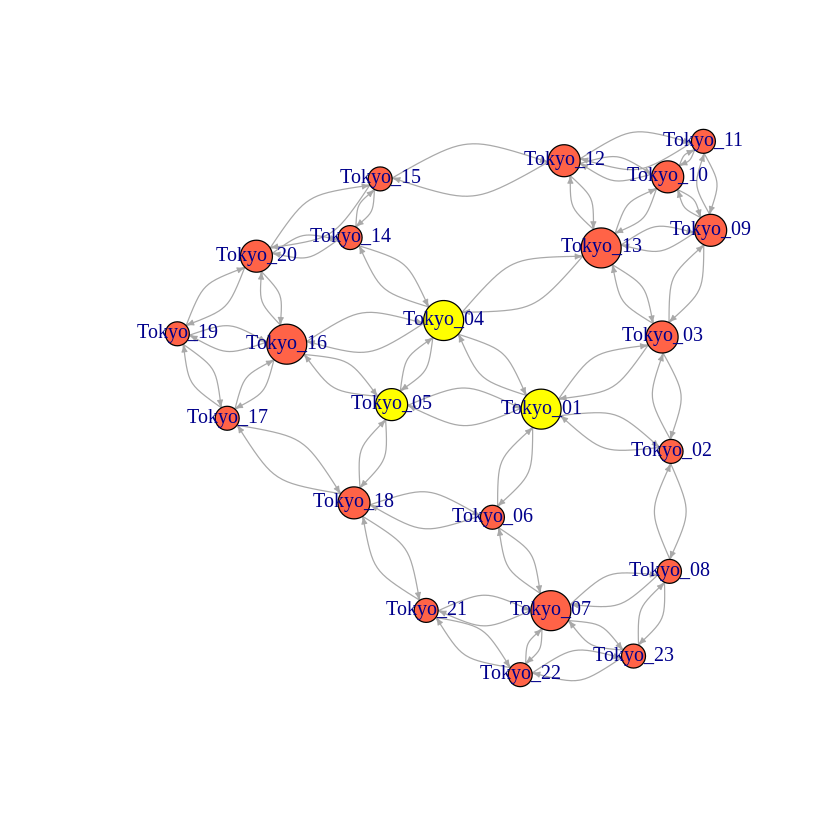

In [119]:
#plot graph
V(g)$color <- "tomato"
V(g)$color[national_nodes] <- "yellow"

deg <- degree(g, mode="all")
V(g)$size <- deg*1.5
l <- layout_nicely(g)
plot(g, edge.arrow.size=.3, vertex.label = V(g)$name, edge.curved=.5, layout=l)


#Igraph calculations

## Total traffic calculatons


## Calculations of the load, average number of packets, queueing and propagation delays:

Load for Local COs $0.3$;

Regional COs $0.5$;

Rational COs $0.4$

In [120]:
c(g_c10, data_av, data_99) := simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 10, calc_dist = 1, distance = 0.5, Load_local, Load_regional, Load_national, prefix_base, national_nodes, regional_nodes , N, Cs2)

#Simmer simulation

Including queuing, transmission, propagation delay

Output table with links information

Simulation of all traffic flows, comparision of experimental with theretical

[1] "start simulation in simmer"
Load =  0.3 
[1] 1
[1] "no info of traffic"
[1] 0
[1] 2
[1] "node_2"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_02->Tokyo_01
[1] "traffic_Tokyo_02_Tokyo_01_"
[1] 2
[1] "Node -  2 :"
[1] "variance= 2.08320212892857e-14"
[1] "sigma2= 1.4433302217194e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.3134825868831e-07"
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_02->Tokyo_01
[1] "variance= 2.06856087015151e-14"
[1] "sigma2= 1.43824923784145e-07"
[1] "igraph E(T) = 2.64201672078055e-06"
[1] "simmer E(T) = 2.63133882173965e-06"


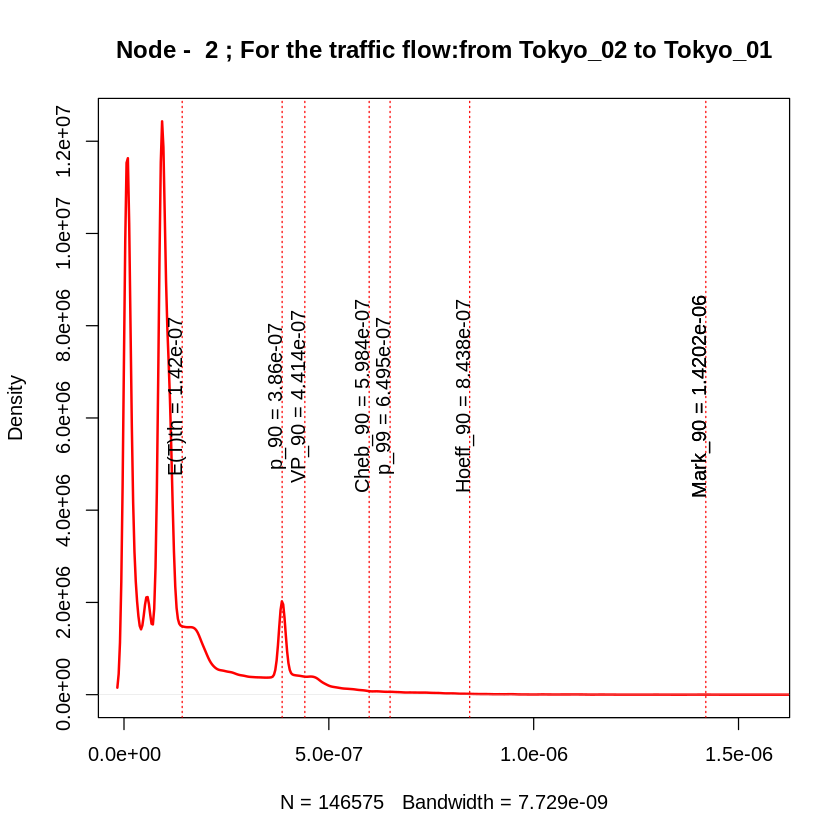

[1] 3
[1] "node_3"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "traffic_Tokyo_03_Tokyo_01_"
[1] 3
[1] "Node -  3 :"
[1] "variance= 2.08320212892857e-14"
[1] "sigma2= 1.4433302217194e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.3134825868831e-07"


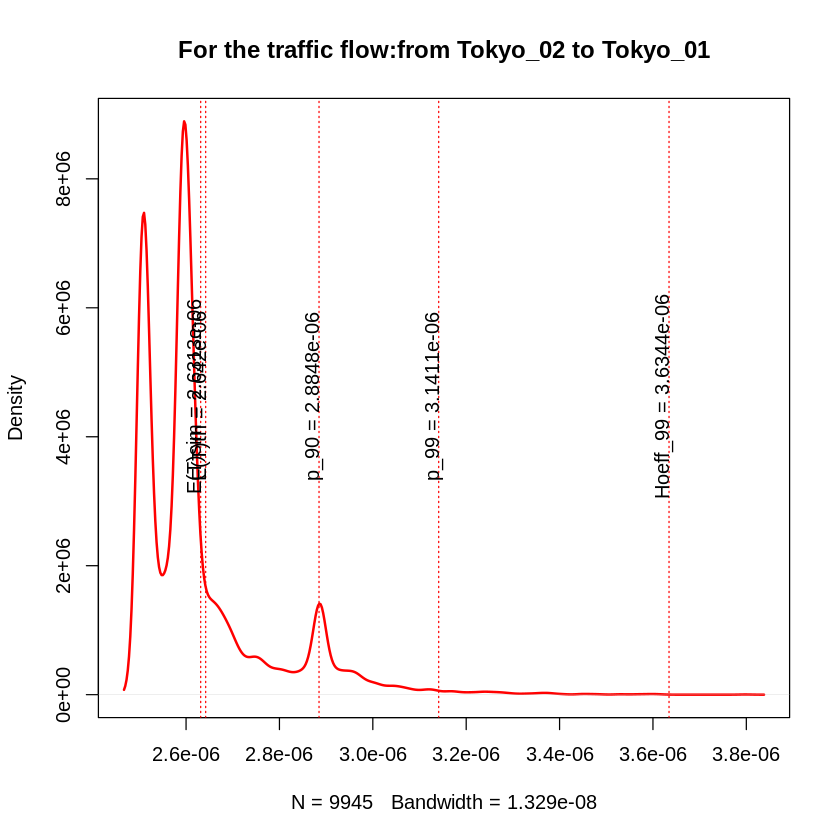

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "variance= 2.06856087015151e-14"
[1] "sigma2= 1.43824923784145e-07"
[1] "igraph E(T) = 2.64201672078055e-06"
[1] "simmer E(T) = 2.63133882173965e-06"


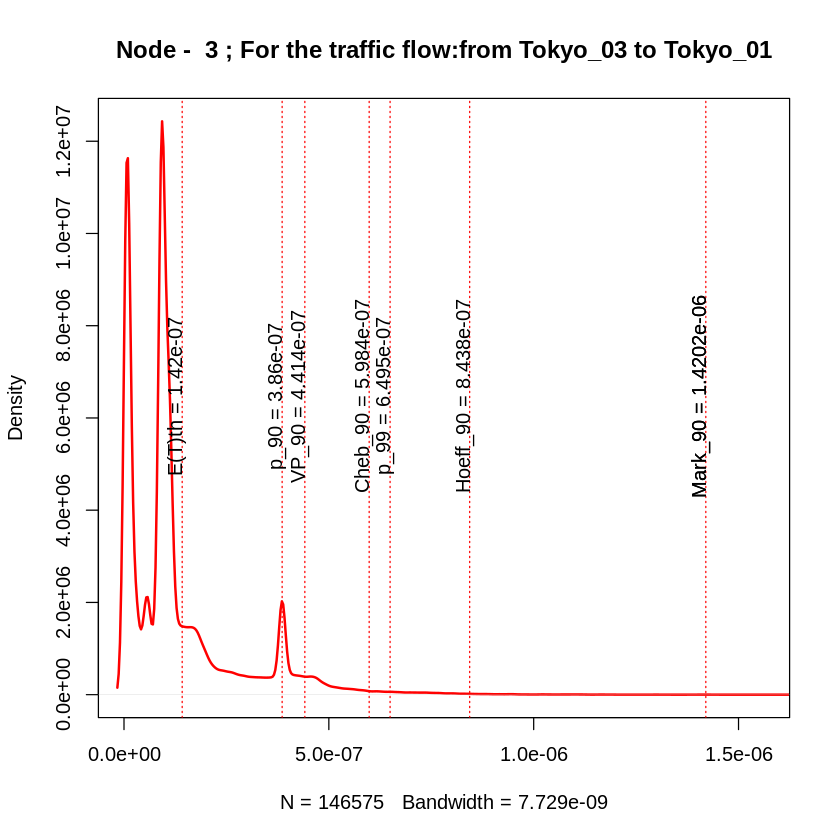

[1] 4
[1] "no info of traffic"
[1] 0.000000e+00 2.631339e-06 2.631339e-06 0.000000e+00
[1] 5
[1] "no info of traffic"
[1] 0.000000e+00 2.631339e-06 2.631339e-06 0.000000e+00 0.000000e+00
[1] 6
[1] "node_6"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "traffic_Tokyo_06_Tokyo_01_"
[1] 6
[1] "Node -  6 :"
[1] "variance= 2.08320212892857e-14"
[1] "sigma2= 1.4433302217194e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.3134825868831e-07"


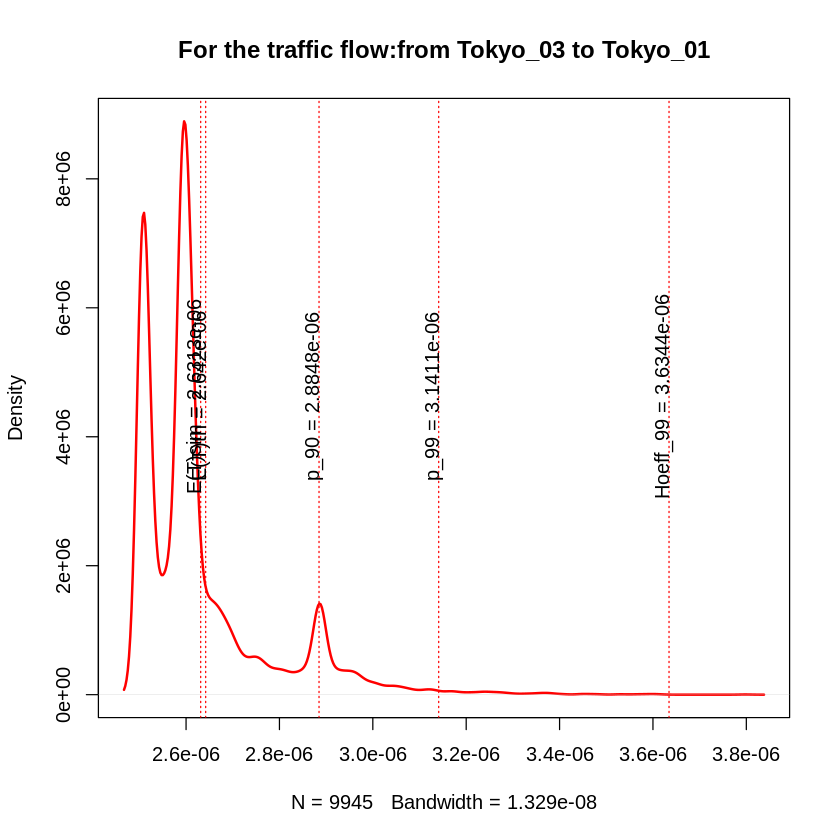

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "variance= 2.06856087015139e-14"
[1] "sigma2= 1.43824923784141e-07"
[1] "igraph E(T) = 2.14201672078055e-06"
[1] "simmer E(T) = 2.13133882173934e-06"


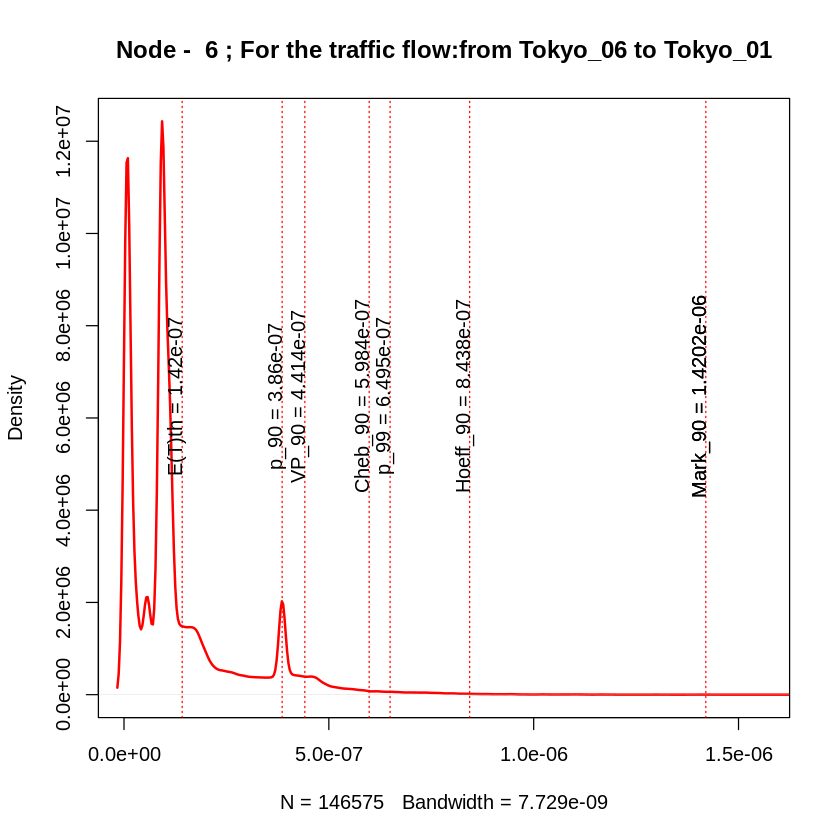

[1] 7
[1] "node_6"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_07->Tokyo_06
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "traffic_Tokyo_07_Tokyo_01_"
[1] 7
[1] "Node -  7 :"
[1] "variance= 1.92701683502106e-12"
[1] "sigma2= 1.38817031916875e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.22830180142722e-06"


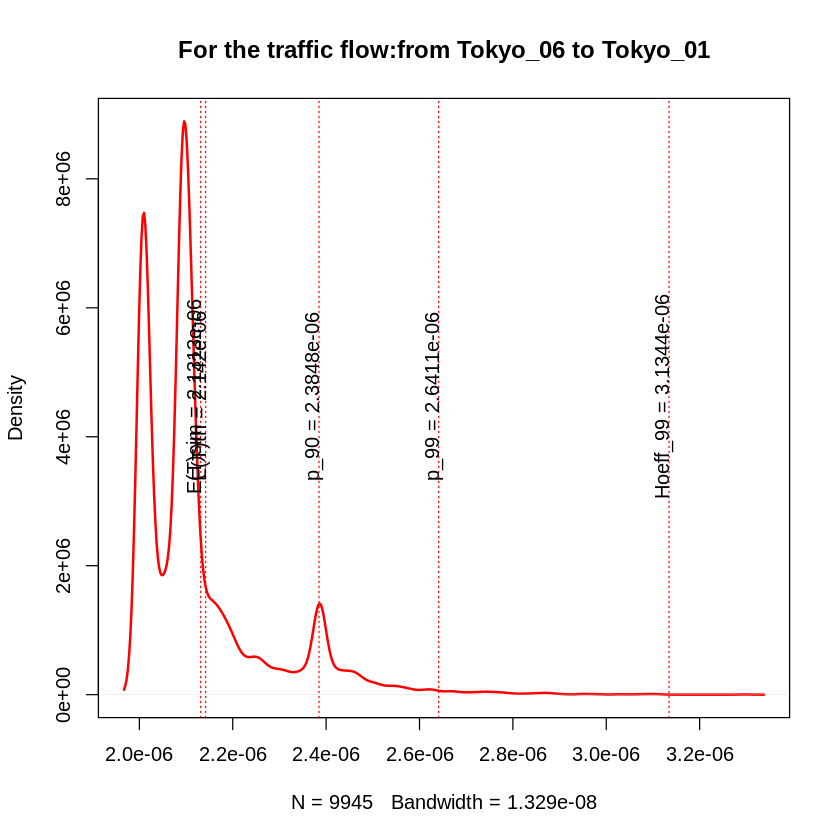

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_07->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 2.11307632093932e-14"
[1] "sigma2= 1.45364243228496e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.31746915138208e-07"


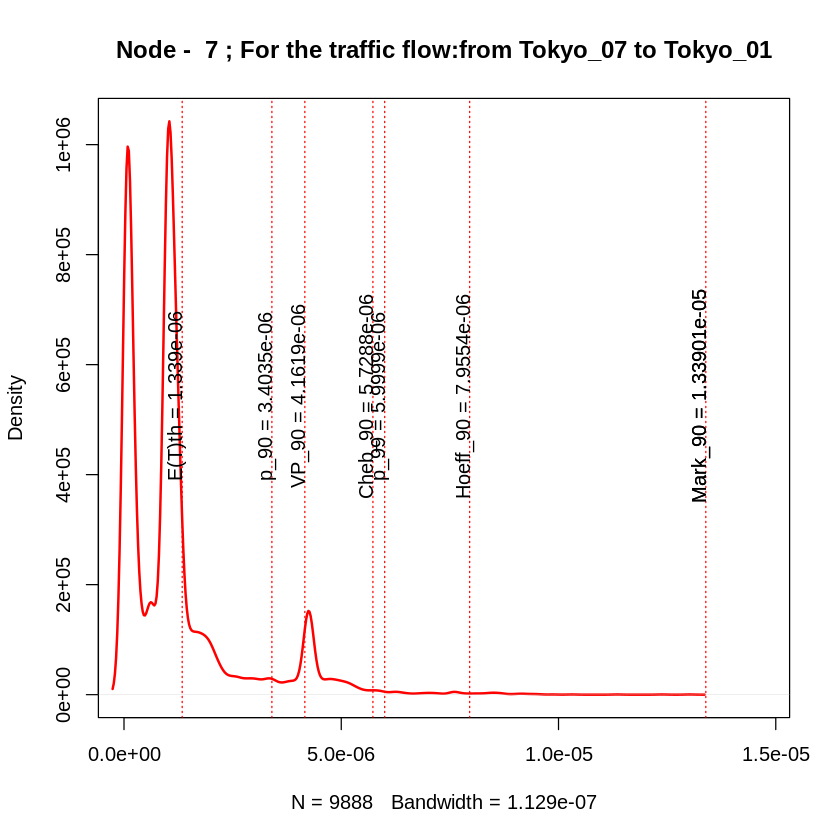

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "variance= 1.94797704145592e-12"
[1] "sigma2= 1.39569948106887e-06"
[1] "igraph E(T) = 5.48103151671143e-06"
[1] "simmer E(T) = 5.36262892101129e-06"


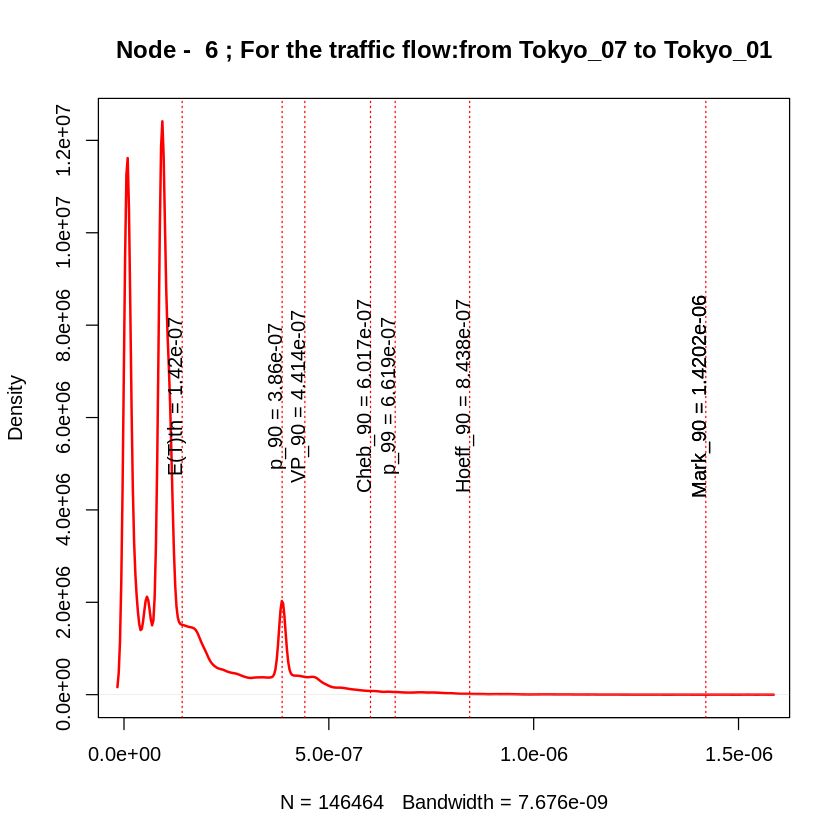

[1] 8
[1] "node_2"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_08->Tokyo_02
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_02->Tokyo_01
[1] "traffic_Tokyo_08_Tokyo_01_"
[1] 8
[1] "Node -  8 :"
[1] "variance= 1.81242400927212e-12"
[1] "sigma2= 1.34626297923998e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.2217058367389e-06"


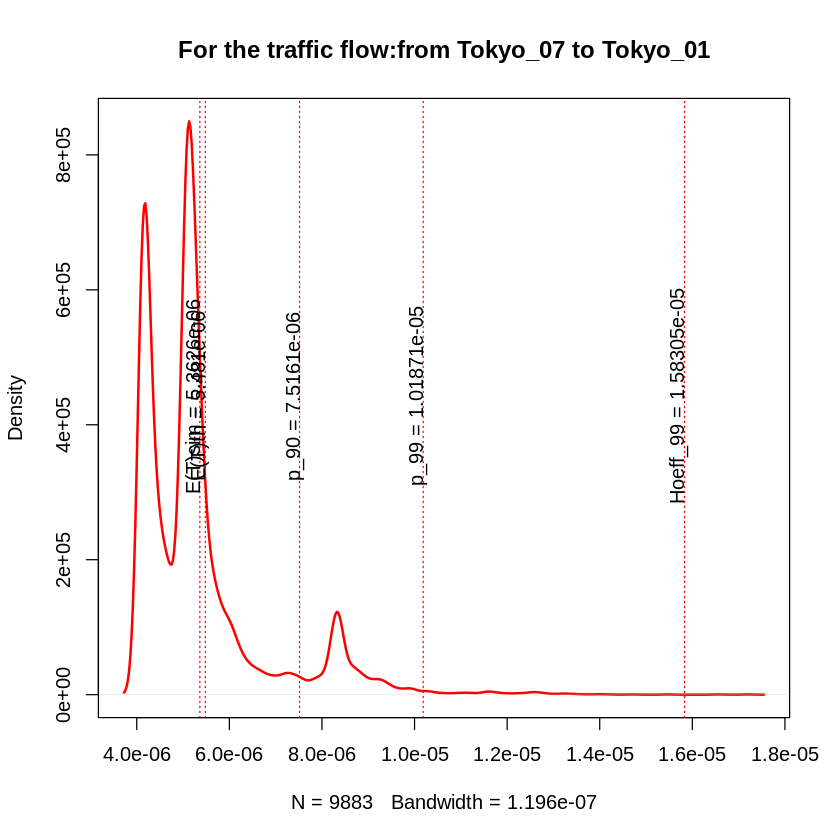

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_08->Tokyo_02
[1] 2
[1] "Node -  2 :"
[1] "variance= 2.09979453827503e-14"
[1] "sigma2= 1.4490667818548e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.31607692137095e-07"


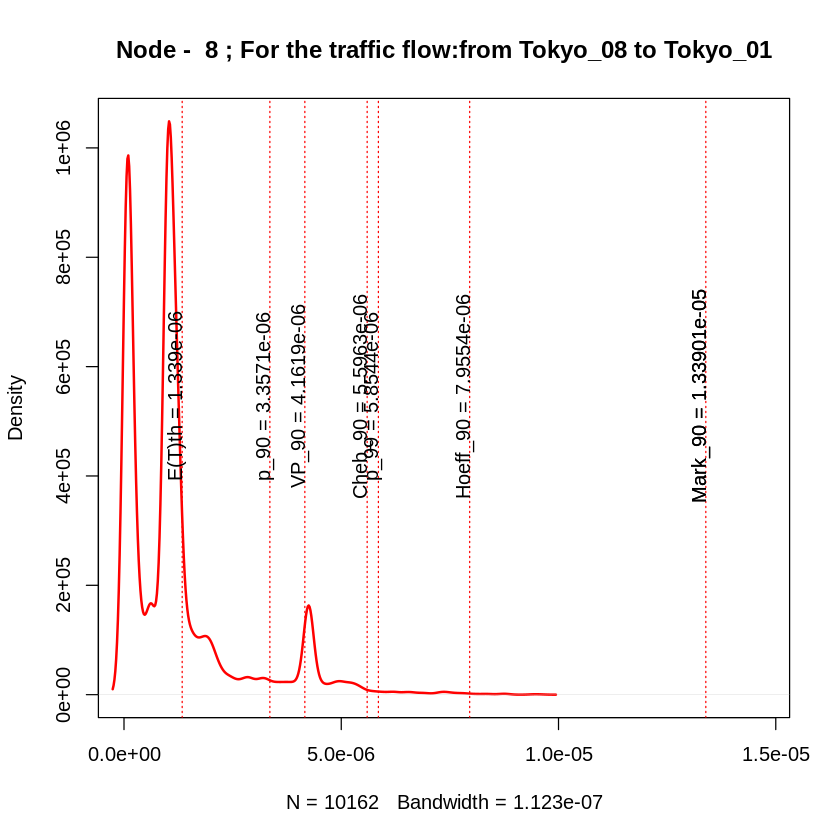

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_02->Tokyo_01
[1] "variance= 1.83853861607949e-12"
[1] "sigma2= 1.35592721636505e-06"
[1] "igraph E(T) = 6.48103151671143e-06"
[1] "simmer E(T) = 6.35478229910374e-06"


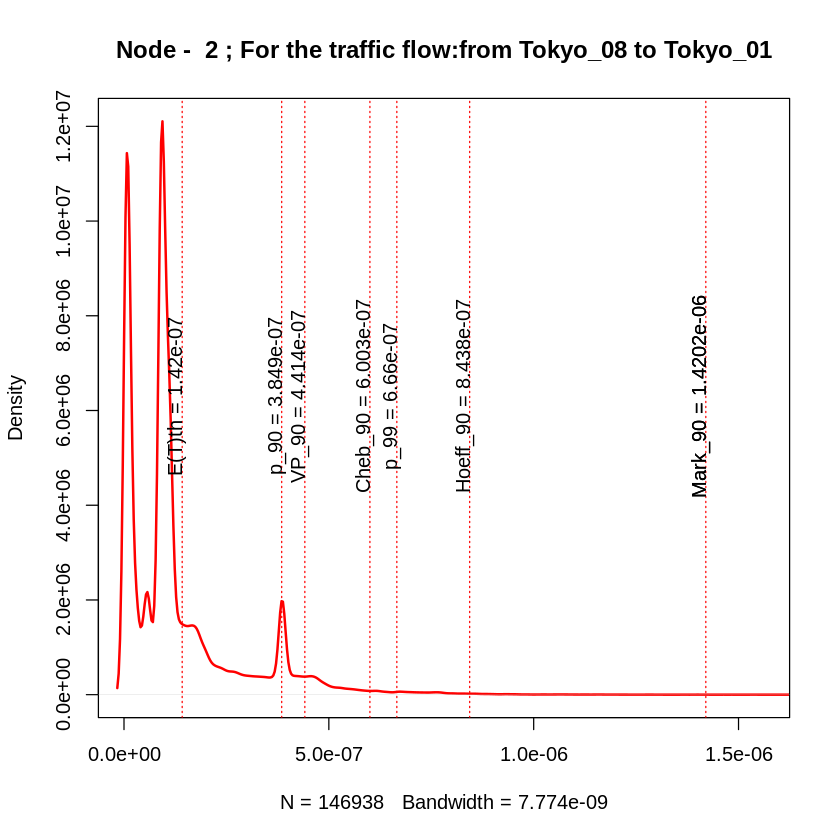

[1] 9
[1] "node_3"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_09->Tokyo_03
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "traffic_Tokyo_09_Tokyo_01_"
[1] 9
[1] "Node -  9 :"
[1] "variance= 1.81242400927212e-12"
[1] "sigma2= 1.34626297923998e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.2217058367389e-06"


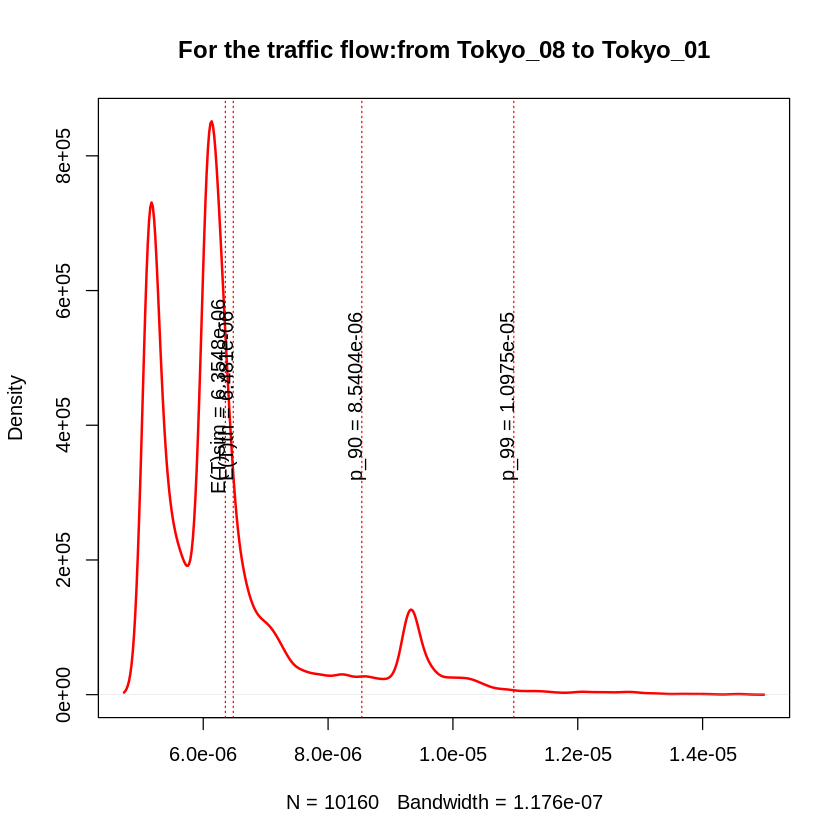

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_09->Tokyo_03
[1] 3
[1] "Node -  3 :"
[1] "variance= 2.09979453827503e-14"
[1] "sigma2= 1.4490667818548e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.31607692137095e-07"


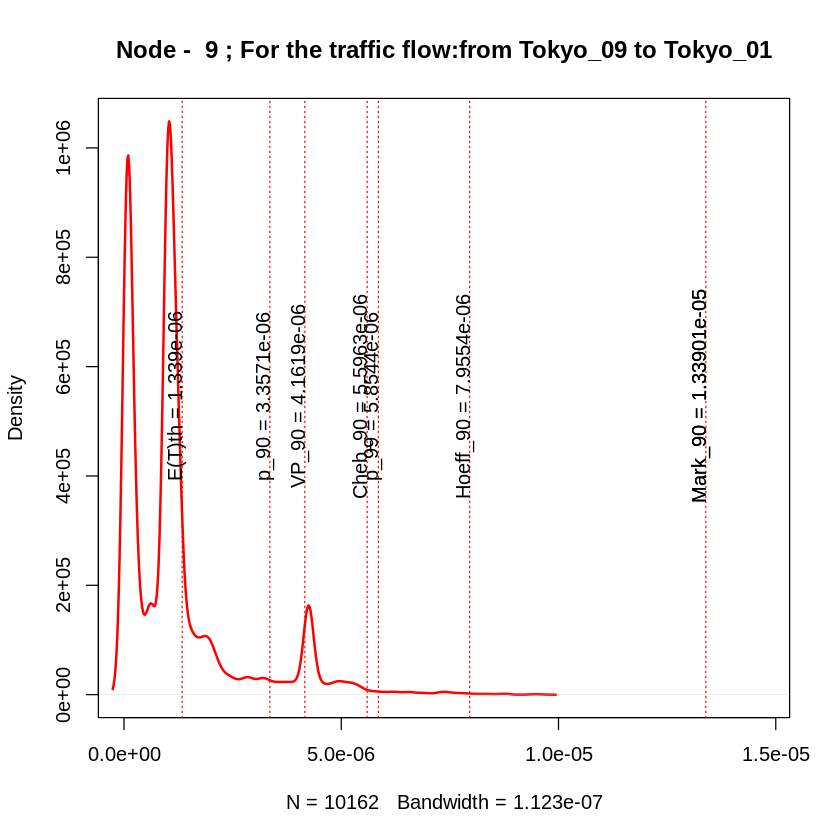

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "variance= 1.83853861607949e-12"
[1] "sigma2= 1.35592721636505e-06"
[1] "igraph E(T) = 6.48103151671143e-06"
[1] "simmer E(T) = 6.35478229910374e-06"


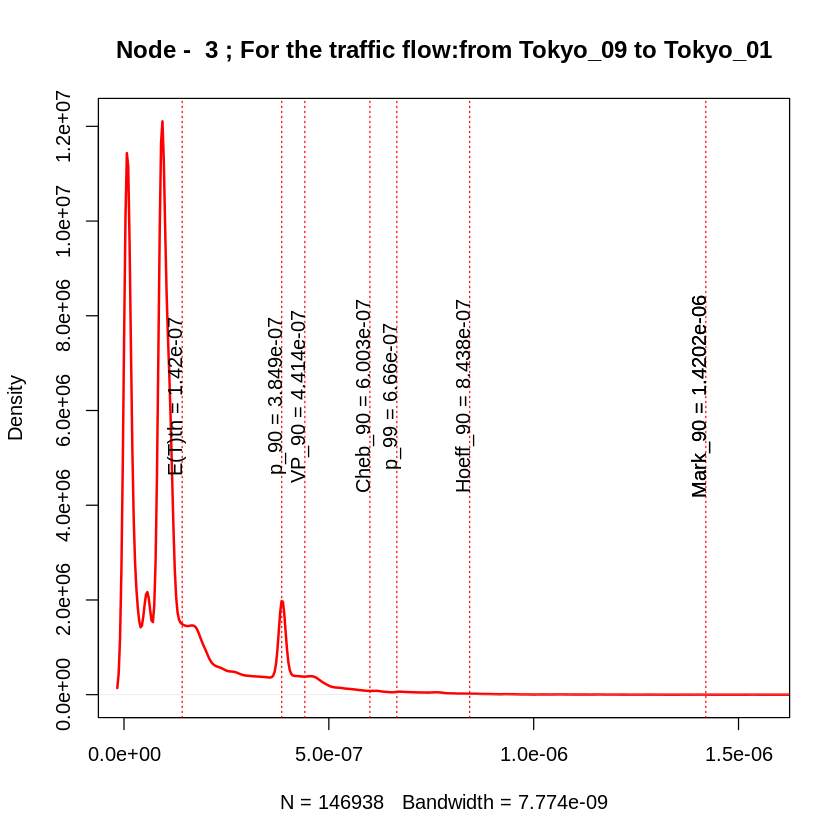

[1] 10
[1] "node_10"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
[1] "node_13"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_10->Tokyo_13
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "traffic_Tokyo_10_Tokyo_04_"
[1] 10
[1] "Node -  10 :"
[1] "variance= 4.08378556980504e-12"
[1] "sigma2= 2.02083783857217e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.78619060025677e-06"


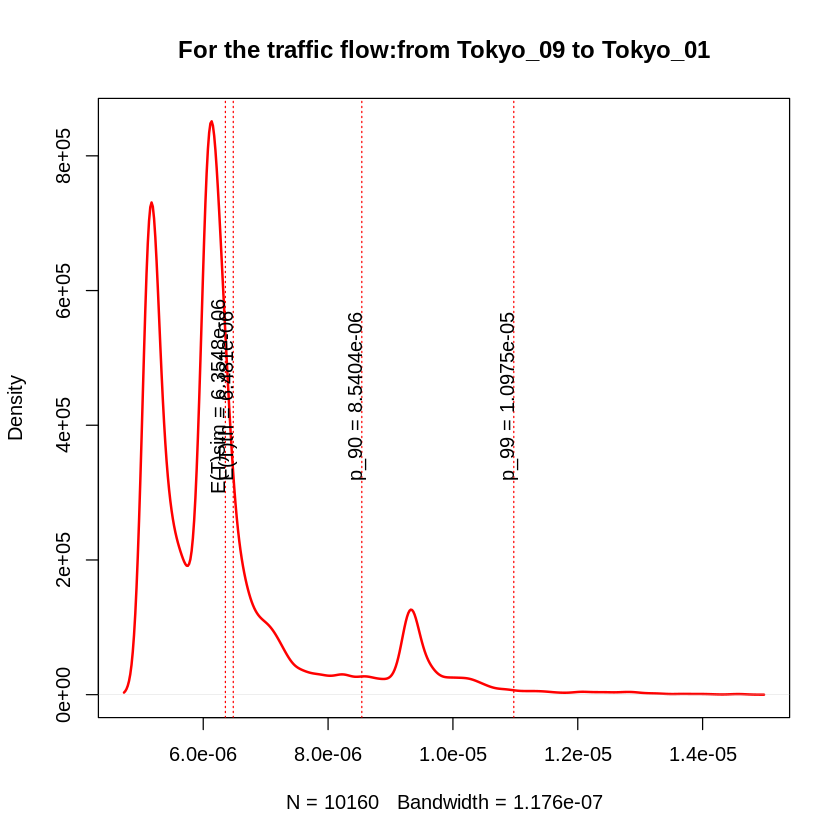

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_10->Tokyo_13
[1] 13
[1] "Node -  13 :"
[1] "variance= 2.12359969079542e-14"
[1] "sigma2= 1.4572575924645e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.32806124055512e-07"


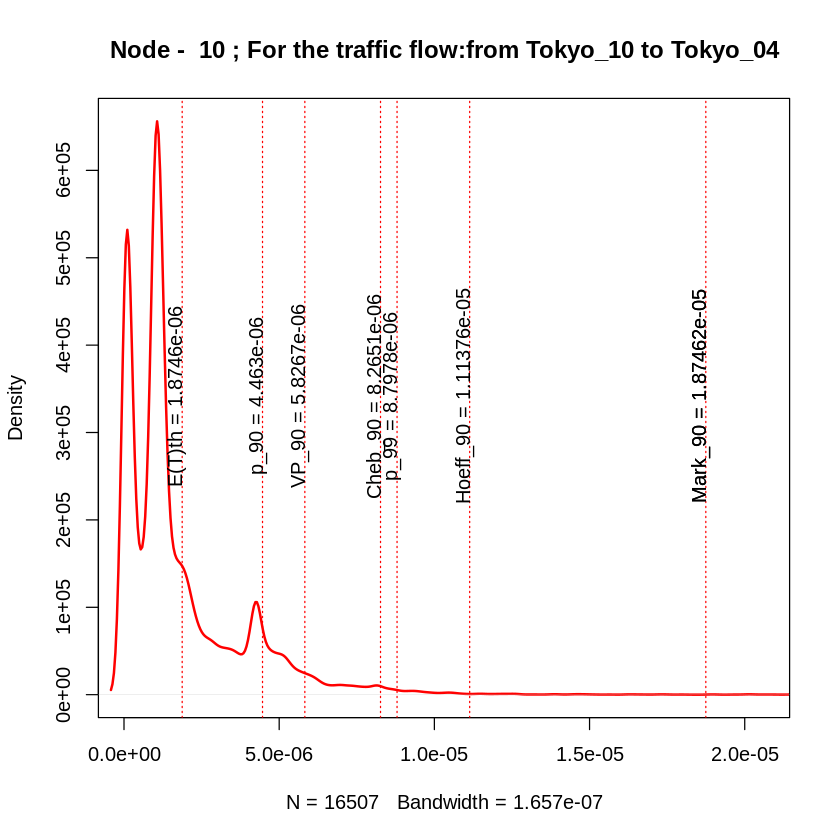

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "variance= 3.98530246726451e-12"
[1] "sigma2= 1.99632223532788e-06"
[1] "igraph E(T) = 6.01663743508379e-06"
[1] "simmer E(T) = 5.9201281402129e-06"


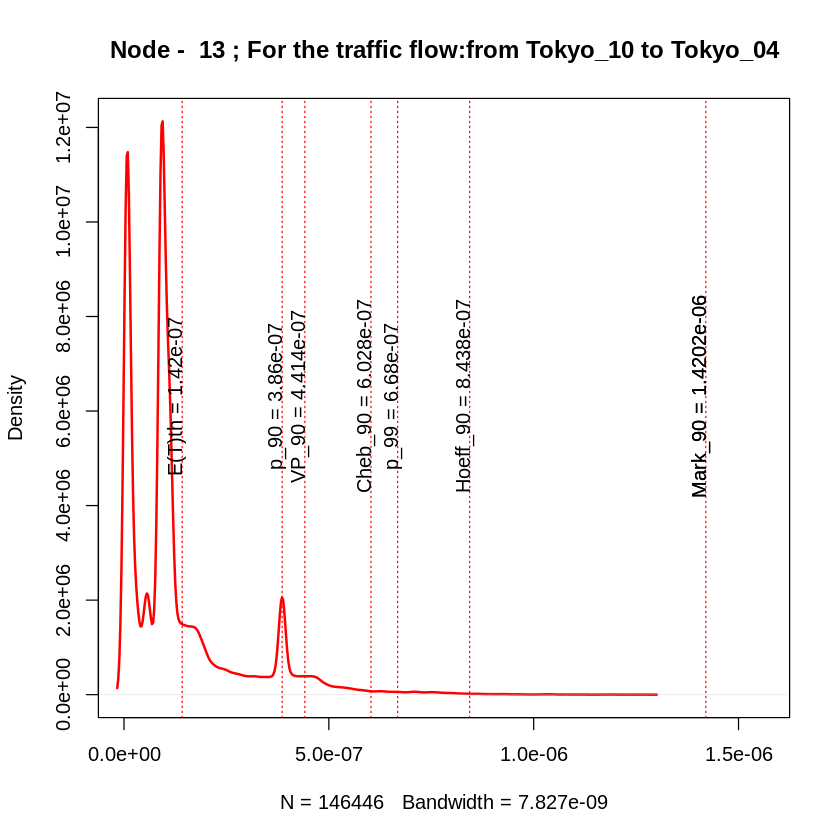

[1] 11
[1] "node_3"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_11->Tokyo_09
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_09->Tokyo_03
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "traffic_Tokyo_11_Tokyo_01_"
[1] 11
[1] "Node -  11 :"
[1] "variance= 1.94652575532063e-12"
[1] "sigma2= 1.39517947064907e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.25015869458879e-06"


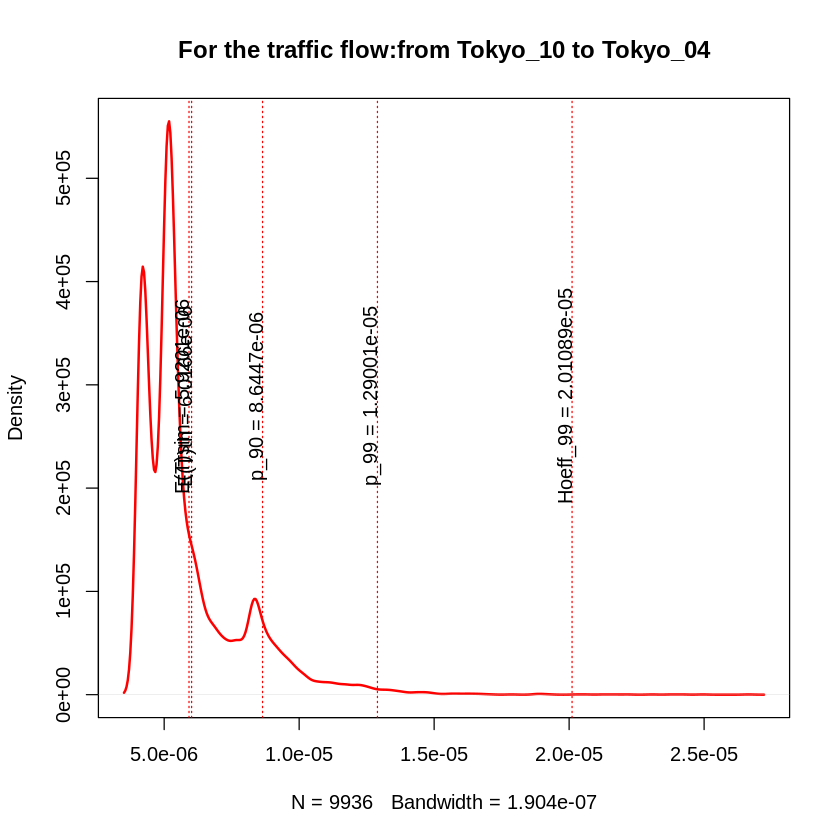

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_11->Tokyo_09
[1] 9
[1] "Node -  9 :"
[1] "variance= 1.89851724602619e-12"
[1] "sigma2= 1.3778669188373e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.22297461777462e-06"


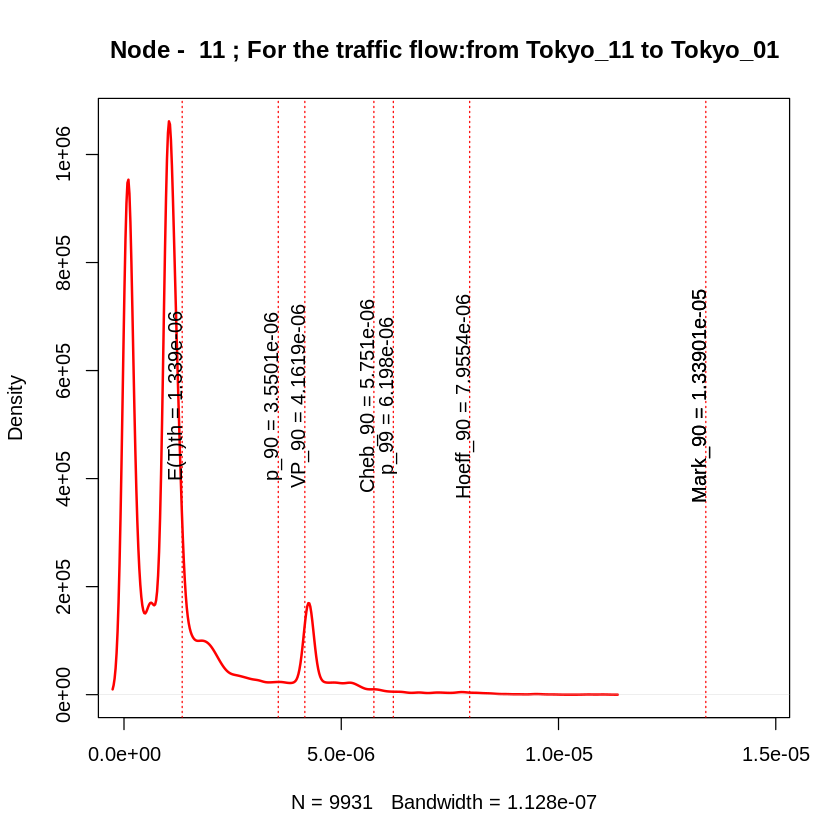

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_09->Tokyo_03
[1] 3
[1] "Node -  3 :"
[1] "variance= 2.11976062306628e-14"
[1] "sigma2= 1.455939773159e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.31864052685857e-07"


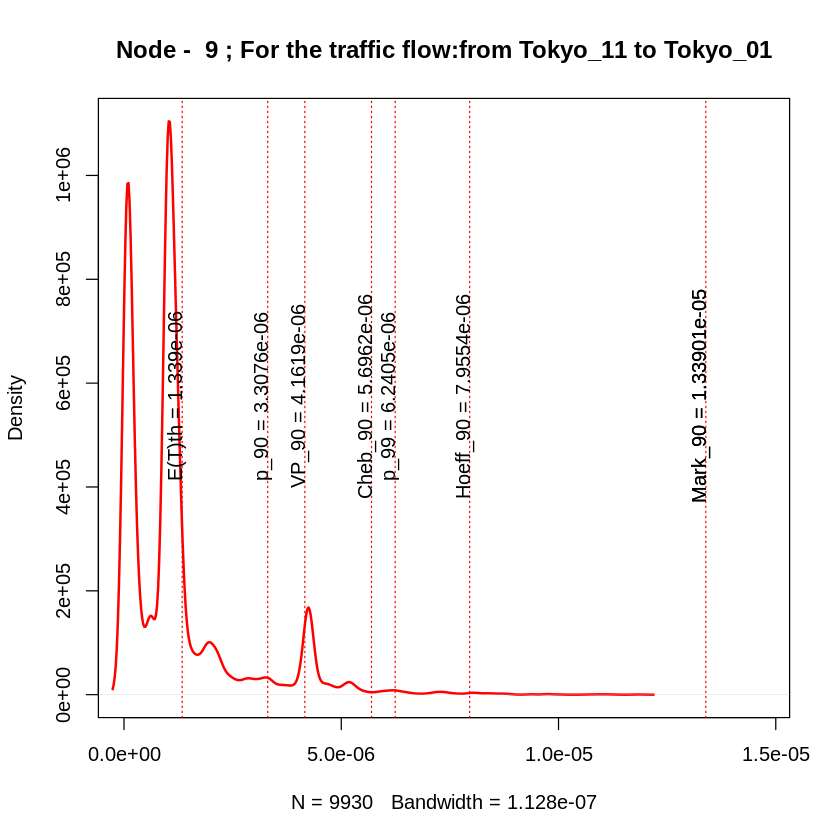

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_01
[1] "variance= 3.853498752682e-12"
[1] "sigma2= 1.96303304930966e-06"
[1] "igraph E(T) = 1.03200463126423e-05"
[1] "simmer E(T) = 1.01075461665065e-05"


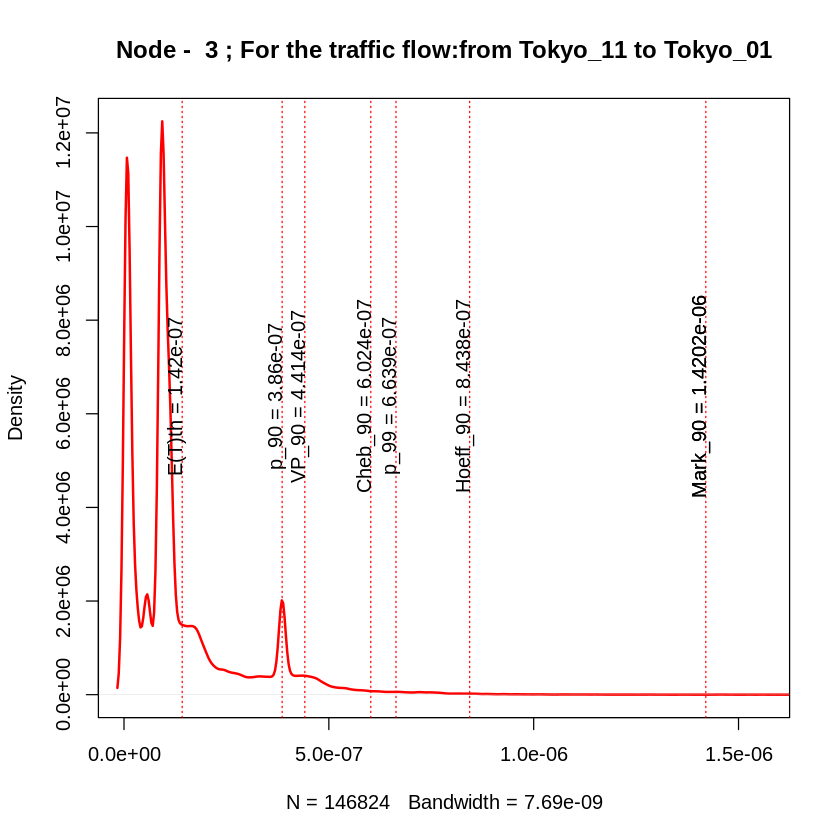

[1] 12
[1] "node_12"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
[1] "node_13"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_12->Tokyo_13
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "traffic_Tokyo_12_Tokyo_04_"
[1] 12
[1] "Node -  12 :"
[1] "variance= 4.08378556980504e-12"
[1] "sigma2= 2.02083783857217e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.78619060025677e-06"


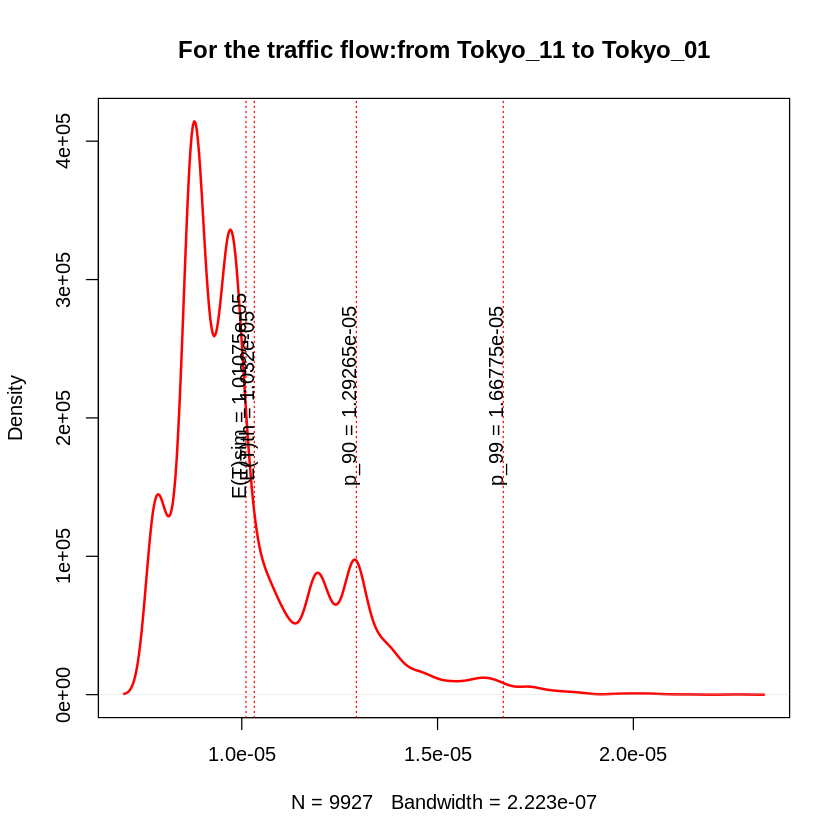

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_12->Tokyo_13
[1] 13
[1] "Node -  13 :"
[1] "variance= 2.12359969079542e-14"
[1] "sigma2= 1.4572575924645e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.32806124055512e-07"


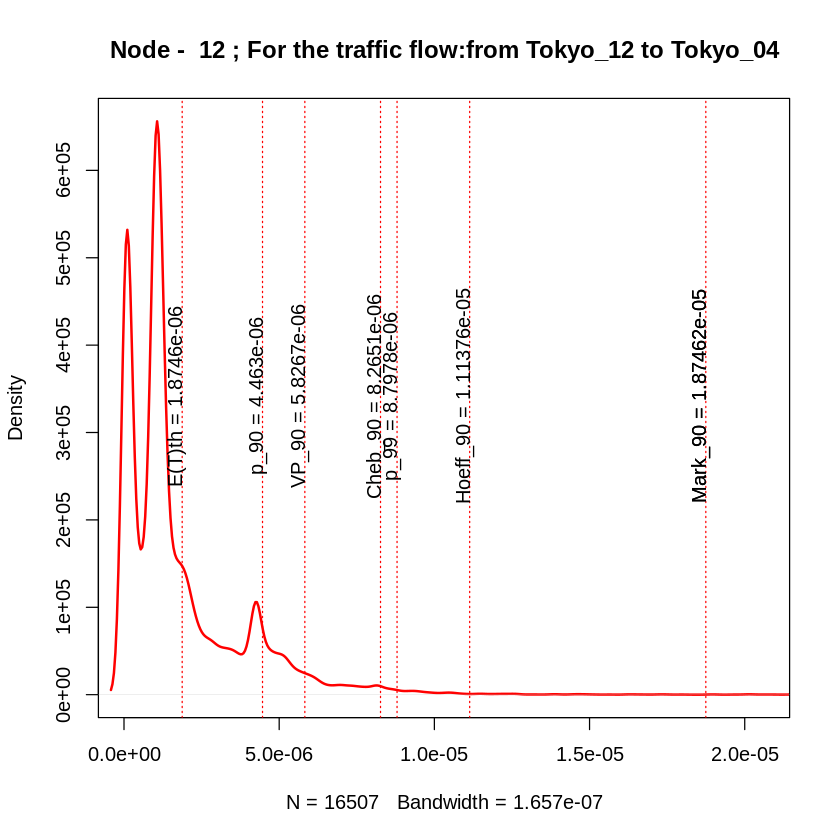

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "variance= 3.98530246726451e-12"
[1] "sigma2= 1.99632223532788e-06"
[1] "igraph E(T) = 6.01663743508379e-06"
[1] "simmer E(T) = 5.9201281402129e-06"


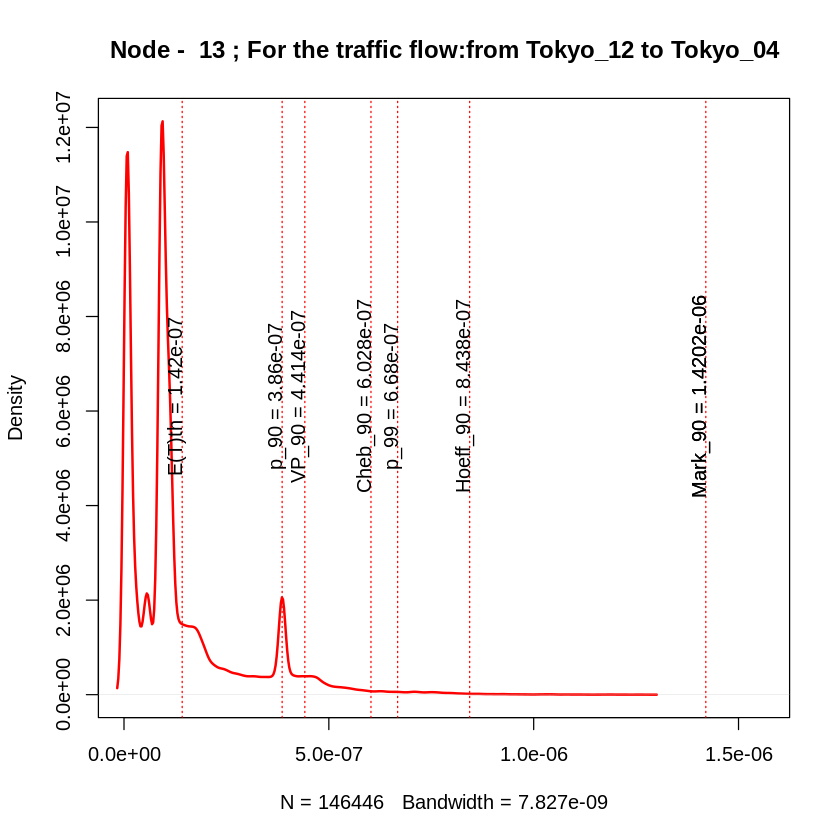

[1] 13
[1] "node_13"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "traffic_Tokyo_13_Tokyo_04_"
[1] 13
[1] "Node -  13 :"
[1] "variance= 2.08320212892857e-14"
[1] "sigma2= 1.4433302217194e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.3134825868831e-07"


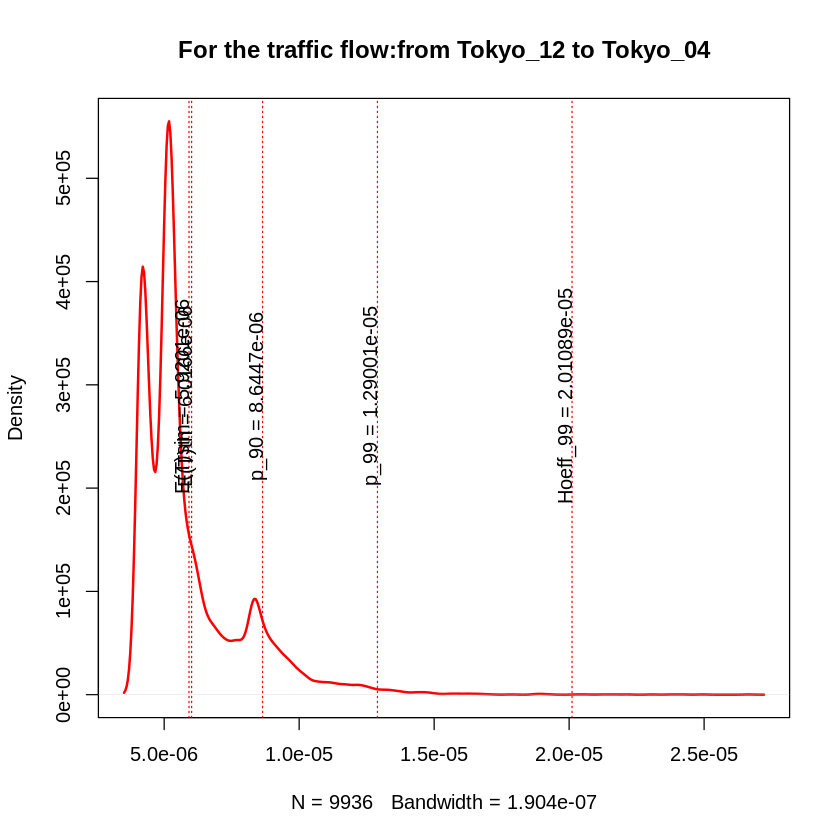

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_04
[1] "variance= 2.06856087015139e-14"
[1] "sigma2= 1.43824923784141e-07"
[1] "igraph E(T) = 2.14201672078055e-06"
[1] "simmer E(T) = 2.13133882173934e-06"


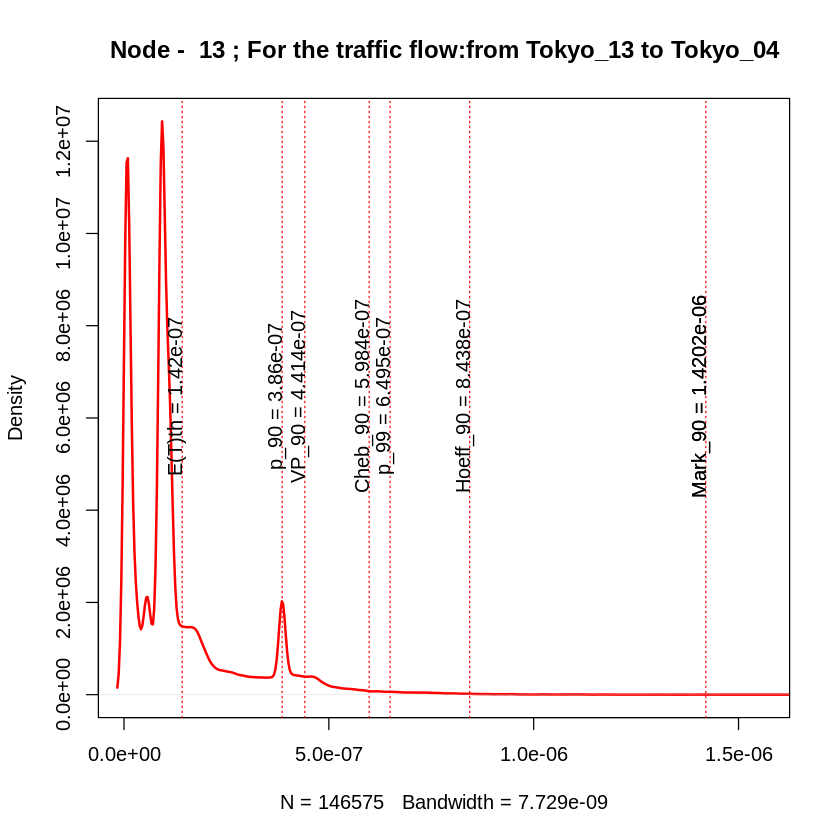

[1] 14
[1] "node_14"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "traffic_Tokyo_14_Tokyo_04_"
[1] 14
[1] "Node -  14 :"
[1] "variance= 2.08320212892857e-14"
[1] "sigma2= 1.4433302217194e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.3134825868831e-07"


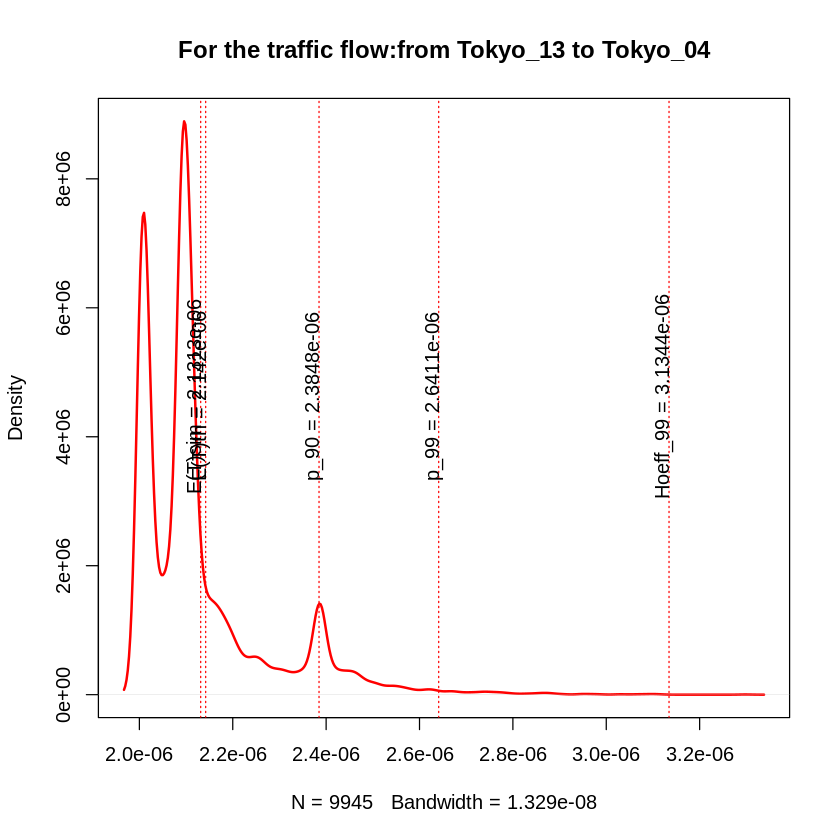

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "variance= 2.06856087015212e-14"
[1] "sigma2= 1.43824923784166e-07"
[1] "igraph E(T) = 1.64201672078055e-06"
[1] "simmer E(T) = 1.63133882174042e-06"


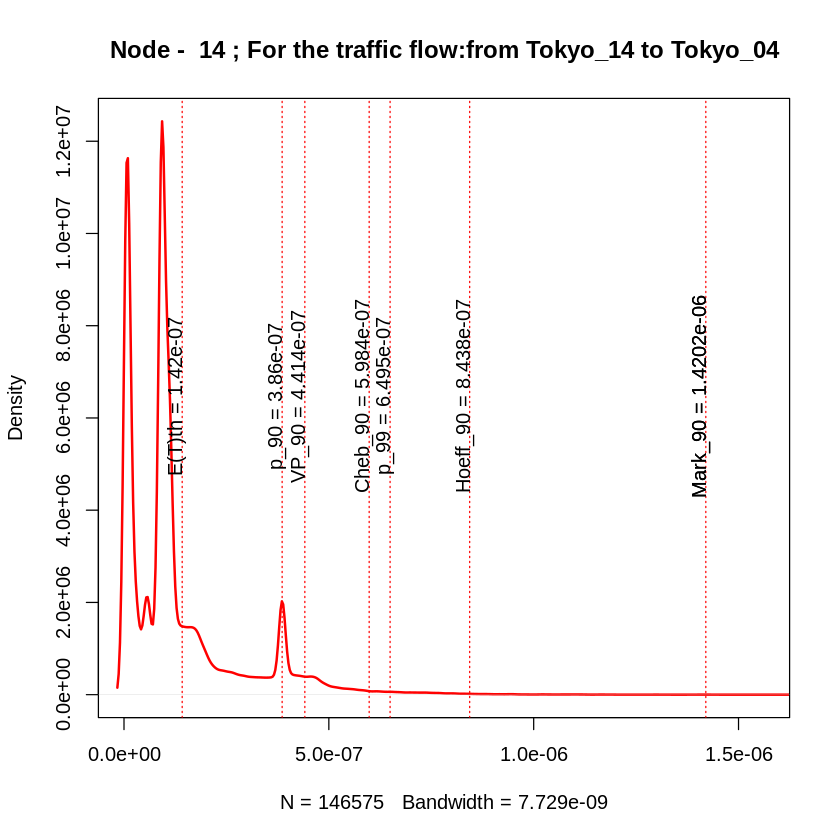

[1] 15
[1] "node_14"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_15->Tokyo_14
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "traffic_Tokyo_15_Tokyo_04_"
[1] 15
[1] "Node -  15 :"
[1] "variance= 1.90444155160388e-12"
[1] "sigma2= 1.38001505484682e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.2364068411858e-06"


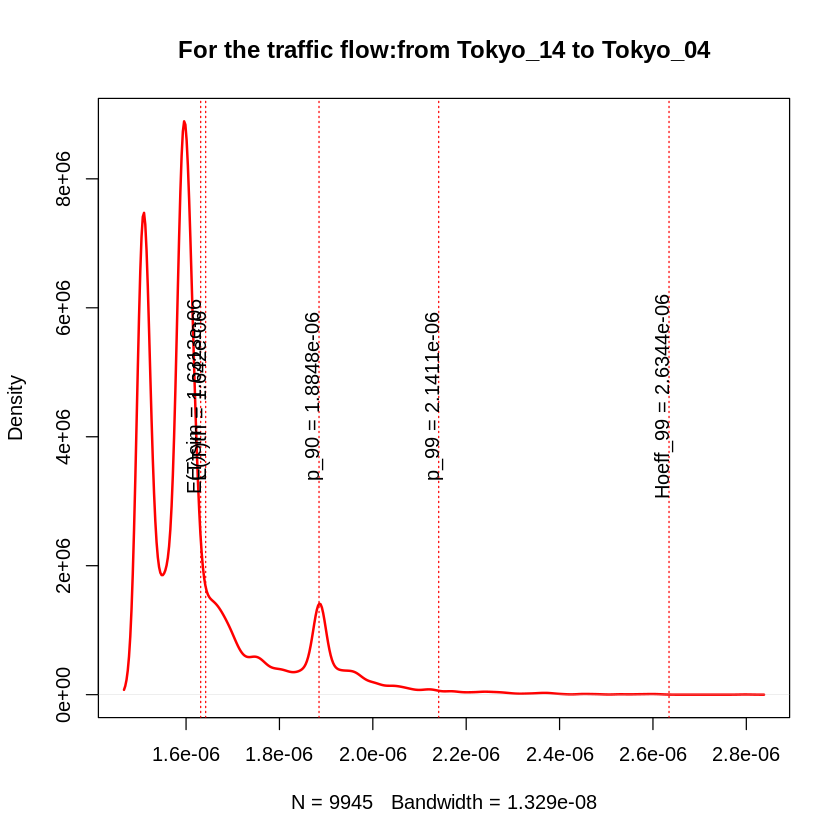

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_15->Tokyo_14
[1] 14
[1] "Node -  14 :"
[1] "variance= 2.05772266748171e-14"
[1] "sigma2= 1.4344764436831e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.30744222657493e-07"


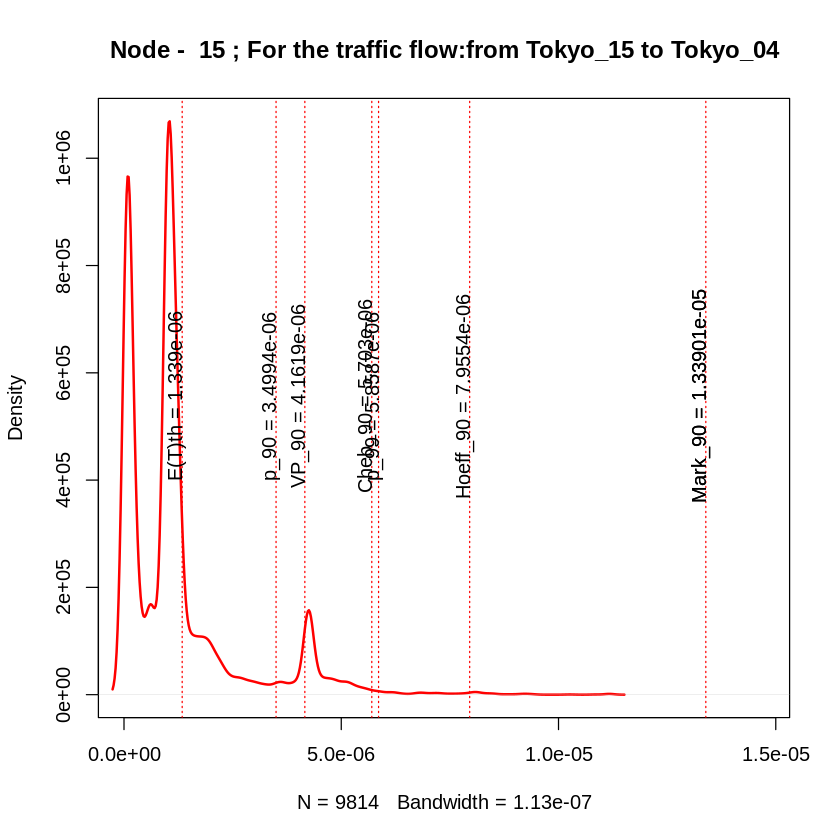

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "variance= 1.92421410209918e-12"
[1] "sigma2= 1.38716044569443e-06"
[1] "igraph E(T) = 4.48103151671143e-06"
[1] "simmer E(T) = 4.36704739211619e-06"


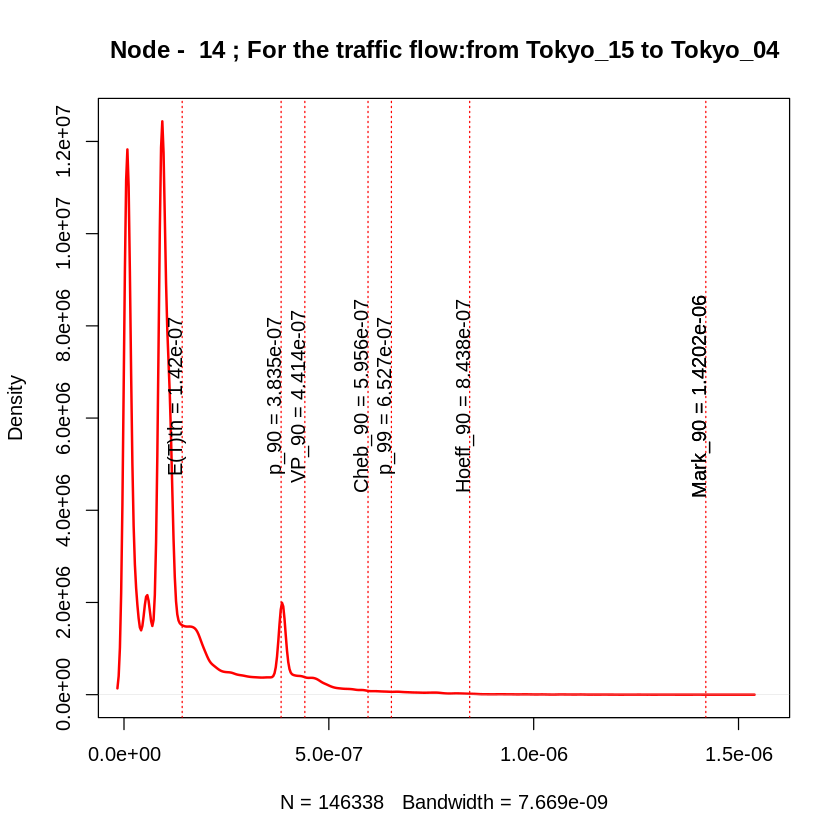

[1] 16
[1] "node_16"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "traffic_Tokyo_16_Tokyo_04_"
[1] 16
[1] "Node -  16 :"
[1] "variance= 2.08320212892857e-14"
[1] "sigma2= 1.4433302217194e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.3134825868831e-07"


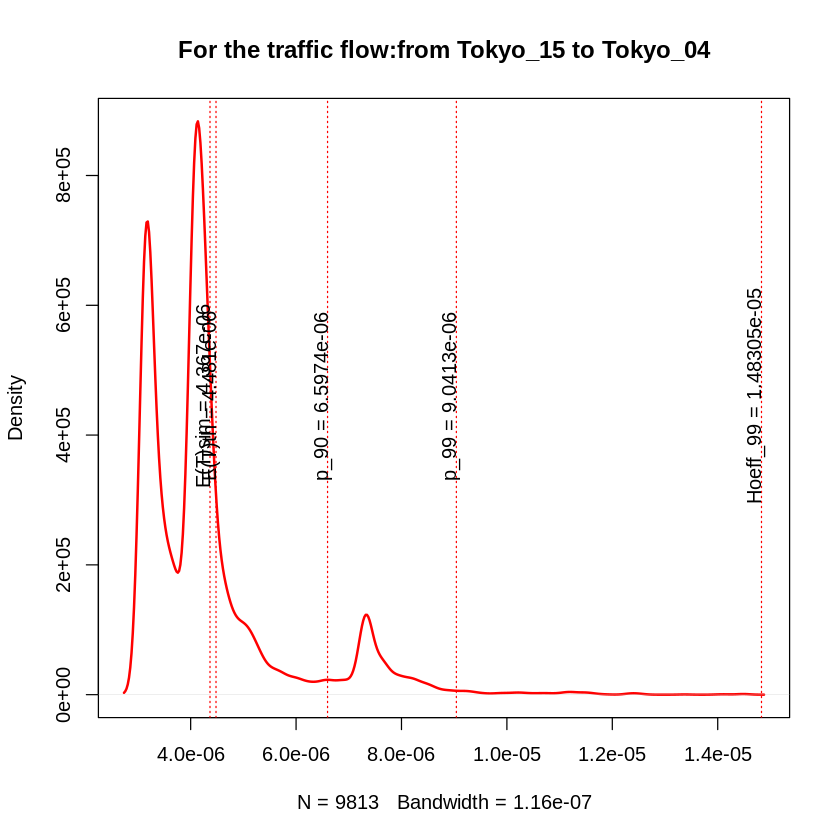

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "variance= 2.06856087015212e-14"
[1] "sigma2= 1.43824923784166e-07"
[1] "igraph E(T) = 1.64201672078055e-06"
[1] "simmer E(T) = 1.63133882174042e-06"


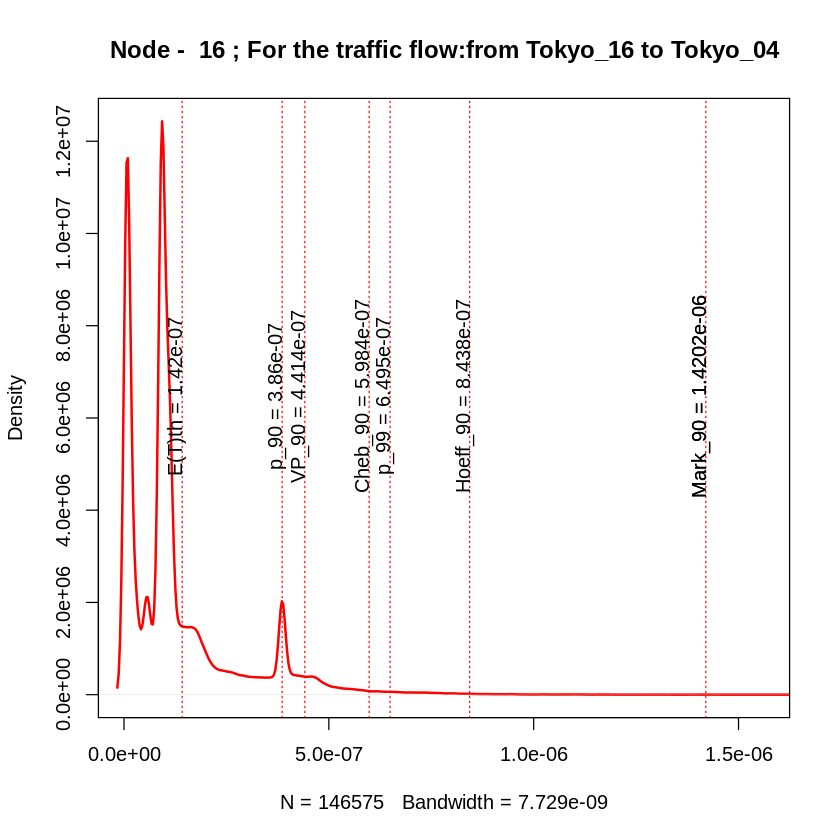

[1] 17
[1] "node_17"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
[1] "node_16"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_17->Tokyo_16
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "traffic_Tokyo_17_Tokyo_04_"
[1] 17
[1] "Node -  17 :"
[1] "variance= 4.05306935130472e-12"
[1] "sigma2= 2.01322362178292e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.80923196697311e-06"


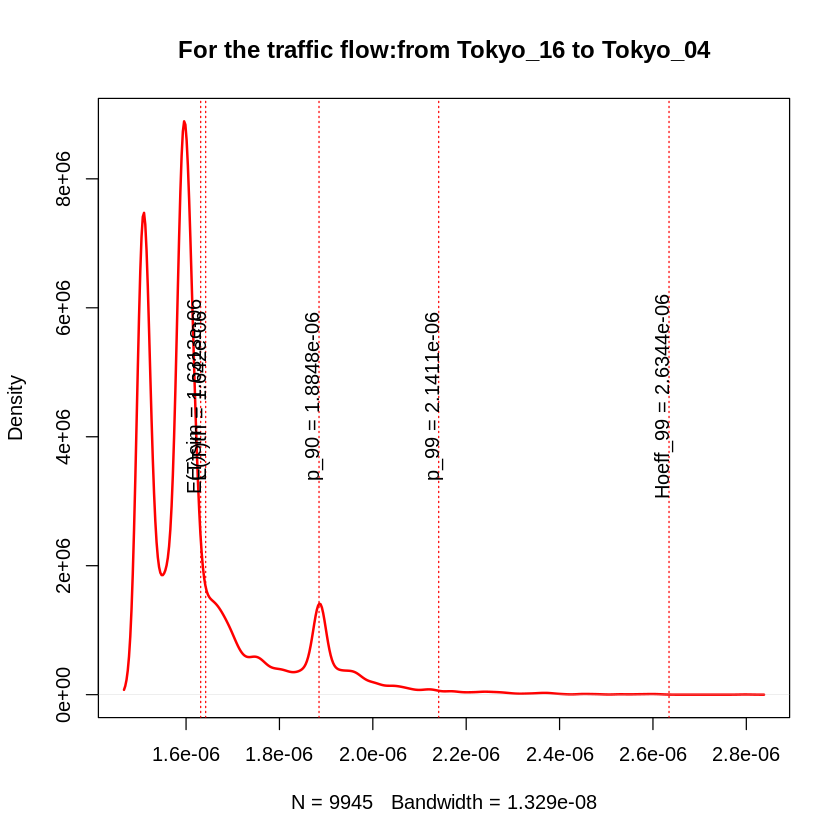

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_17->Tokyo_16
[1] 16
[1] "Node -  16 :"
[1] "variance= 2.13399110052297e-14"
[1] "sigma2= 1.46081864053105e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.3253371718845e-07"


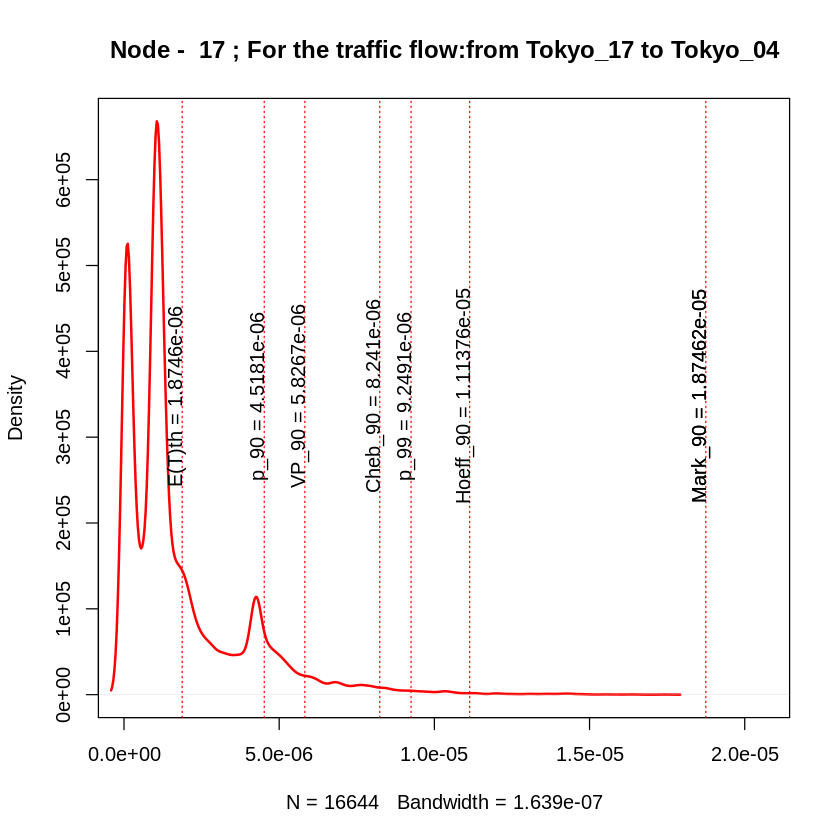

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "variance= 4.13940868208593e-12"
[1] "sigma2= 2.03455368129866e-06"
[1] "igraph E(T) = 4.51663743508379e-06"
[1] "simmer E(T) = 4.441679961505e-06"


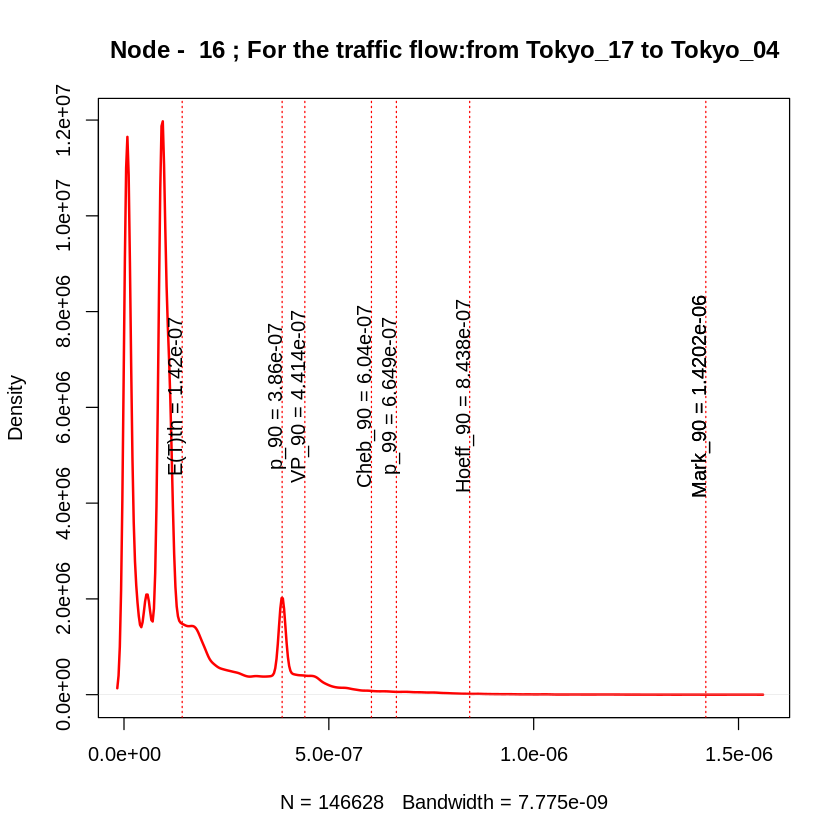

[1] 18
[1] "node_18"
[1] 4906603
[1] 0.4
[1] 1594646
[1] 367995.2
[1] 1962641
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_18->Tokyo_05
[1] "traffic_Tokyo_18_Tokyo_05_"
[1] 18
[1] "Node -  18 :"
[1] "variance= 1.57391327345443e-13"
[1] "sigma2= 3.96725758358898e-07"
[1] "igraph E(T) = 3.90545982146508e-07"
[1] "simmer E(T) = 3.59440588869701e-07"


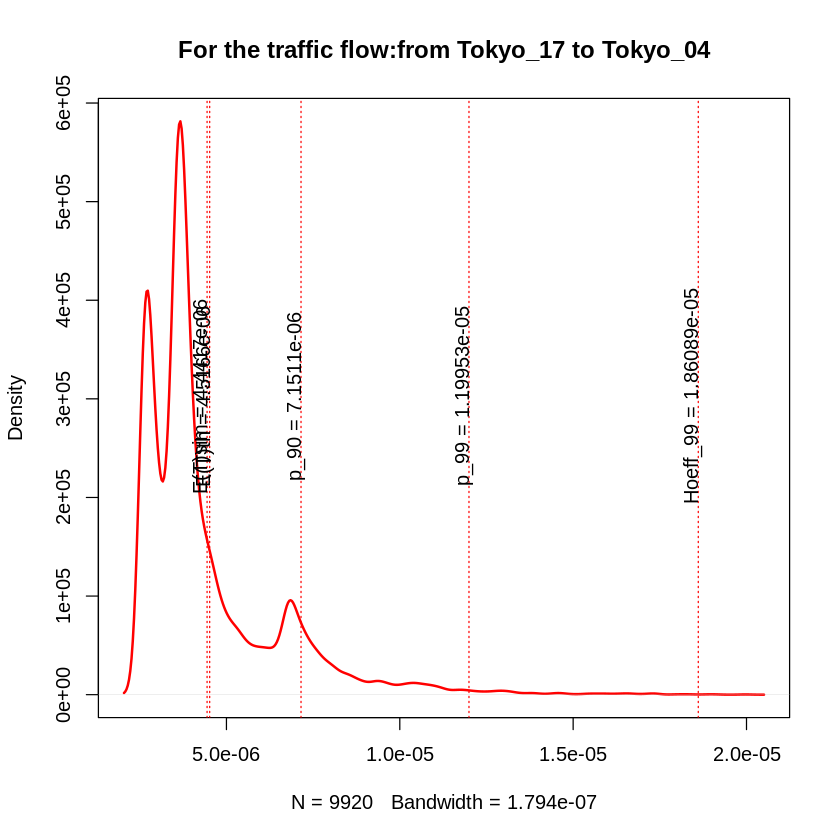

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_18->Tokyo_05
[1] "variance= 1.59387753269928e-13"
[1] "sigma2= 3.99233958062097e-07"
[1] "igraph E(T) = 1.89054598214651e-06"
[1] "simmer E(T) = 1.86102150110225e-06"


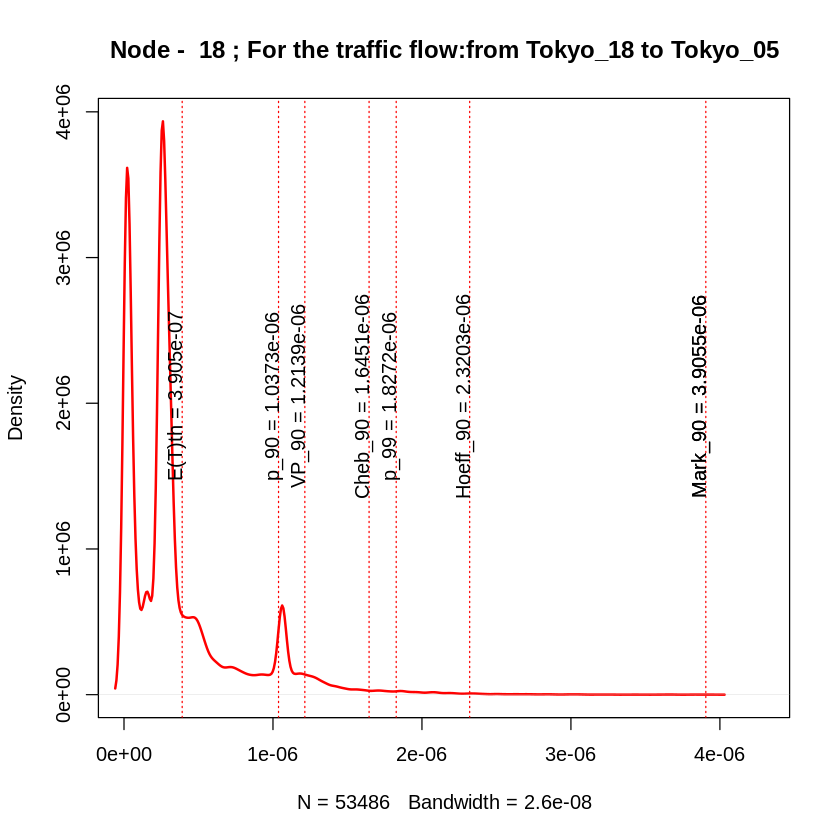

[1] 19
[1] "node_19"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
[1] "node_16"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_19->Tokyo_16
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "traffic_Tokyo_19_Tokyo_04_"
[1] 19
[1] "Node -  19 :"
[1] "variance= 4.05306935130472e-12"
[1] "sigma2= 2.01322362178292e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.80923196697311e-06"


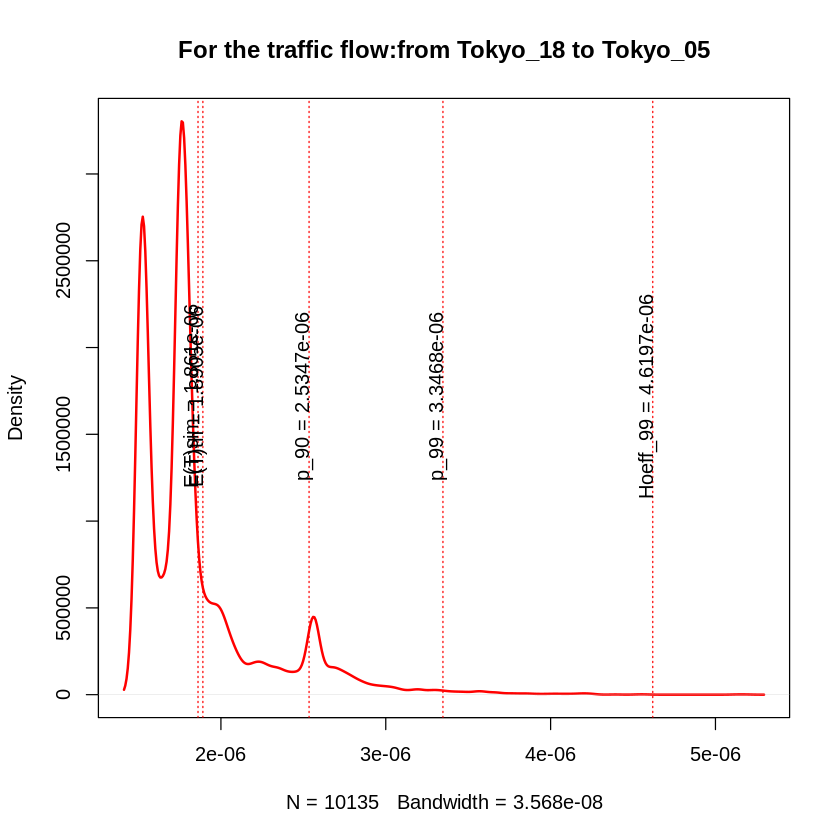

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_19->Tokyo_16
[1] 16
[1] "Node -  16 :"
[1] "variance= 2.13399110052297e-14"
[1] "sigma2= 1.46081864053105e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.3253371718845e-07"


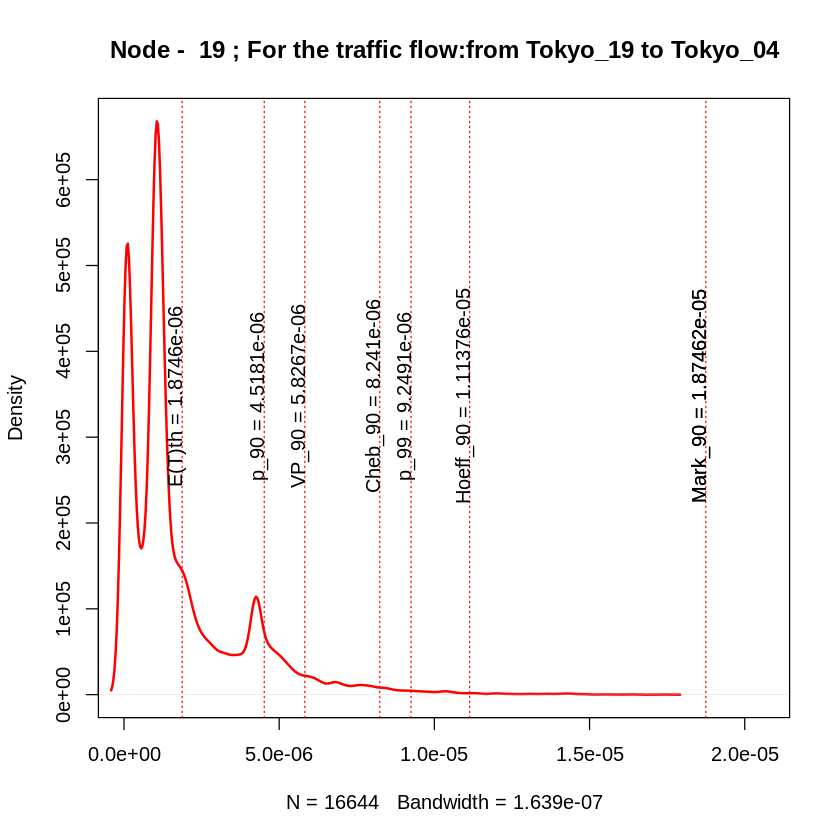

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_04
[1] "variance= 4.13940868208593e-12"
[1] "sigma2= 2.03455368129866e-06"
[1] "igraph E(T) = 4.51663743508379e-06"
[1] "simmer E(T) = 4.441679961505e-06"


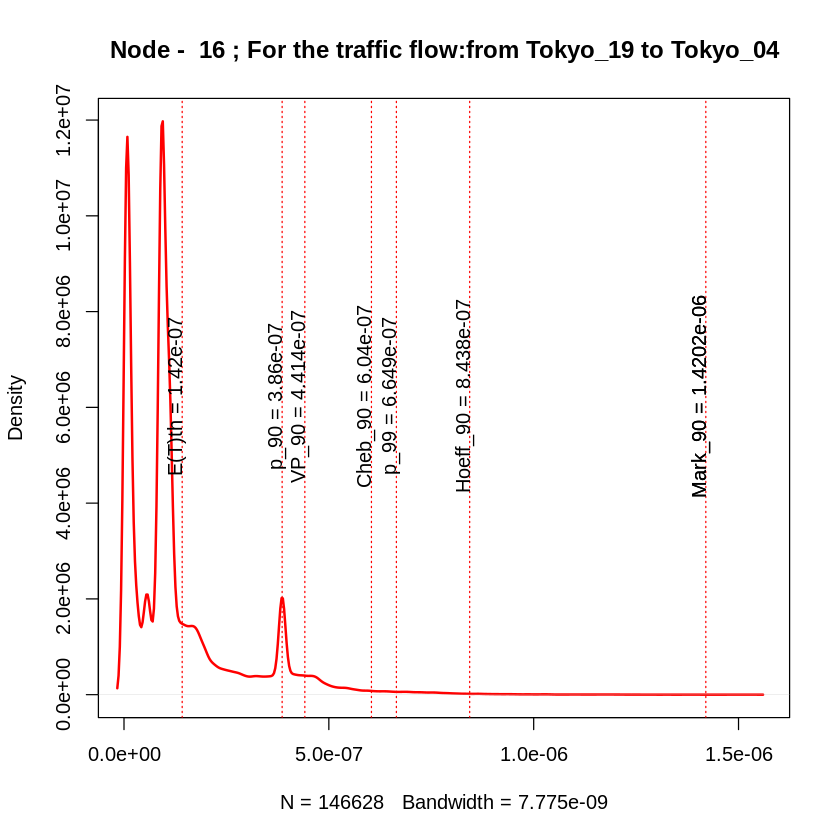

[1] 20
[1] "node_14"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_20->Tokyo_14
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "traffic_Tokyo_20_Tokyo_04_"
[1] 20
[1] "Node -  20 :"
[1] "variance= 1.90444155160388e-12"
[1] "sigma2= 1.38001505484682e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.2364068411858e-06"


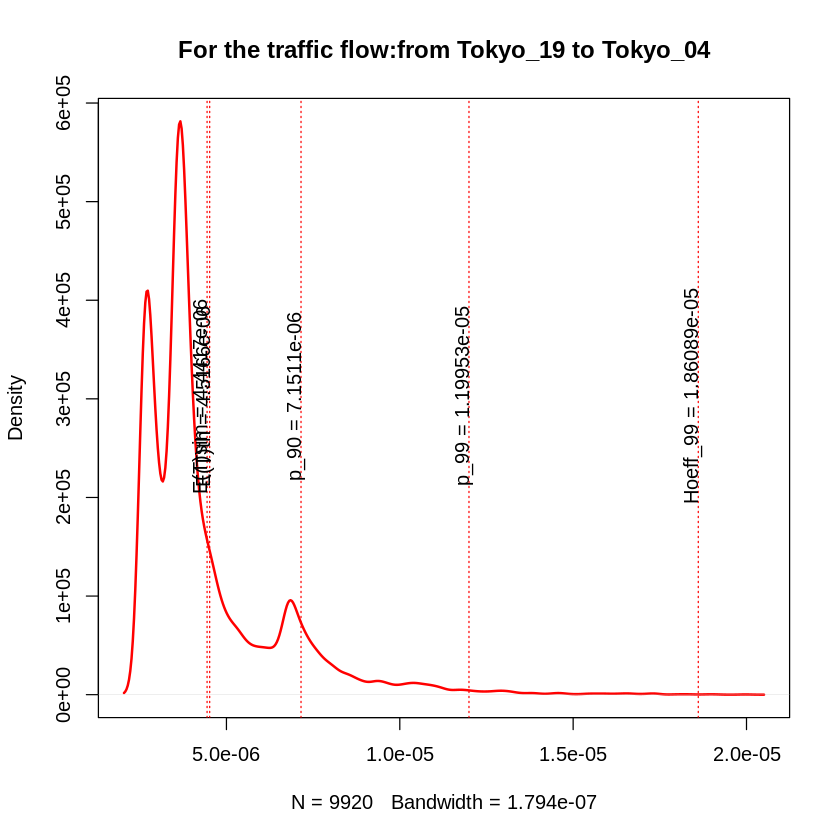

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_20->Tokyo_14
[1] 14
[1] "Node -  14 :"
[1] "variance= 2.05772266748171e-14"
[1] "sigma2= 1.4344764436831e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.30744222657493e-07"


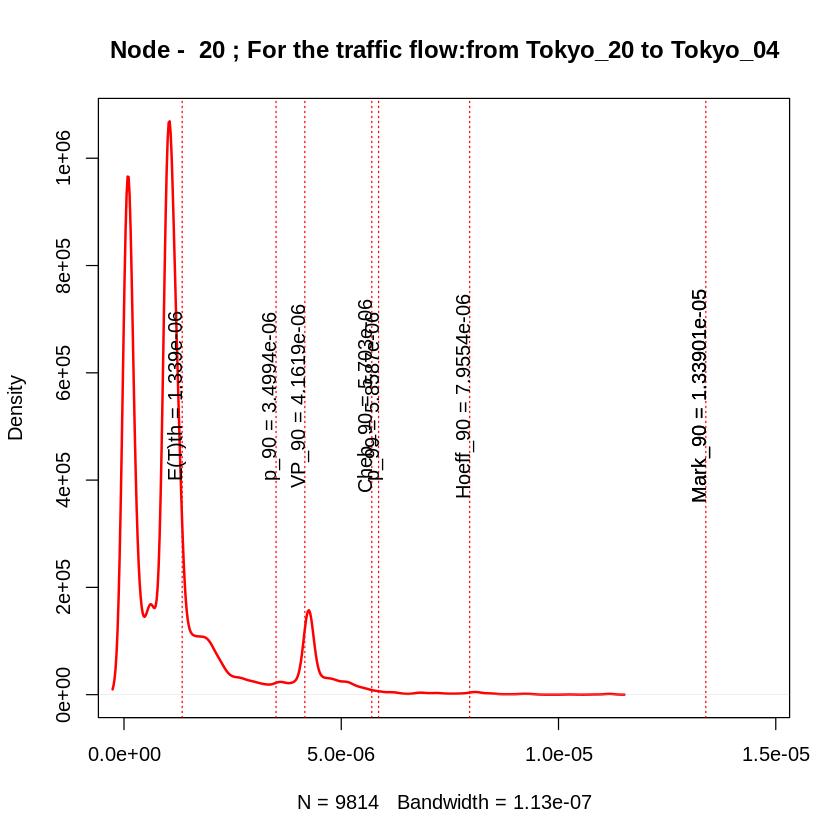

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_04
[1] "variance= 1.92421410209918e-12"
[1] "sigma2= 1.38716044569443e-06"
[1] "igraph E(T) = 4.48103151671143e-06"
[1] "simmer E(T) = 4.36704739211619e-06"


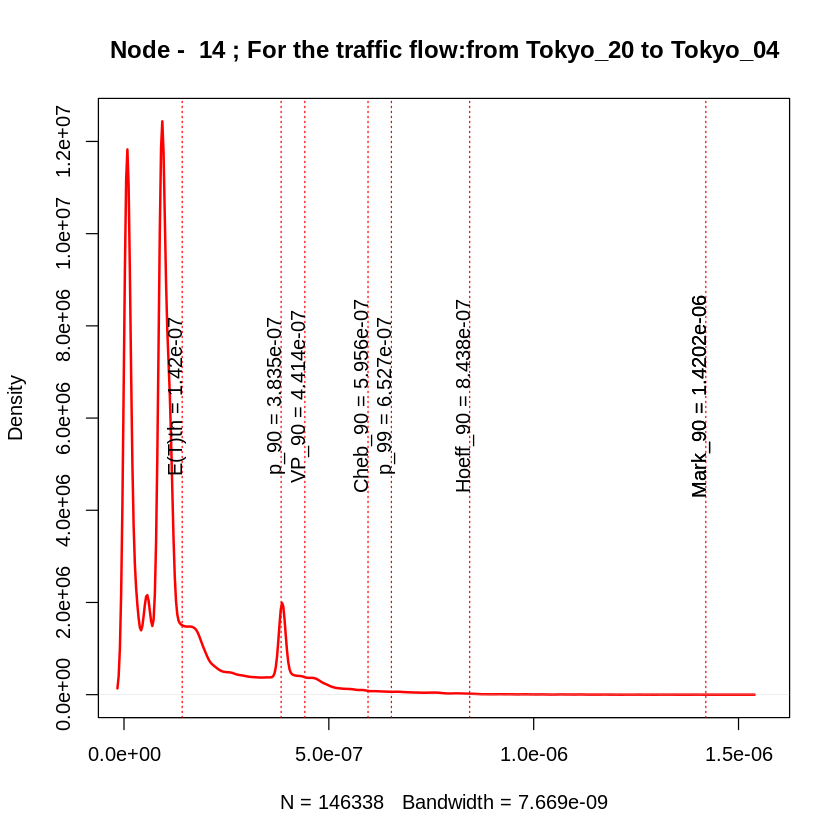

[1] 21
[1] "node_18"
[1] 4906603
[1] 0.4
[1] 1594646
[1] 367995.2
[1] 1962641
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_21->Tokyo_18
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_18->Tokyo_05
[1] "traffic_Tokyo_21_Tokyo_05_"
[1] 21
[1] "Node -  21 :"
[1] "variance= 1.86510057407789e-12"
[1] "sigma2= 1.36568685066449e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.23589062899975e-06"


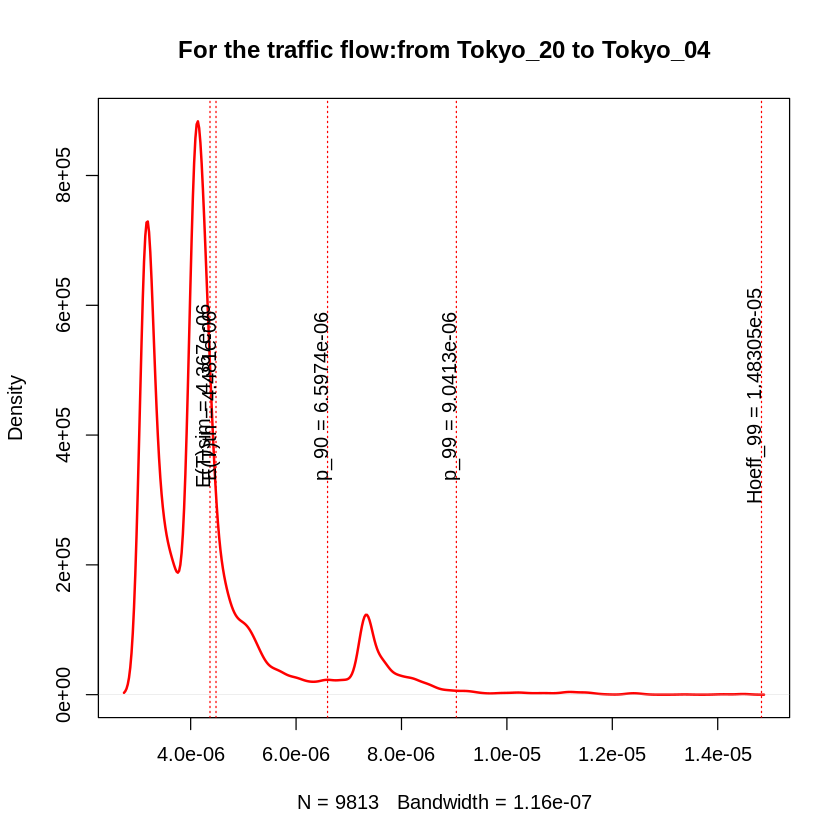

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_21->Tokyo_18
[1] 18
[1] "Node -  18 :"
[1] "variance= 1.61254881327568e-13"
[1] "sigma2= 4.01565538022833e-07"
[1] "igraph E(T) = 3.90545982146508e-07"
[1] "simmer E(T) = 3.62235445070411e-07"


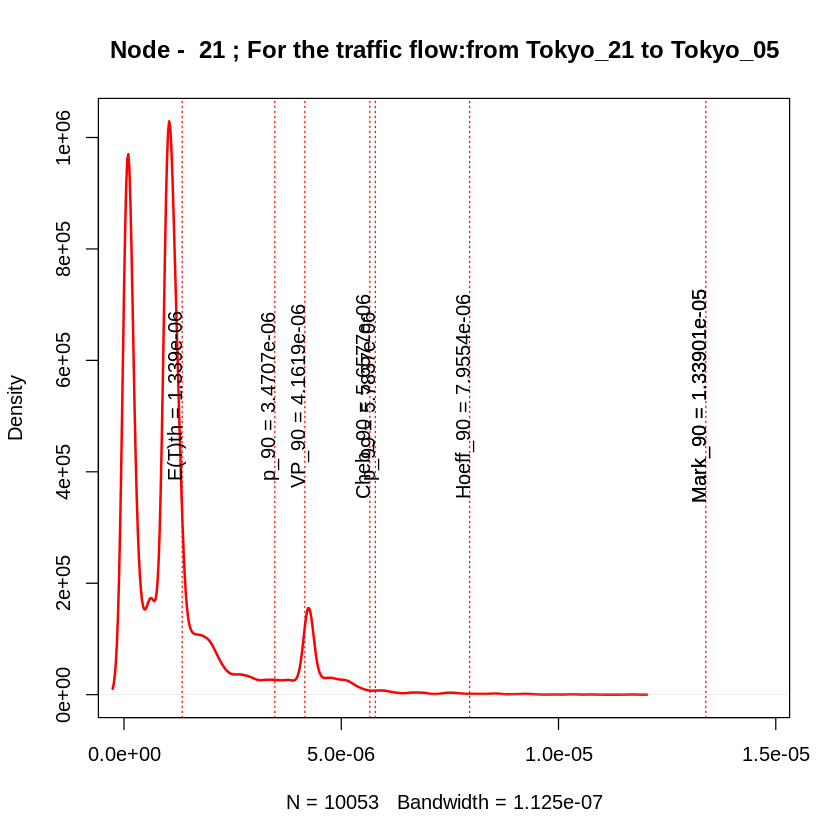

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_18->Tokyo_05
[1] "variance= 2.02521052734419e-12"
[1] "sigma2= 1.42309891692187e-06"
[1] "igraph E(T) = 4.72956077807739e-06"
[1] "simmer E(T) = 4.60603424651153e-06"


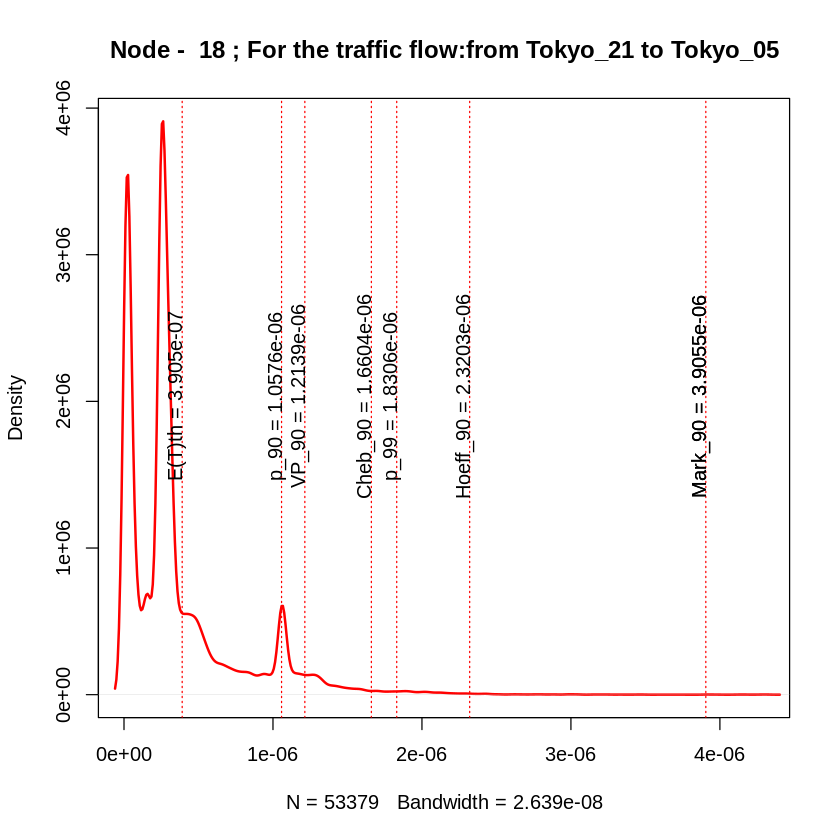

[1] 22
[1] "node_22"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
[1] "node_6"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_22->Tokyo_07
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_07->Tokyo_06
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "traffic_Tokyo_22_Tokyo_01_"
[1] 22
[1] "Node -  22 :"
[1] "variance= 3.78530520902069e-12"
[1] "sigma2= 1.94558608368293e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.78661189315661e-06"


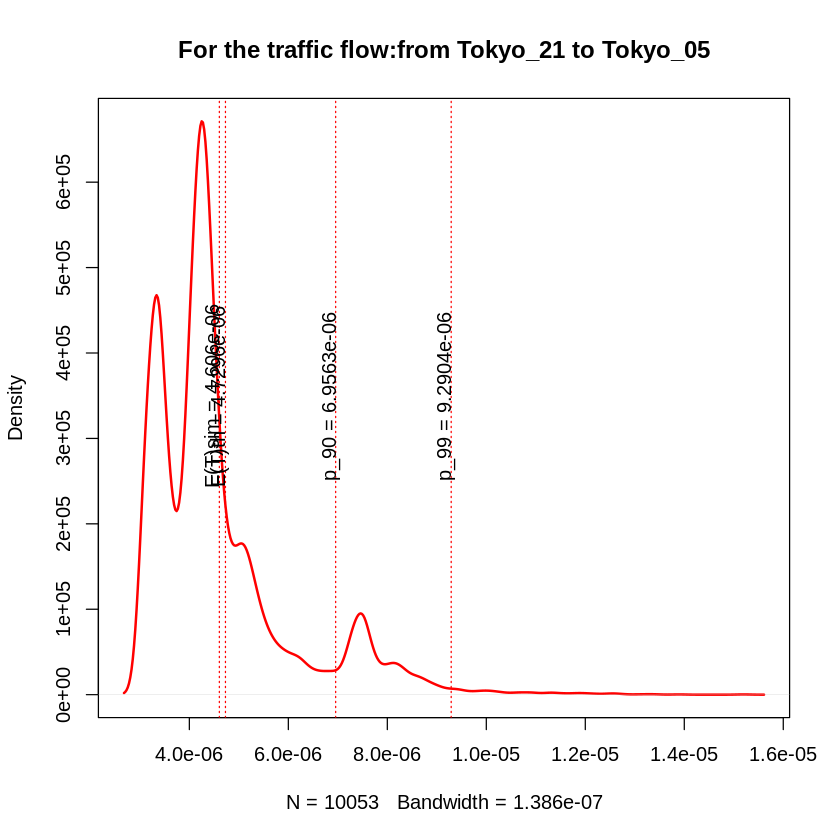

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_22->Tokyo_07
[1] 7
[1] "Node -  7 :"
[1] "variance= 1.7418010066722e-12"
[1] "sigma2= 1.31977308908471e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.20533395498671e-06"


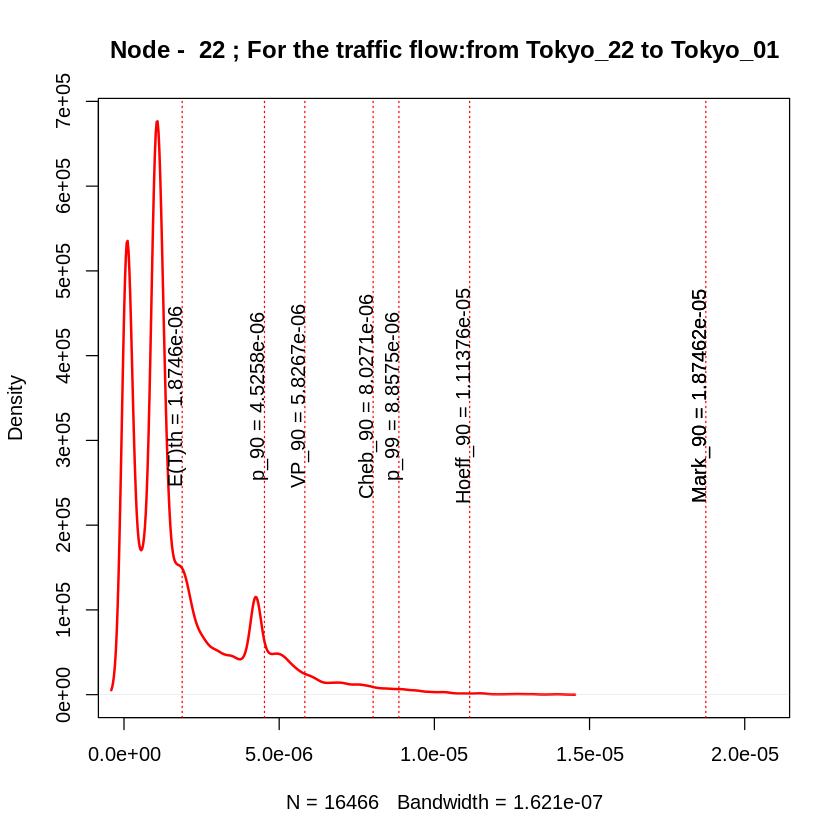

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_07->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 2.05847426183042e-14"
[1] "sigma2= 1.43473839491052e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.30652922796032e-07"


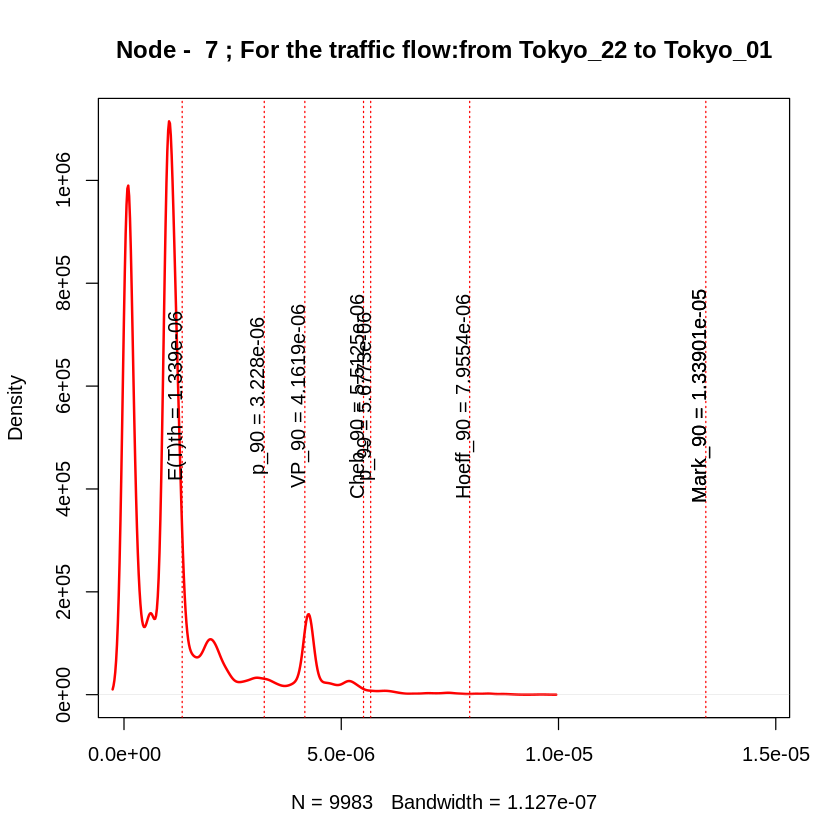

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "variance= 5.55401621607577e-12"
[1] "sigma2= 2.35669603811687e-06"
[1] "igraph E(T) = 9.35565223101467e-06"
[1] "simmer E(T) = 9.14640592518139e-06"


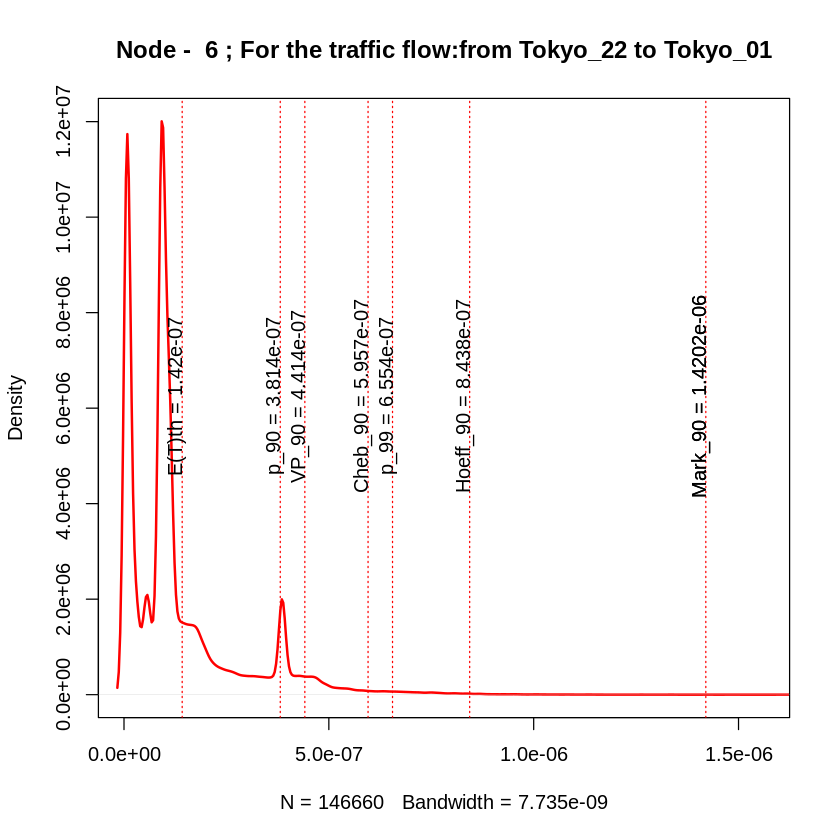

[1] 23
[1] "node_23"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
[1] "node_6"
[1] 13493158
[1] 0.4
[1] 5029268
[1] 367995.2
[1] 5397263
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_23->Tokyo_07
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_07->Tokyo_06
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "traffic_Tokyo_23_Tokyo_01_"
[1] 23
[1] "Node -  23 :"
[1] "variance= 3.82983161027758e-12"
[1] "sigma2= 1.95699555704084e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.77297972353397e-06"


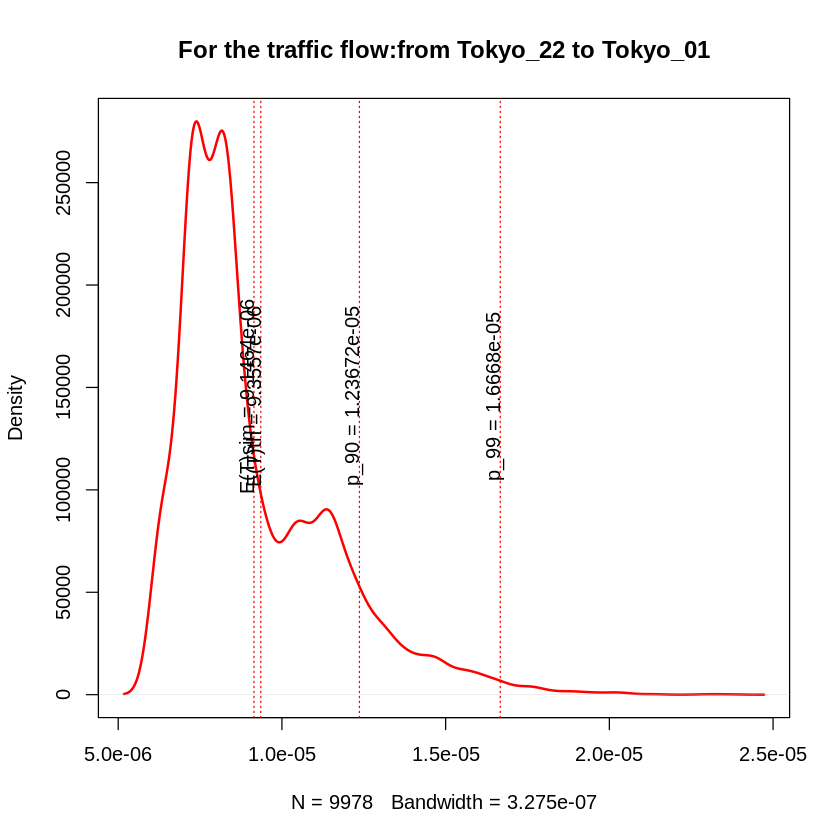

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_23->Tokyo_07
[1] 7
[1] "Node -  7 :"
[1] "variance= 1.96212929942482e-12"
[1] "sigma2= 1.40076025765469e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.23350516063644e-06"


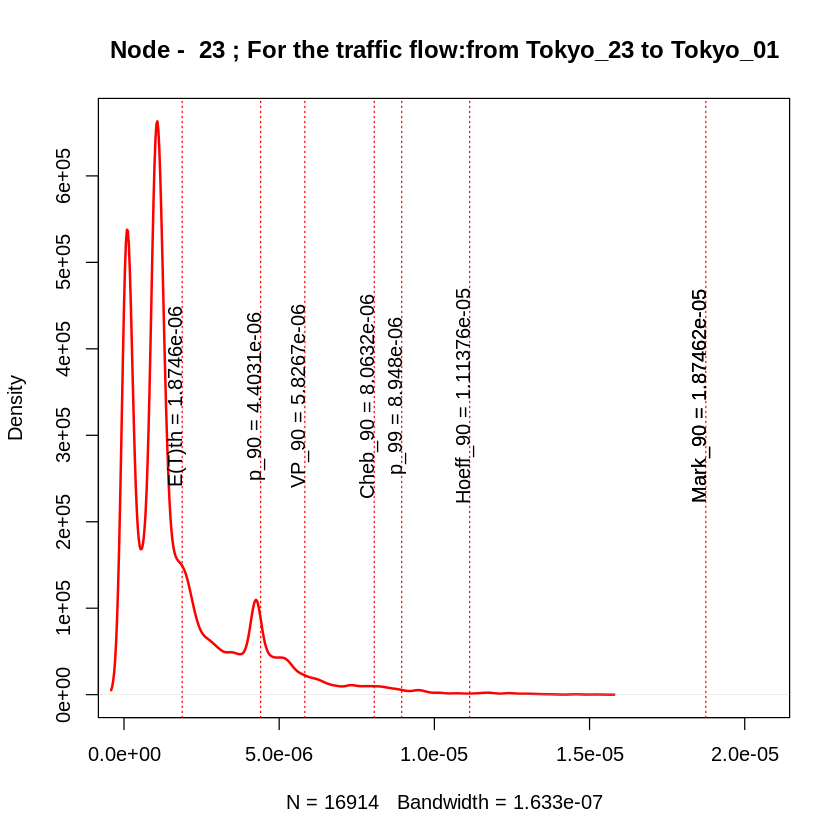

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_07->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 2.18465032746549e-14"
[1] "sigma2= 1.47805626667779e-07"
[1] "igraph E(T) = 1.42016720780548e-07"
[1] "simmer E(T) = 1.33374377308634e-07"


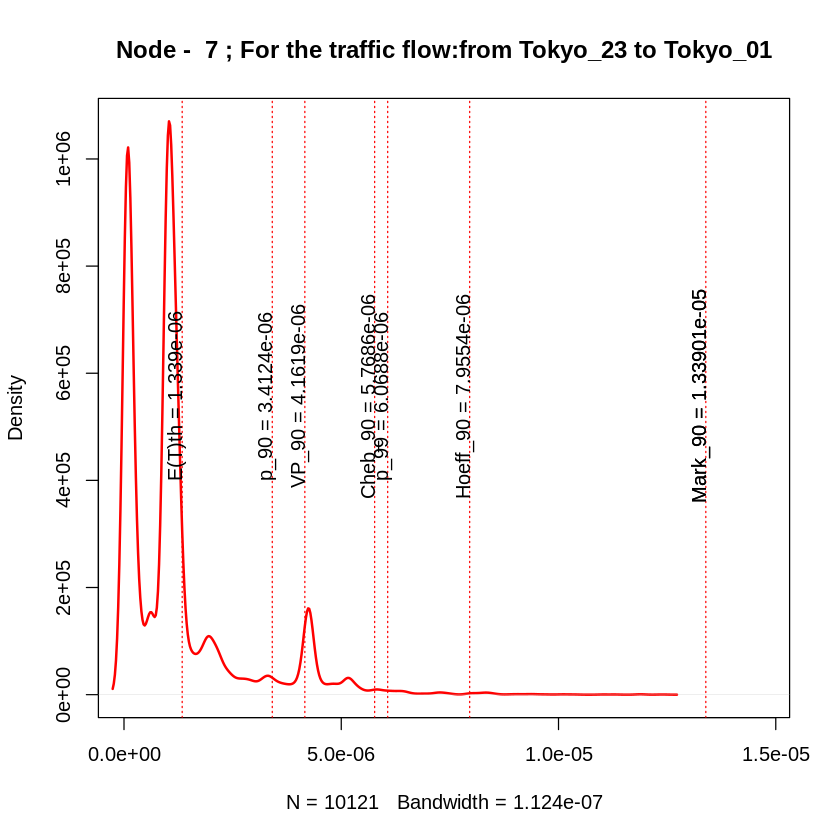

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_01
[1] "variance= 6.02332851416604e-12"
[1] "sigma2= 2.45424703609193e-06"
[1] "igraph E(T) = 9.85565223101467e-06"
[1] "simmer E(T) = 9.66212191284008e-06"


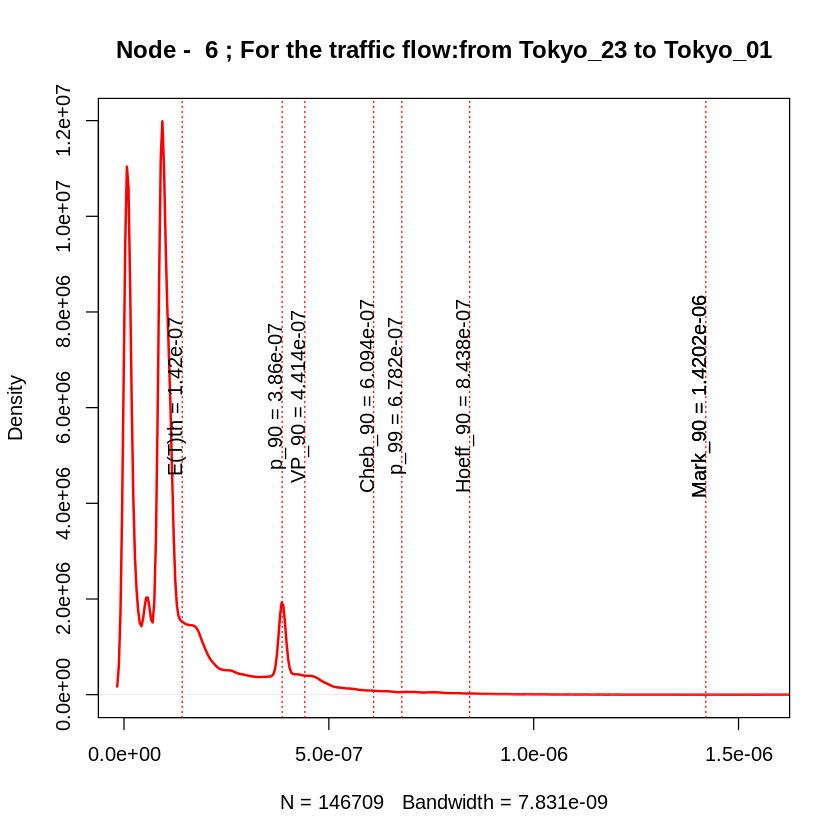

[1] 24
[1] "no info of traffic"
 [1] 0.000000e+00 2.631339e-06 2.631339e-06 0.000000e+00 0.000000e+00
 [6] 2.131339e-06 5.362629e-06 6.354782e-06 6.354782e-06 5.920128e-06
[11] 1.010755e-05 5.920128e-06 2.131339e-06 1.631339e-06 4.367047e-06
[16] 1.631339e-06 4.441680e-06 1.861022e-06 4.441680e-06 4.367047e-06
[21] 4.606034e-06 9.146406e-06 9.662122e-06 0.000000e+00
[1] 25
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_02
[1] "traffic_Tokyo_01_Tokyo_02_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.79247899102957e-12"
[1] "sigma2= 1.33883493793282e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.19721689732598e-06"


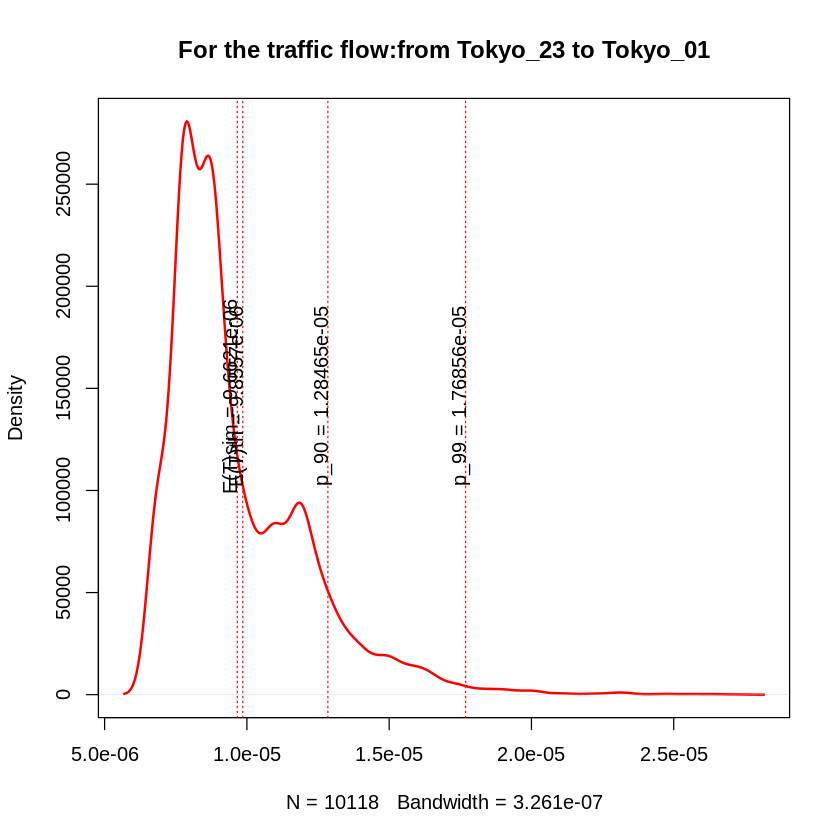

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_02
[1] "variance= 1.79271009056173e-12"
[1] "sigma2= 1.33892124135878e-06"
[1] "igraph E(T) = 3.83901479593088e-06"
[1] "simmer E(T) = 3.69734809976154e-06"


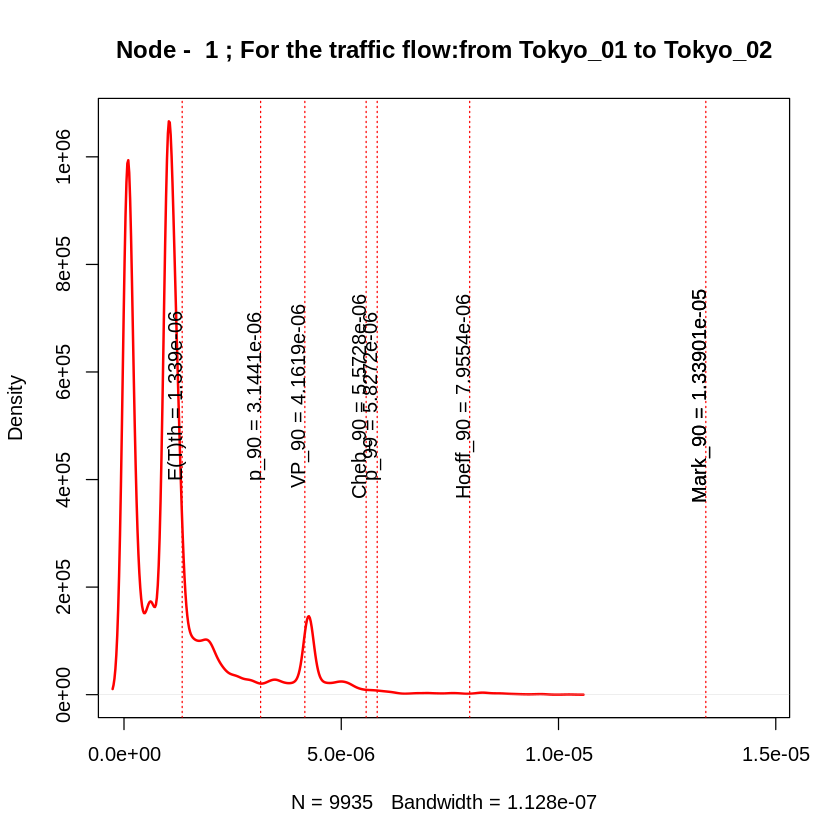

[1] 26
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_03
[1] "traffic_Tokyo_01_Tokyo_03_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.79247899102957e-12"
[1] "sigma2= 1.33883493793282e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.19721689732598e-06"


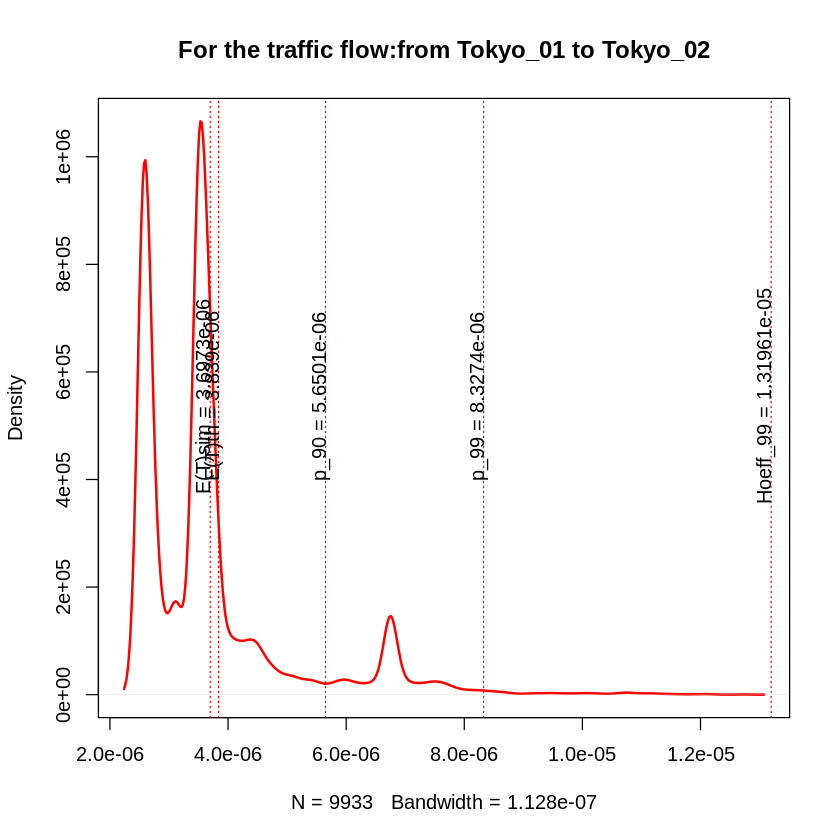

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_03
[1] "variance= 1.79271009056173e-12"
[1] "sigma2= 1.33892124135878e-06"
[1] "igraph E(T) = 3.83901479593088e-06"
[1] "simmer E(T) = 3.69734809976154e-06"


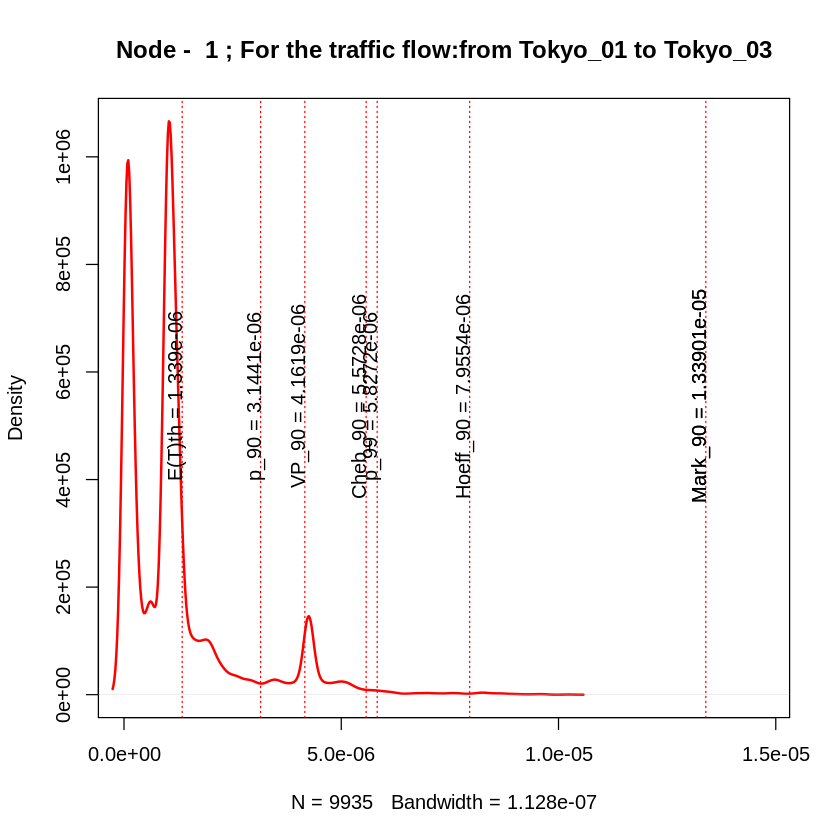

[1] 27
[1] "no info of traffic"
 [1] 0.000000e+00 2.631339e-06 2.631339e-06 0.000000e+00 0.000000e+00
 [6] 2.131339e-06 5.362629e-06 6.354782e-06 6.354782e-06 5.920128e-06
[11] 1.010755e-05 5.920128e-06 2.131339e-06 1.631339e-06 4.367047e-06
[16] 1.631339e-06 4.441680e-06 1.861022e-06 4.441680e-06 4.367047e-06
[21] 4.606034e-06 9.146406e-06 9.662122e-06 0.000000e+00 3.697348e-06
[26] 3.697348e-06 0.000000e+00
[1] 28
[1] "no info of traffic"
 [1] 0.000000e+00 2.631339e-06 2.631339e-06 0.000000e+00 0.000000e+00
 [6] 2.131339e-06 5.362629e-06 6.354782e-06 6.354782e-06 5.920128e-06
[11] 1.010755e-05 5.920128e-06 2.131339e-06 1.631339e-06 4.367047e-06
[16] 1.631339e-06 4.441680e-06 1.861022e-06 4.441680e-06 4.367047e-06
[21] 4.606034e-06 9.146406e-06 9.662122e-06 0.000000e+00 3.697348e-06
[26] 3.697348e-06 0.000000e+00 0.000000e+00
[1] 29
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_06
[1] "traffic_Tokyo_01_Tokyo_06_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.79247899102957e-

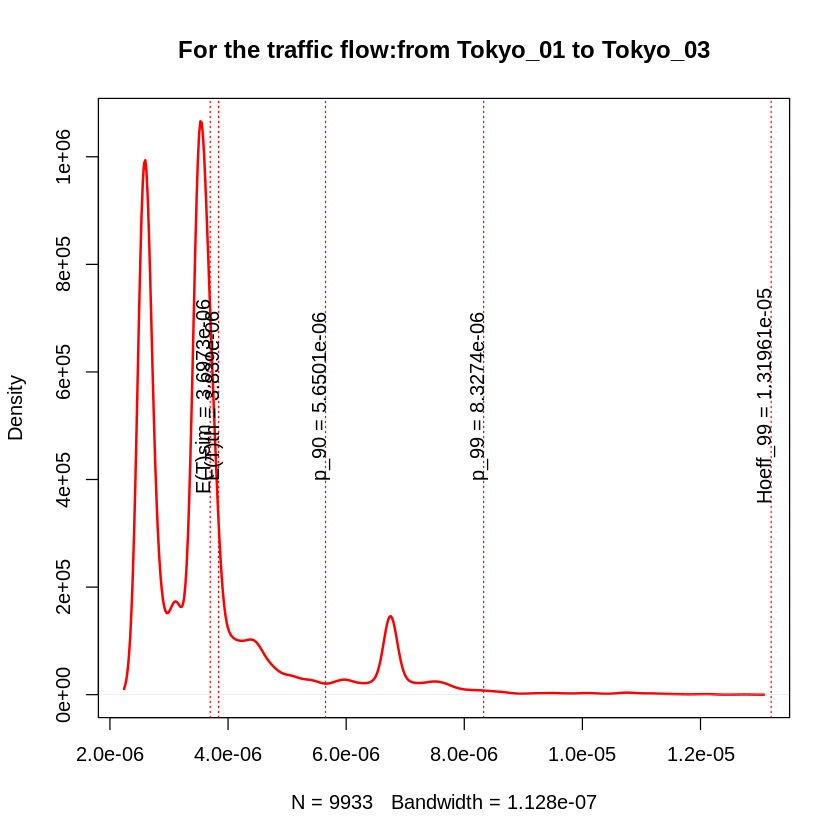

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_06
[1] "variance= 1.79271009056175e-12"
[1] "sigma2= 1.33892124135879e-06"
[1] "igraph E(T) = 3.33901479593088e-06"
[1] "simmer E(T) = 3.19734809976124e-06"


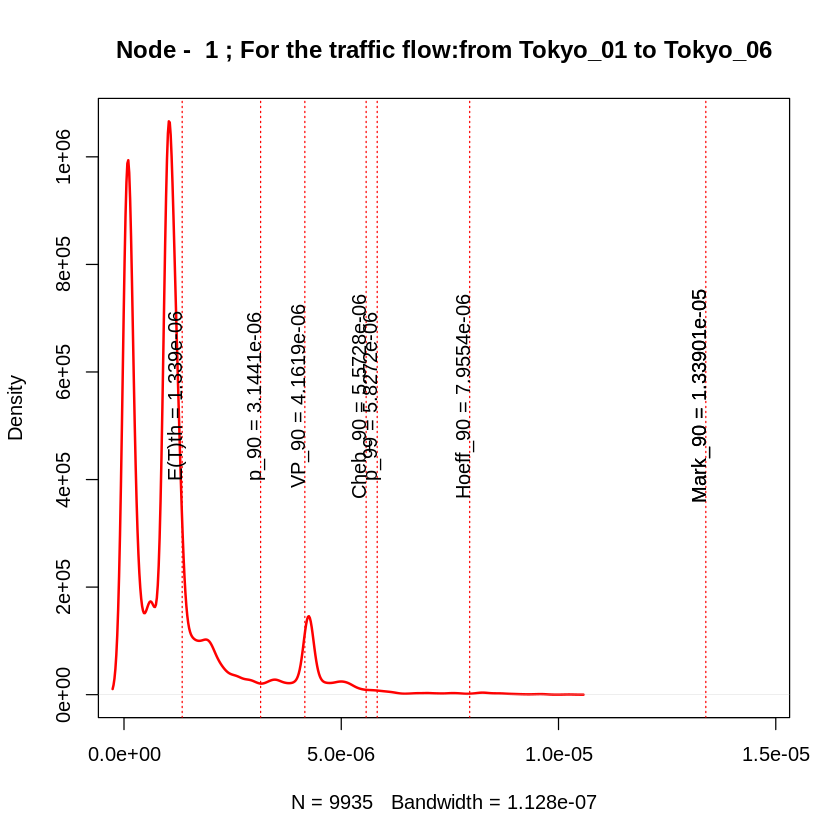

[1] 30
[1] "node_6"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_06
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_07
[1] "traffic_Tokyo_01_Tokyo_07_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.82819652955043e-12"
[1] "sigma2= 1.35210817967736e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.23128571221927e-06"


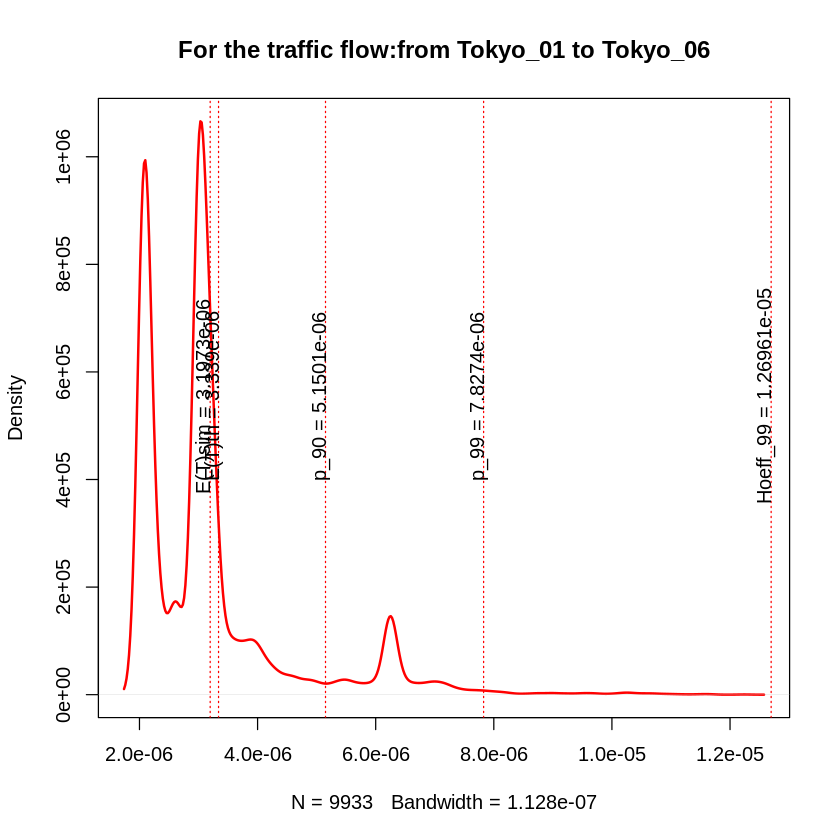

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 4.19536462730794e-12"
[1] "sigma2= 2.04825892584603e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.82659764537168e-06"


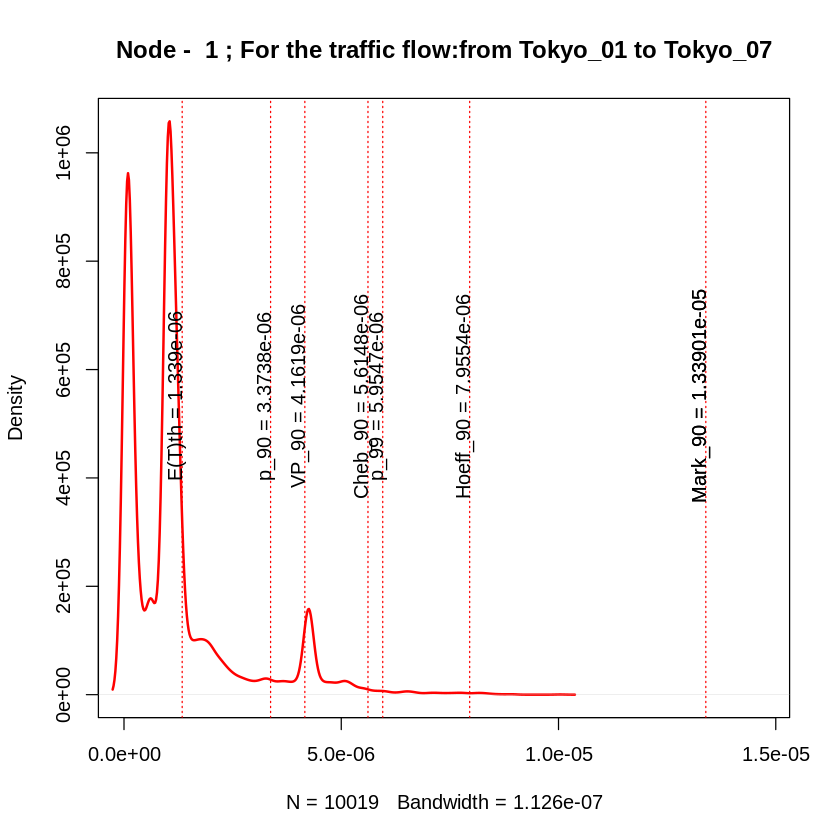

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_07
[1] "variance= 6.03948474792537e-12"
[1] "sigma2= 2.45753631670528e-06"
[1] "igraph E(T) = 7.21363551023412e-06"
[1] "simmer E(T) = 7.05413051581614e-06"


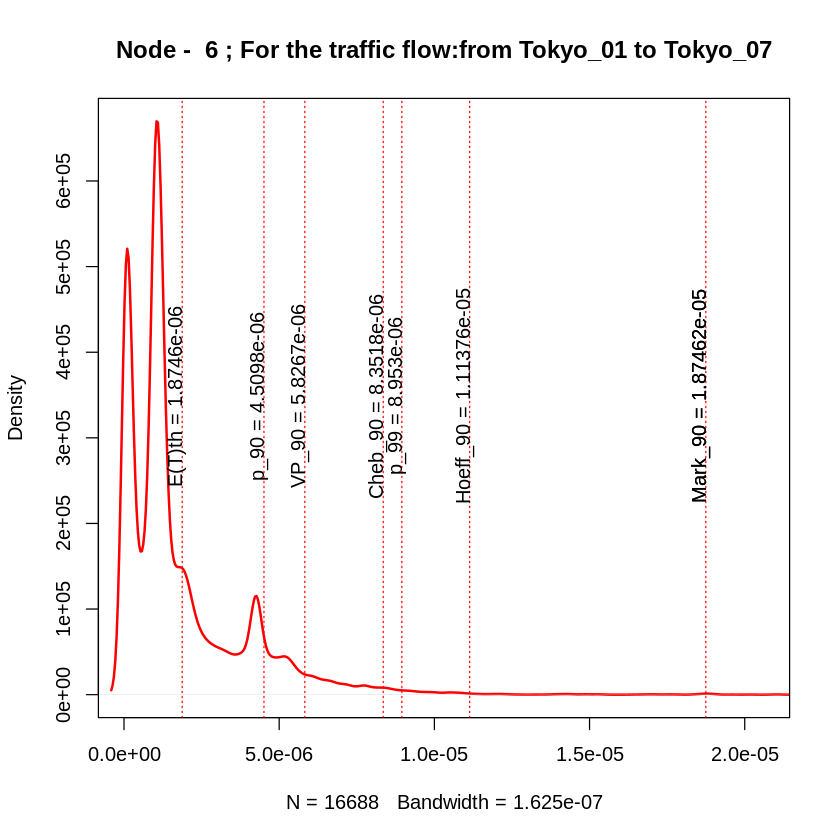

[1] 31
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_02
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_02->Tokyo_08
[1] "traffic_Tokyo_01_Tokyo_08_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.83732548977305e-12"
[1] "sigma2= 1.35547980057729e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.19814973667376e-06"


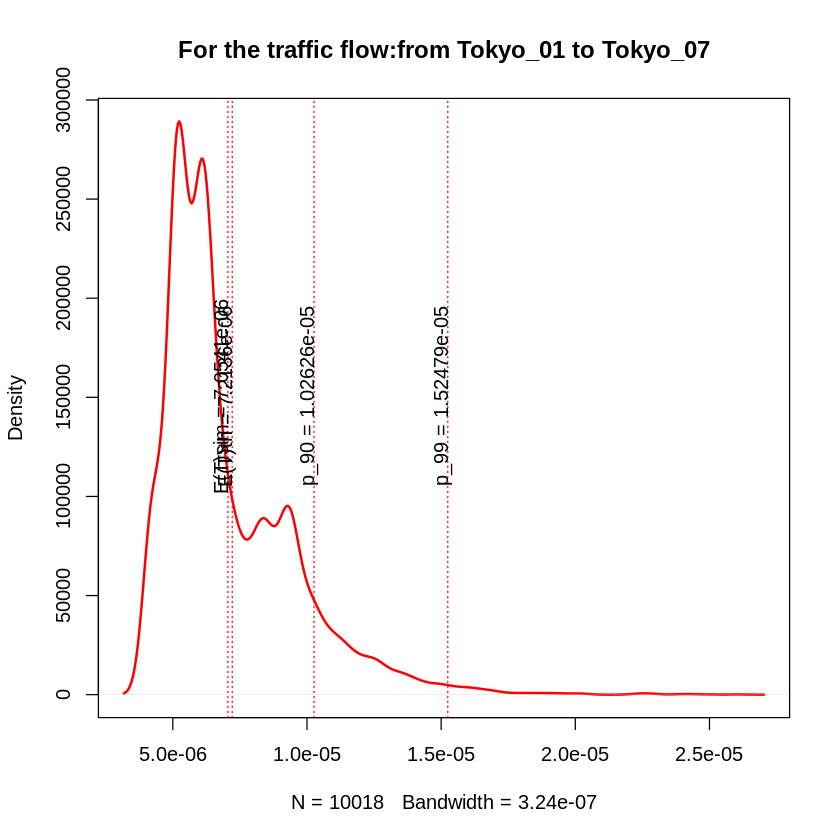

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_02
[1] 2
[1] "Node -  2 :"
[1] "variance= 1.85990071030643e-12"
[1] "sigma2= 1.363781767845e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.21838222945476e-06"


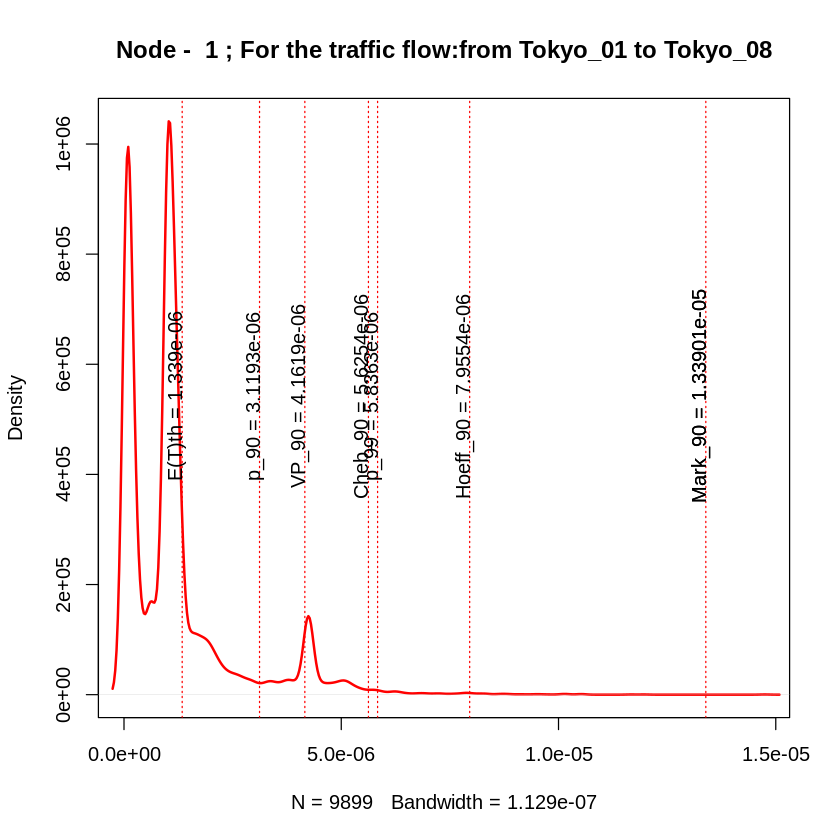

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_02->Tokyo_08
[1] "variance= 3.72916143807862e-12"
[1] "sigma2= 1.93110368392757e-06"
[1] "igraph E(T) = 7.67802959186177e-06"
[1] "simmer E(T) = 7.41655049004572e-06"


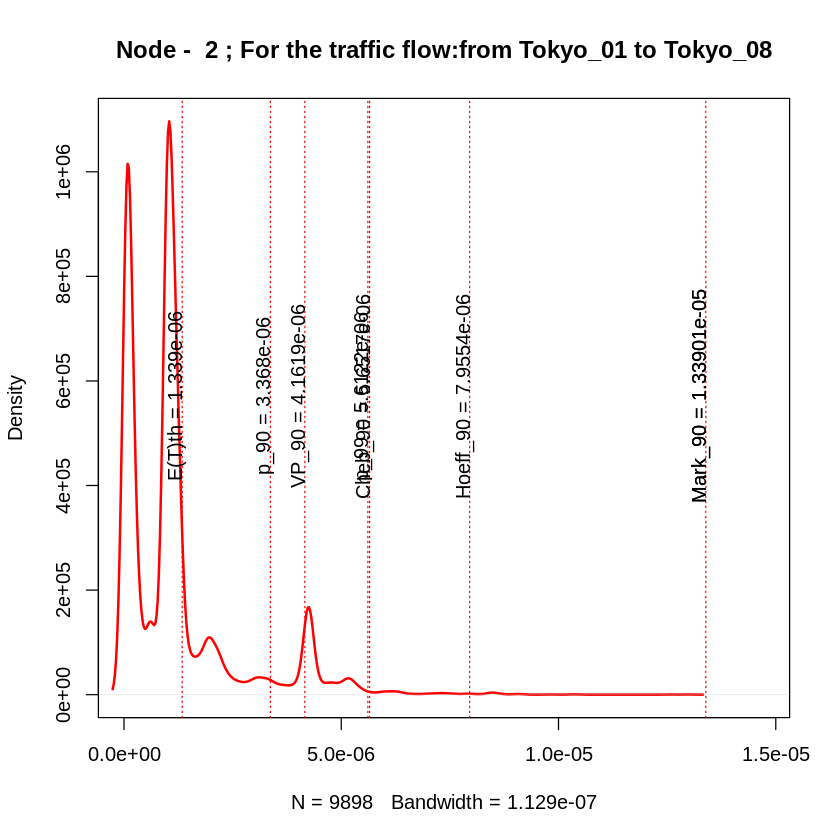

[1] 32
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_03
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_09
[1] "traffic_Tokyo_01_Tokyo_09_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.83732548977305e-12"
[1] "sigma2= 1.35547980057729e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.19814973667376e-06"


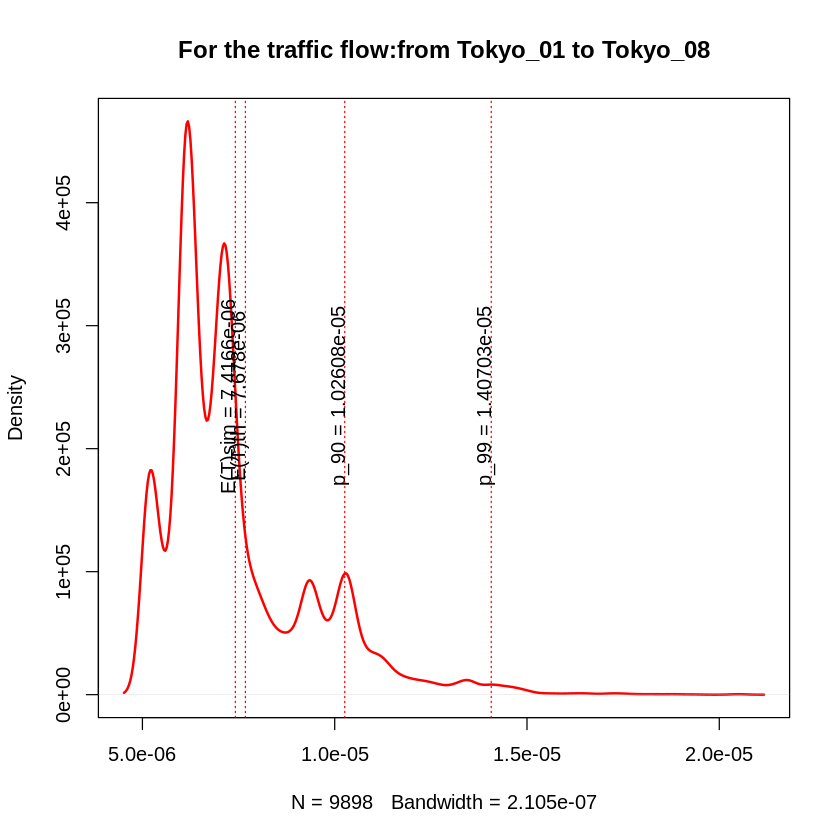

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_03
[1] 3
[1] "Node -  3 :"
[1] "variance= 1.85990071030643e-12"
[1] "sigma2= 1.363781767845e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.21838222945476e-06"


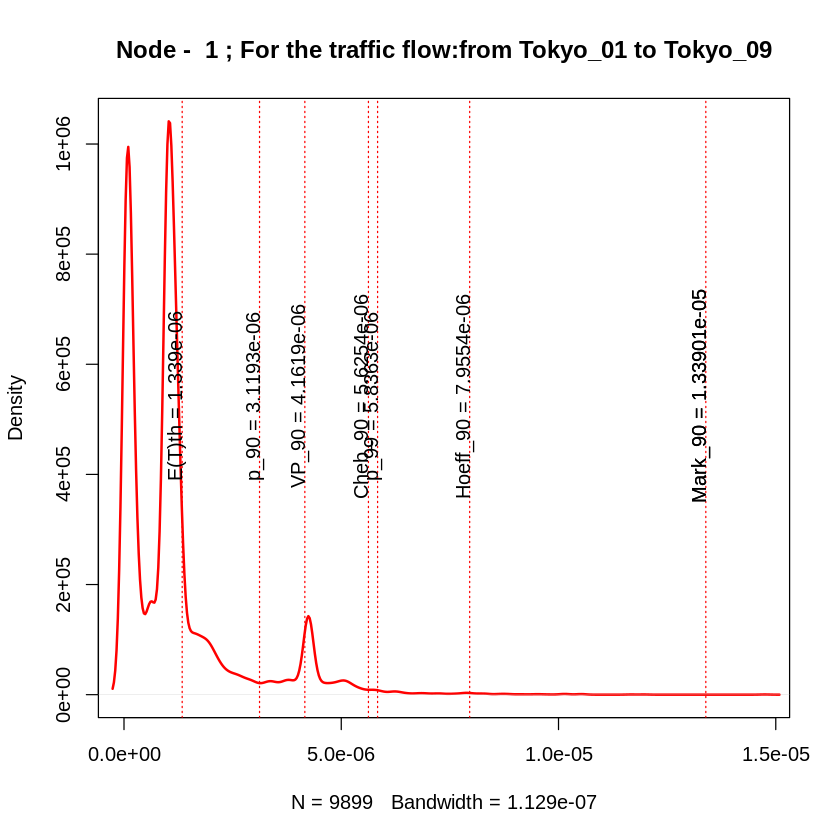

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_09
[1] "variance= 3.72916143807862e-12"
[1] "sigma2= 1.93110368392757e-06"
[1] "igraph E(T) = 7.67802959186177e-06"
[1] "simmer E(T) = 7.41655049004572e-06"


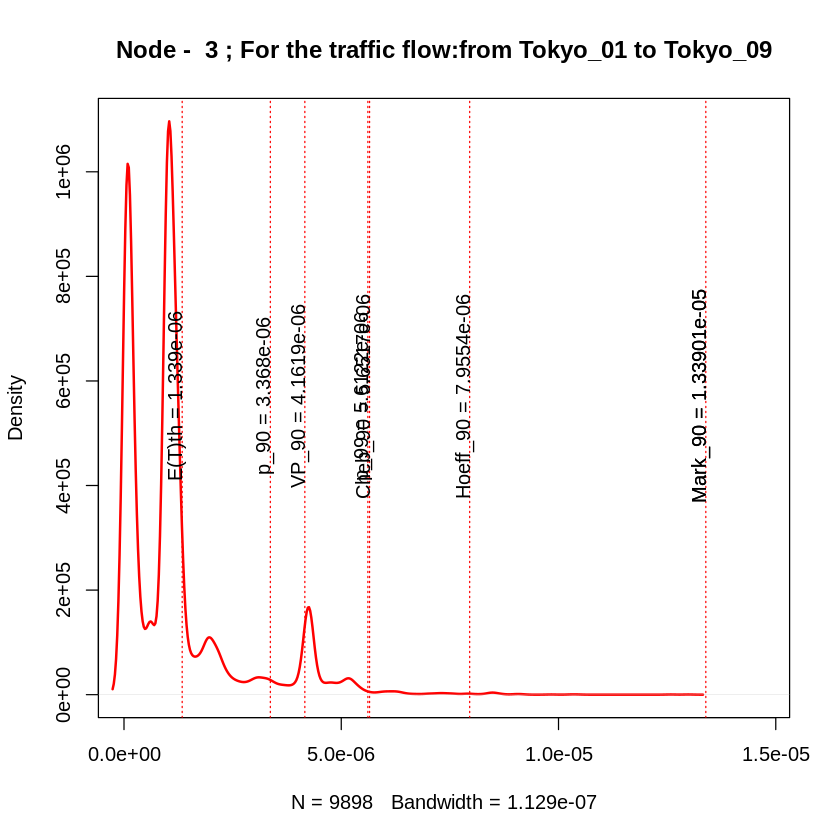

[1] 33
[1] "node_4"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_13
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_10
[1] "traffic_Tokyo_04_Tokyo_10_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 4.61214625618597e-12"
[1] "sigma2= 2.14759080278017e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.90259632916514e-06"


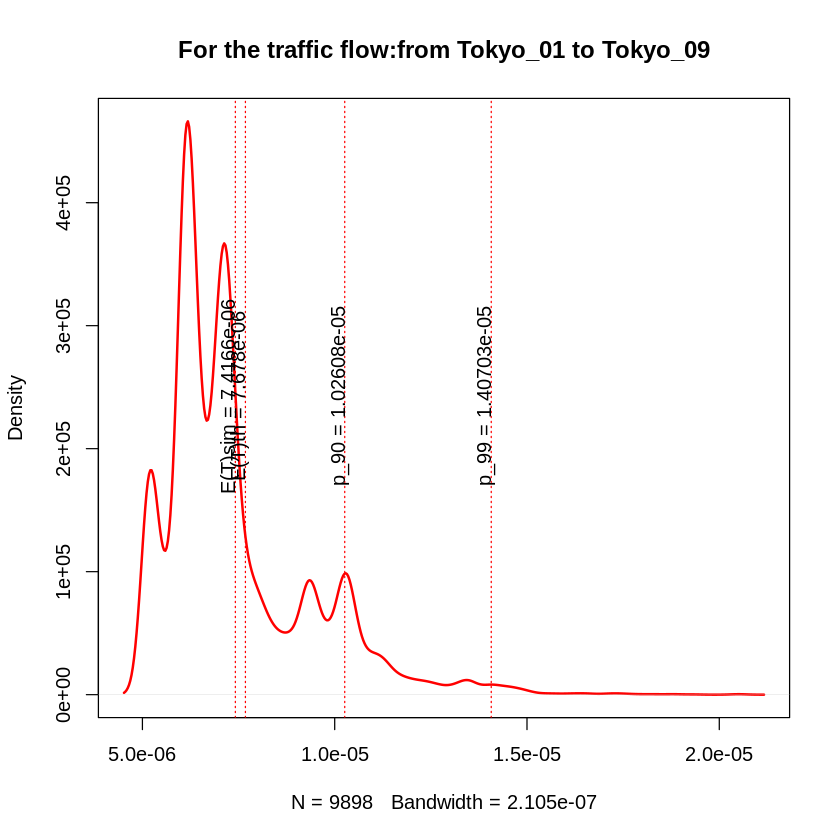

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_13
[1] 13
[1] "Node -  13 :"
[1] "variance= 1.97356189388988e-12"
[1] "sigma2= 1.40483518388809e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.24033243414734e-06"


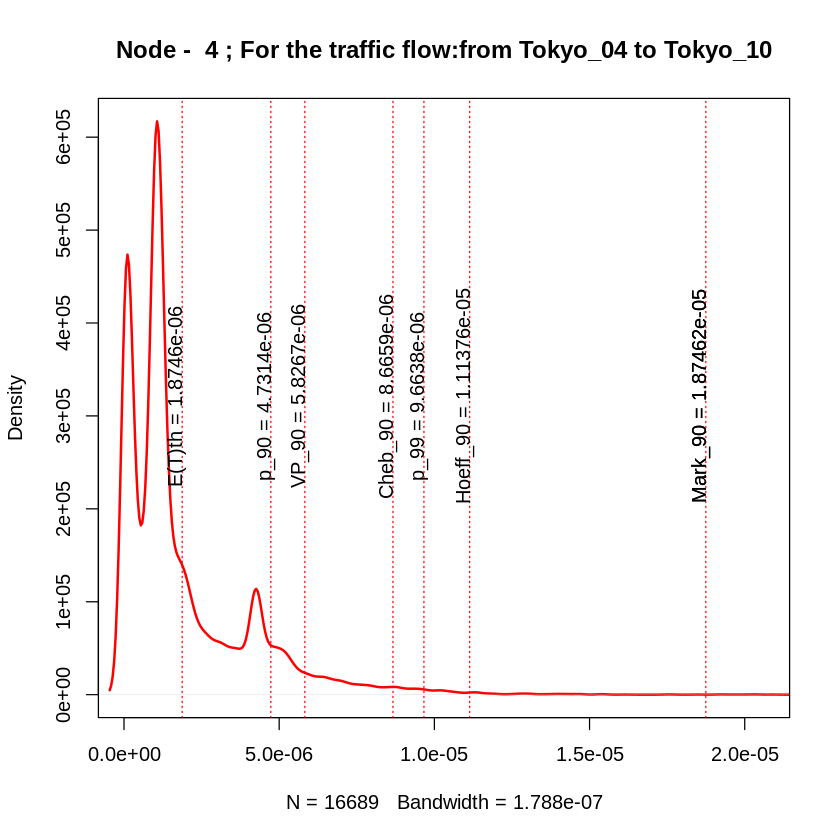

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_10
[1] "variance= 6.62974019163304e-12"
[1] "sigma2= 2.57482818681811e-06"
[1] "igraph E(T) = 7.21363551023412e-06"
[1] "simmer E(T) = 7.14862947586251e-06"


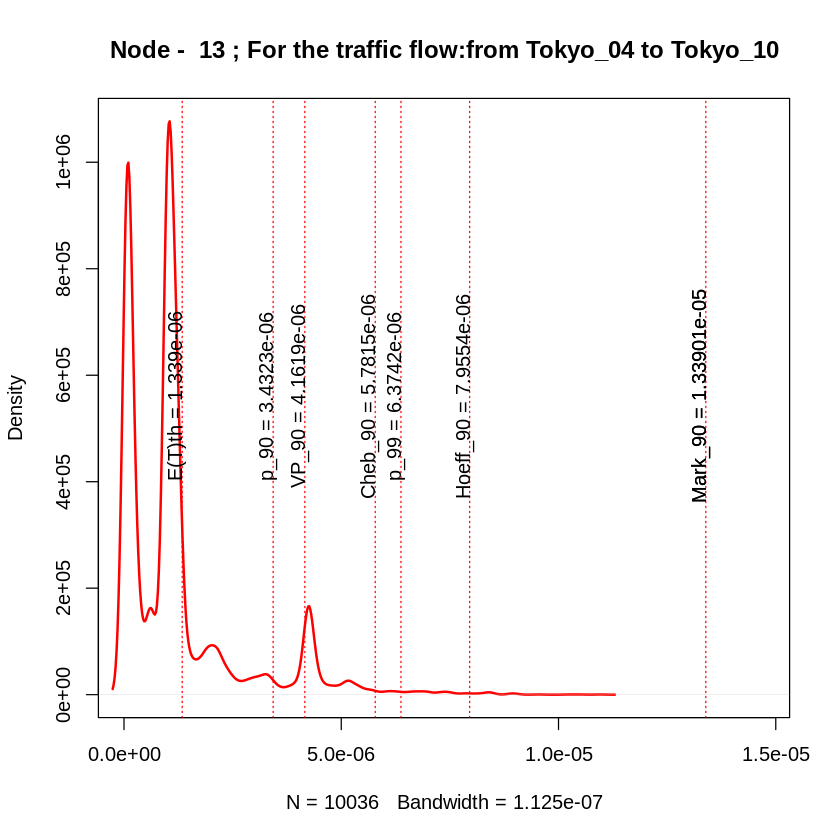

[1] 34
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_03
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_09
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_09->Tokyo_11
[1] "traffic_Tokyo_01_Tokyo_11_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.82067203352272e-12"
[1] "sigma2= 1.34932280552977e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.21382230943176e-06"


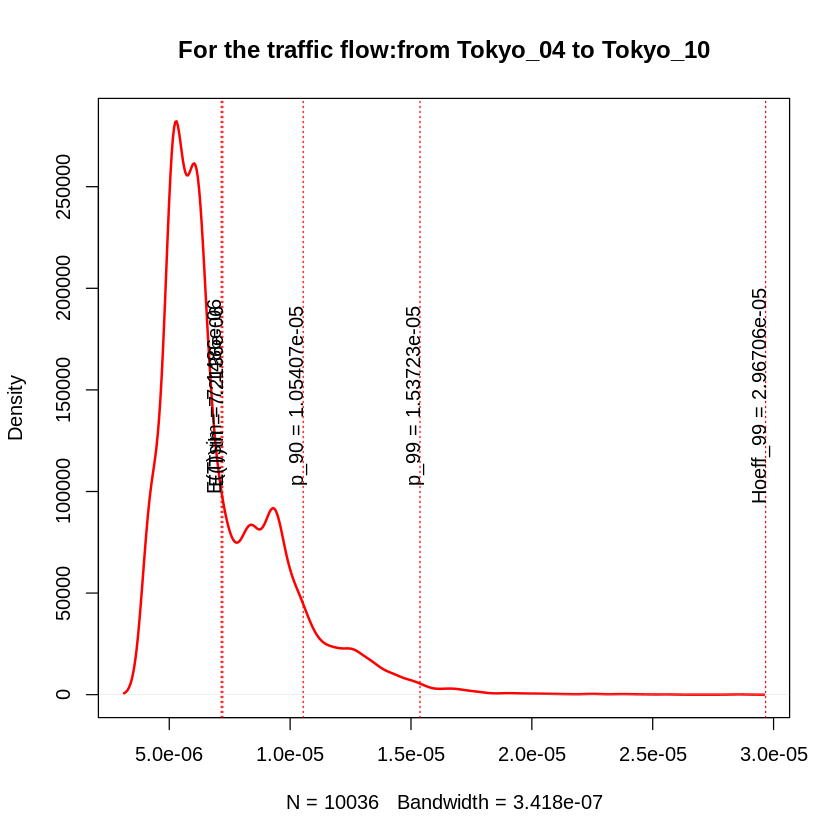

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_03
[1] 3
[1] "Node -  3 :"
[1] "variance= 1.70687697250668e-12"
[1] "sigma2= 1.30647501794205e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.18329527683208e-06"


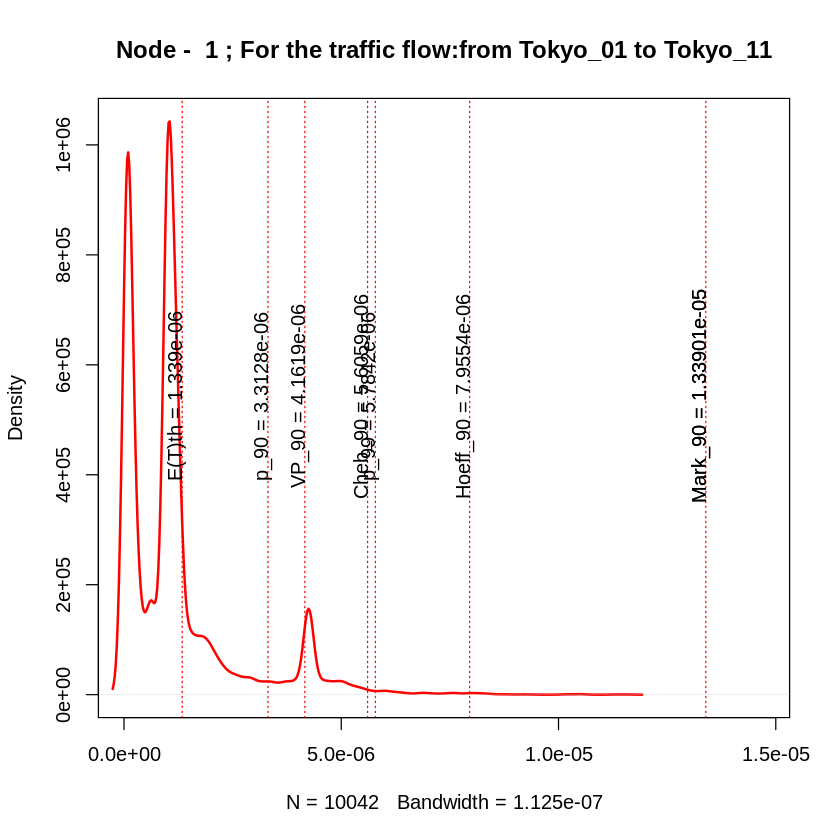

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_03->Tokyo_09
[1] 9
[1] "Node -  9 :"
[1] "variance= 2.06019059975309e-12"
[1] "sigma2= 1.43533640647518e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.27003769586474e-06"


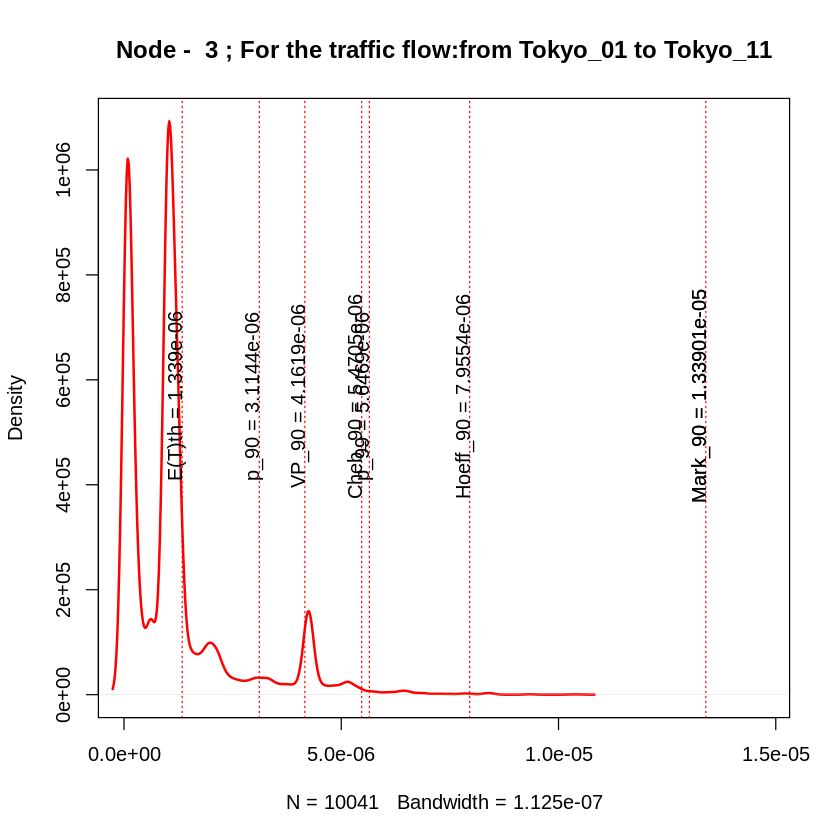

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_09->Tokyo_11
[1] "variance= 5.46207518340051e-12"
[1] "sigma2= 2.33710829518029e-06"
[1] "igraph E(T) = 1.15170443877927e-05"
[1] "simmer E(T) = 1.11677460322529e-05"


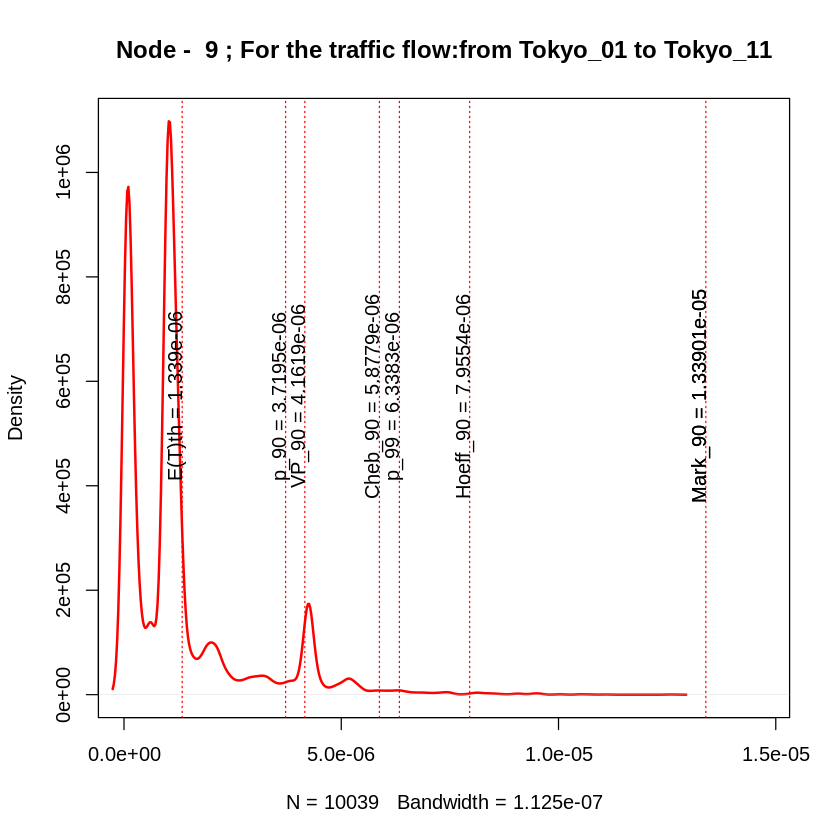

[1] 35
[1] "node_4"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_13
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_12
[1] "traffic_Tokyo_04_Tokyo_12_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 4.61214625618597e-12"
[1] "sigma2= 2.14759080278017e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.90259632916514e-06"


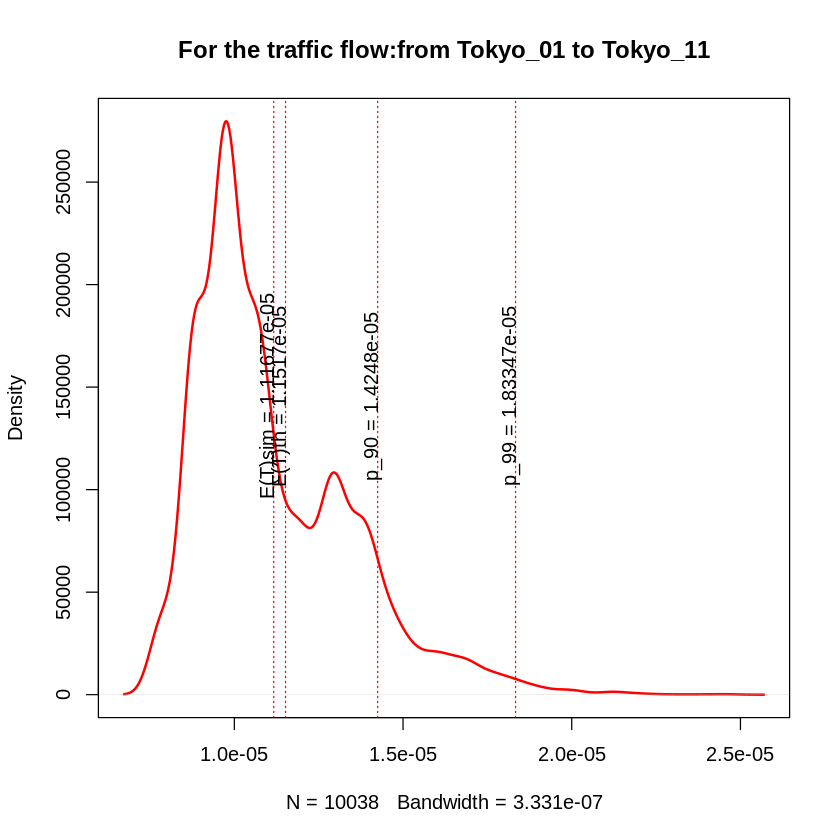

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_13
[1] 13
[1] "Node -  13 :"
[1] "variance= 1.97356189388988e-12"
[1] "sigma2= 1.40483518388809e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.24033243414734e-06"


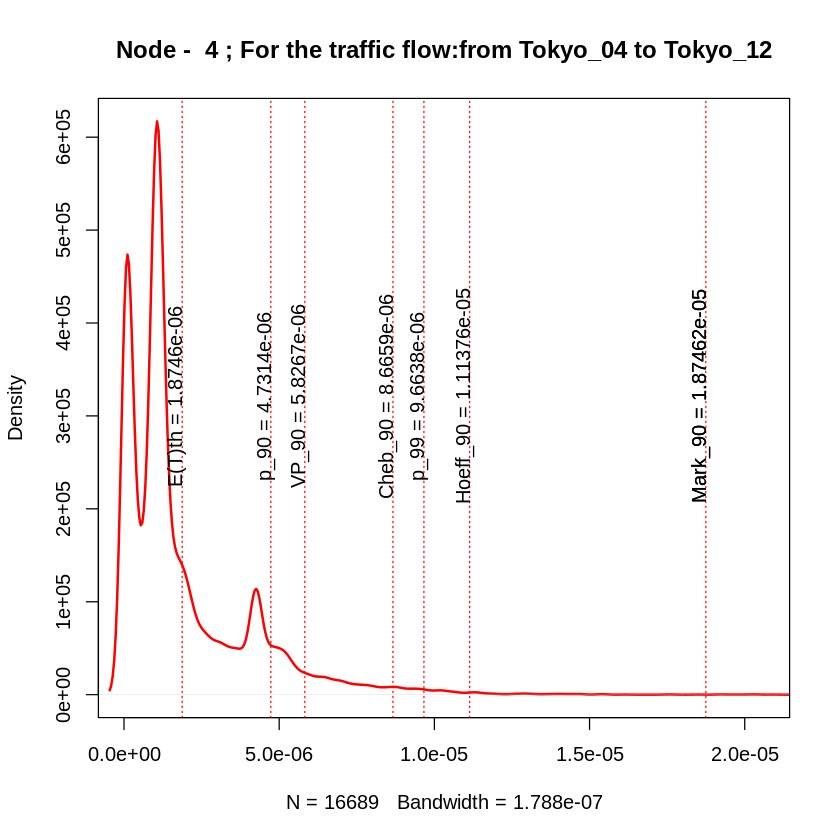

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_13->Tokyo_12
[1] "variance= 6.62974019163304e-12"
[1] "sigma2= 2.57482818681811e-06"
[1] "igraph E(T) = 7.21363551023412e-06"
[1] "simmer E(T) = 7.14862947586251e-06"


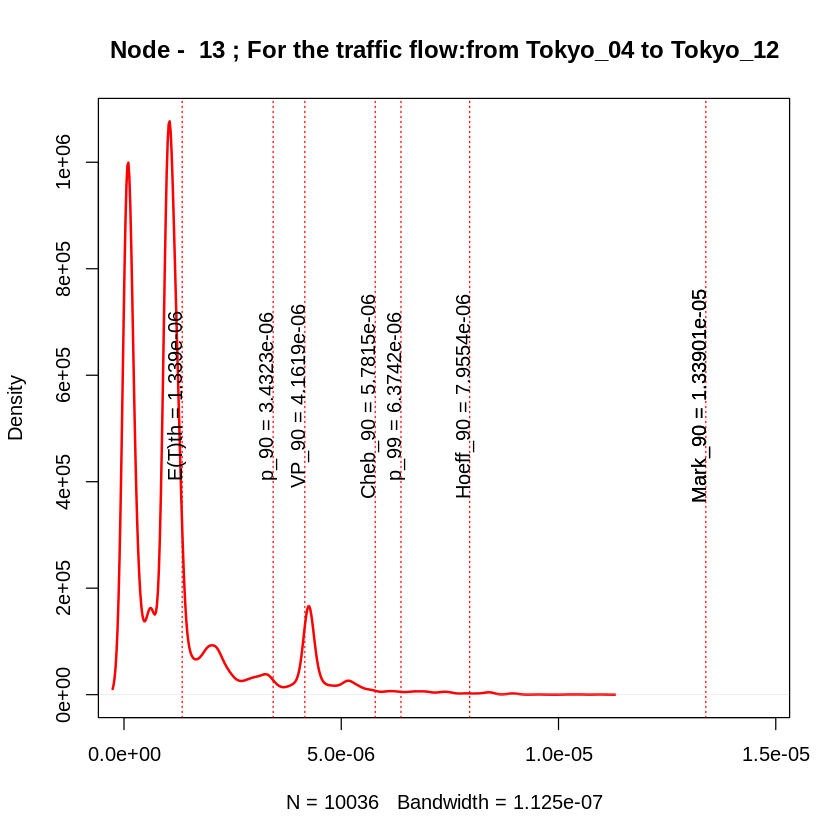

[1] 36
[1] "node_4"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_13
[1] "traffic_Tokyo_04_Tokyo_13_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 3.85944147059891e-12"
[1] "sigma2= 1.96454612330658e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.74600221794461e-06"


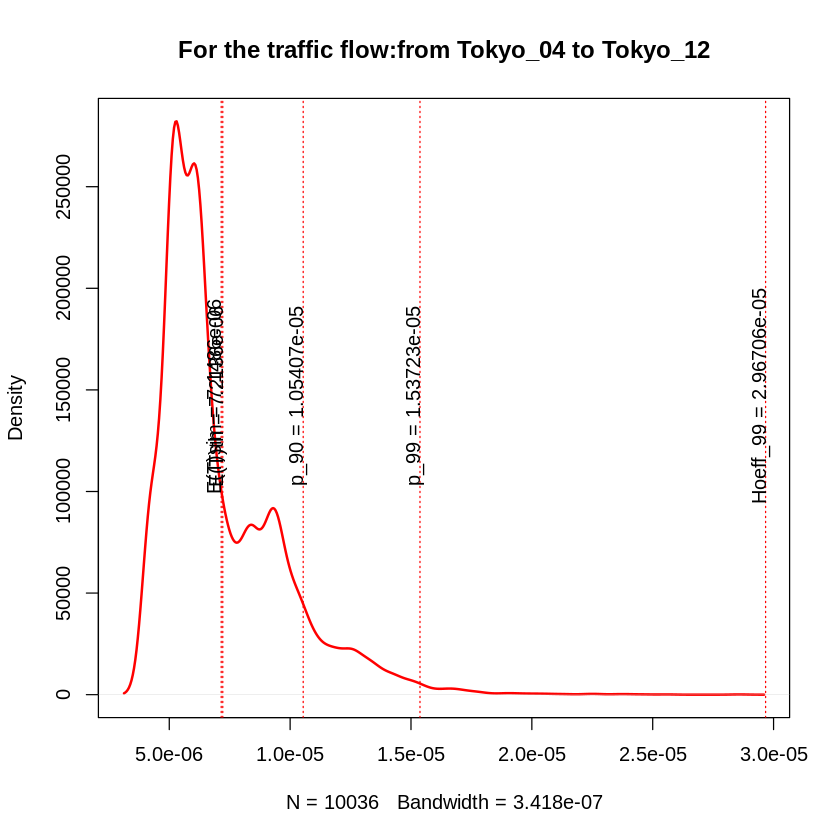

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_13
[1] "variance= 3.77921836073721e-12"
[1] "sigma2= 1.94402118320177e-06"
[1] "igraph E(T) = 3.87462071430324e-06"
[1] "simmer E(T) = 3.73676538236776e-06"


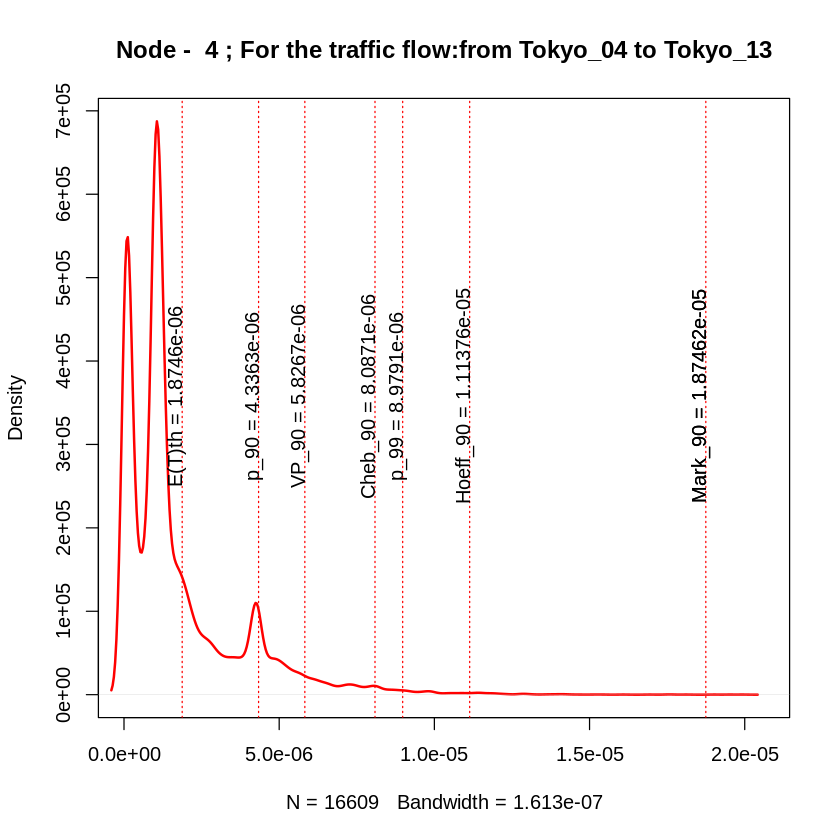

[1] 37
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_14
[1] "traffic_Tokyo_04_Tokyo_14_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 1.79247899102957e-12"
[1] "sigma2= 1.33883493793282e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.19721689732598e-06"


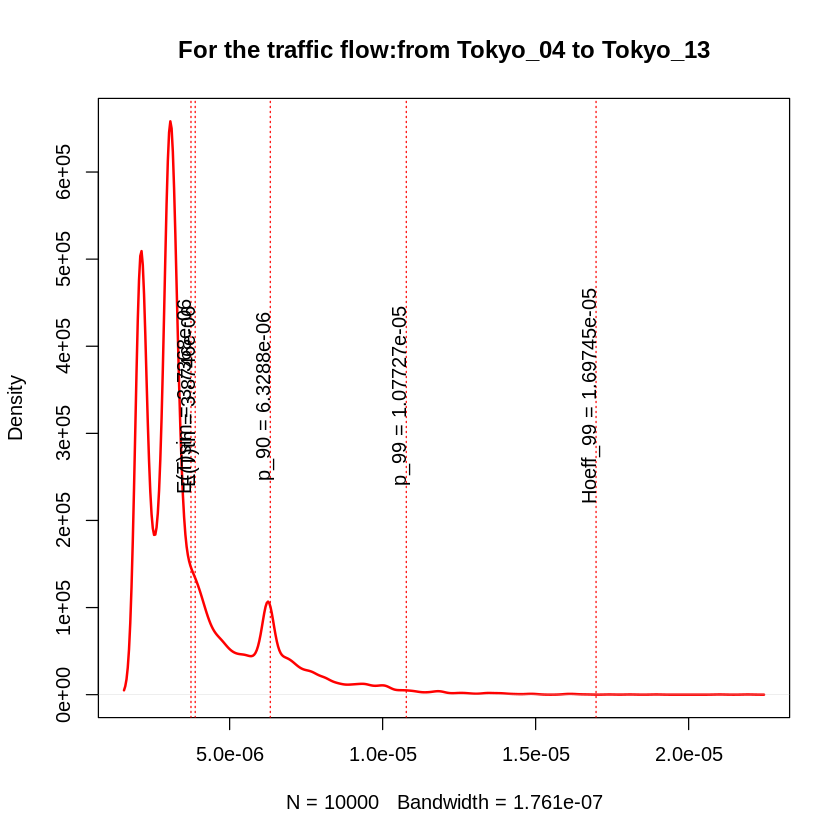

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_14
[1] "variance= 1.7927100905616e-12"
[1] "sigma2= 1.33892124135873e-06"
[1] "igraph E(T) = 2.83901479593088e-06"
[1] "simmer E(T) = 2.69734809976231e-06"


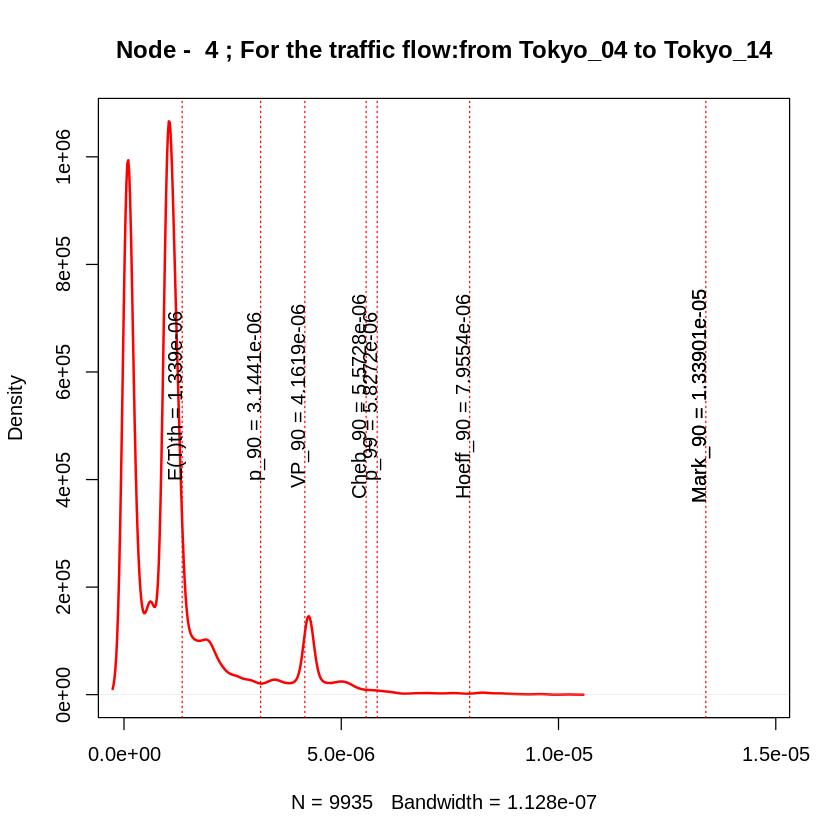

[1] 38
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_14
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_15
[1] "traffic_Tokyo_04_Tokyo_15_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 1.70456457706775e-12"
[1] "sigma2= 1.30558974301568e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.18382144832455e-06"


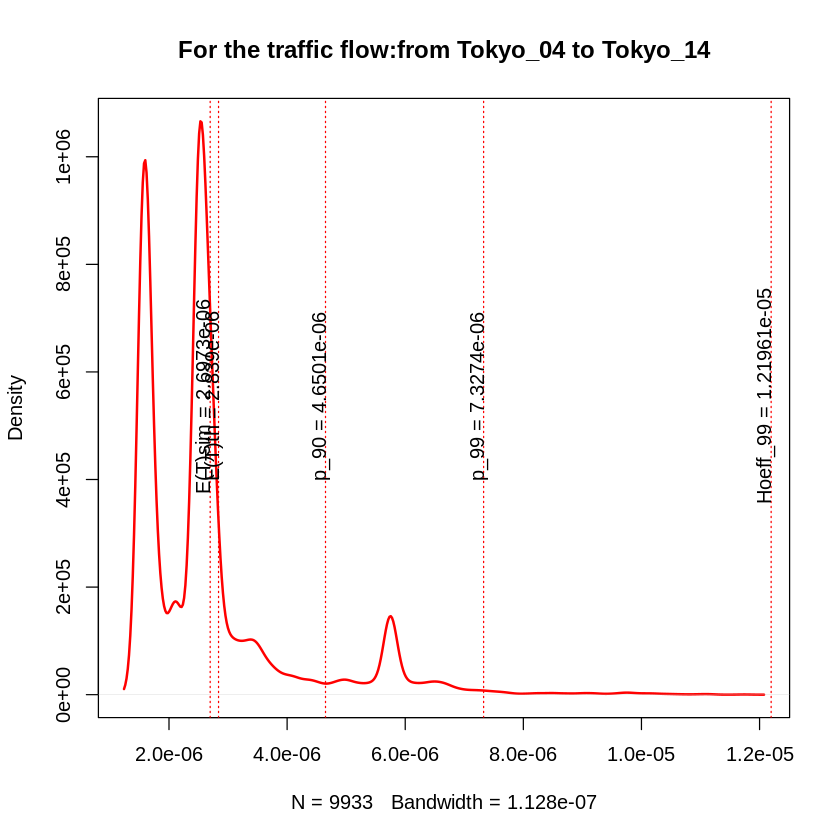

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_14
[1] 14
[1] "Node -  14 :"
[1] "variance= 1.72139482374488e-12"
[1] "sigma2= 1.31201936866225e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.18842985292911e-06"


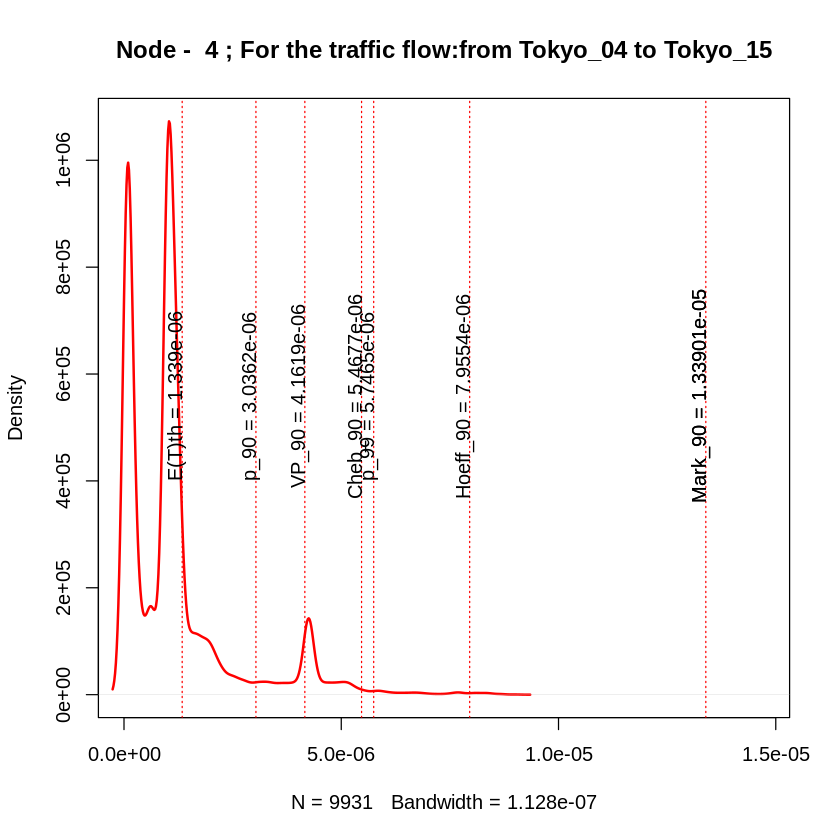

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_15
[1] "variance= 3.41492907052045e-12"
[1] "sigma2= 1.84795266998927e-06"
[1] "igraph E(T) = 5.67802959186177e-06"
[1] "simmer E(T) = 5.37227910386691e-06"


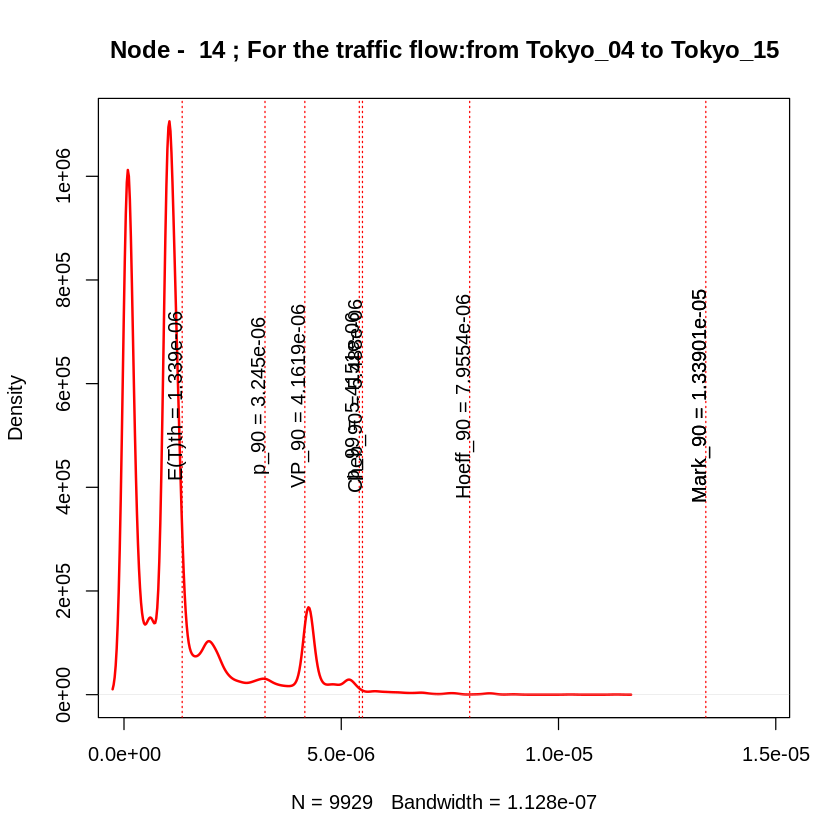

[1] 39
[1] "node_4"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_16
[1] "traffic_Tokyo_04_Tokyo_16_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 3.85944147059891e-12"
[1] "sigma2= 1.96454612330658e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.74600221794461e-06"


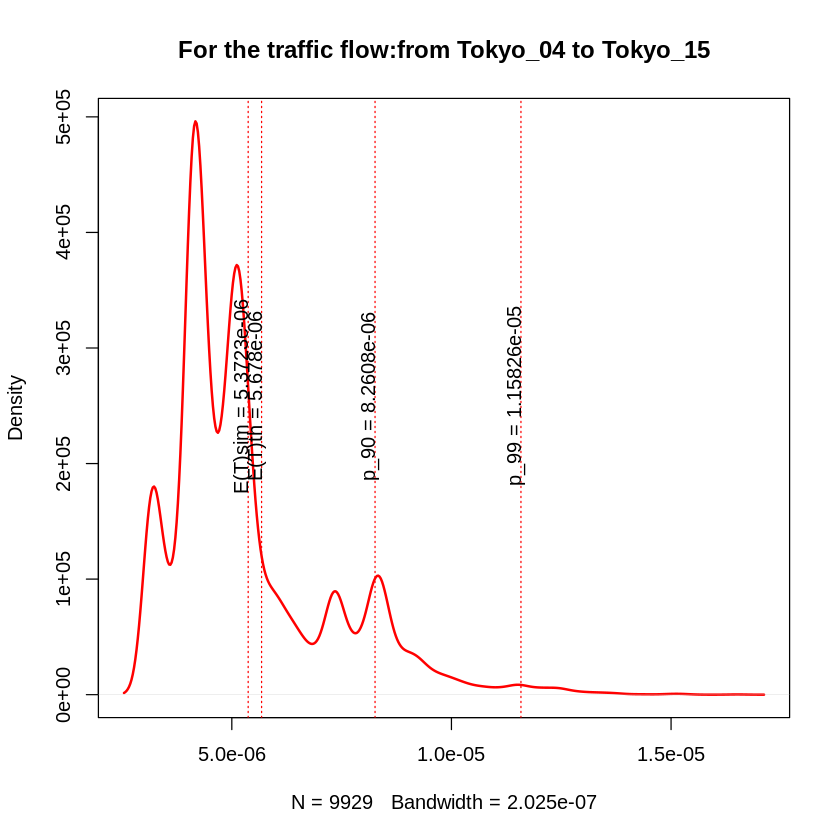

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_16
[1] "variance= 3.77921836073736e-12"
[1] "sigma2= 1.94402118320181e-06"
[1] "igraph E(T) = 3.37462071430324e-06"
[1] "simmer E(T) = 3.23676538236885e-06"


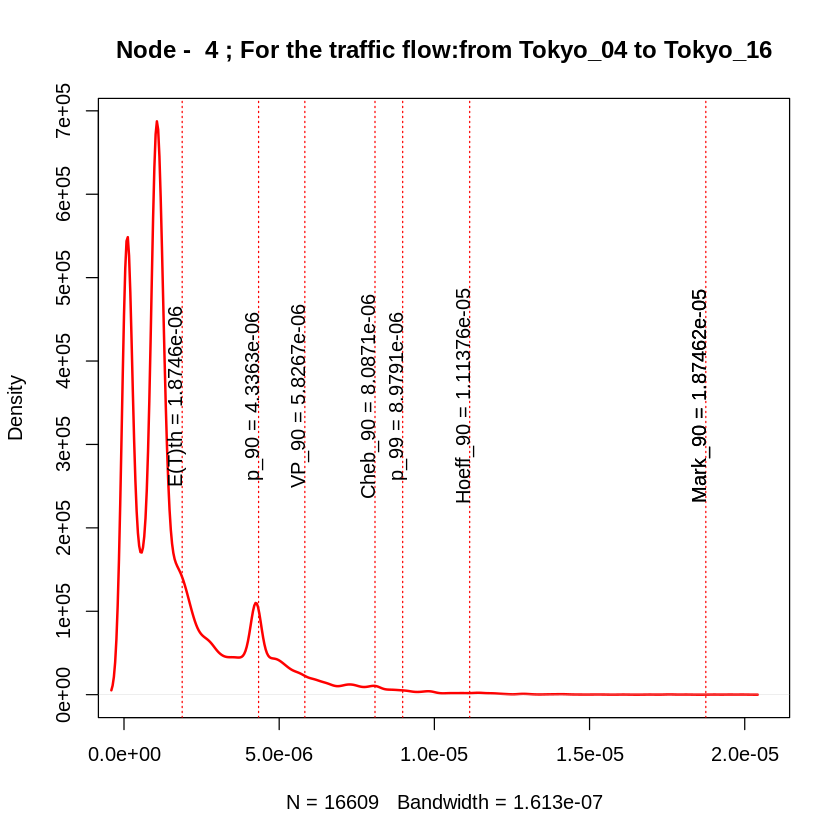

[1] 40
[1] "node_4"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_16
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_17
[1] "traffic_Tokyo_04_Tokyo_17_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 4.28150809793338e-12"
[1] "sigma2= 2.06918053778141e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.820879806877e-06"


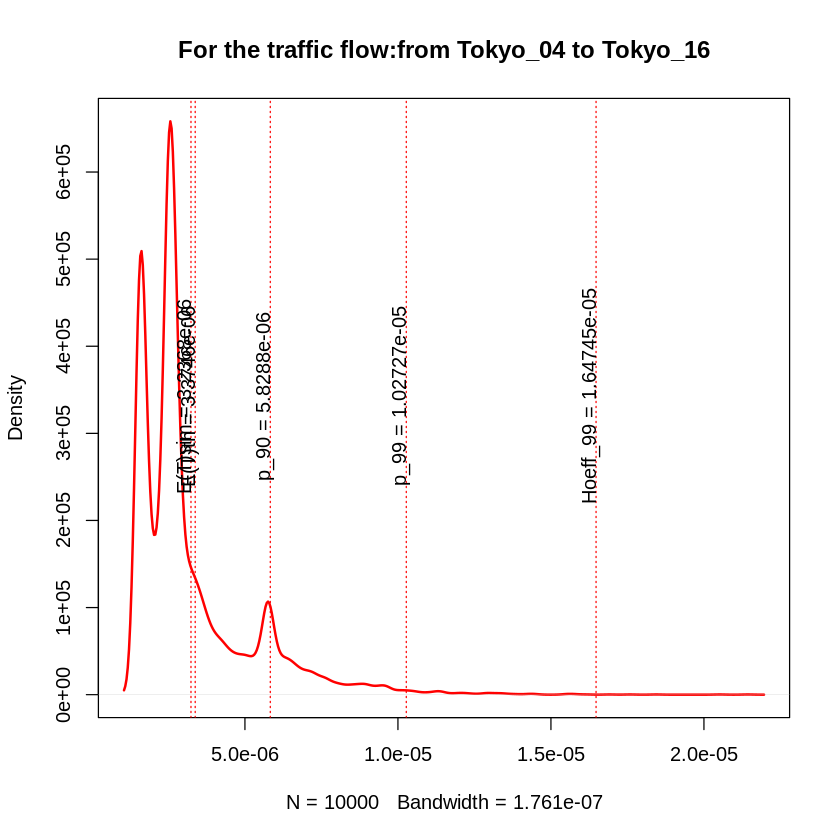

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_16
[1] 16
[1] "Node -  16 :"
[1] "variance= 1.92833874722267e-12"
[1] "sigma2= 1.38864637227145e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.229800804067e-06"


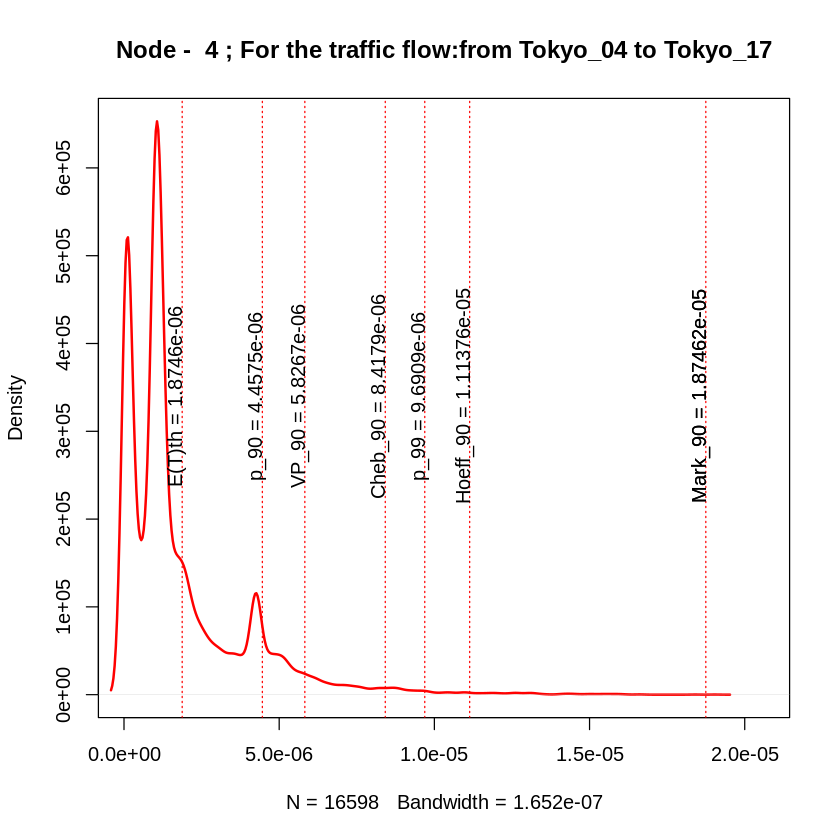

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_17
[1] "variance= 6.11179404950399e-12"
[1] "sigma2= 2.47220428959744e-06"
[1] "igraph E(T) = 5.71363551023412e-06"
[1] "simmer E(T) = 5.52233606374804e-06"


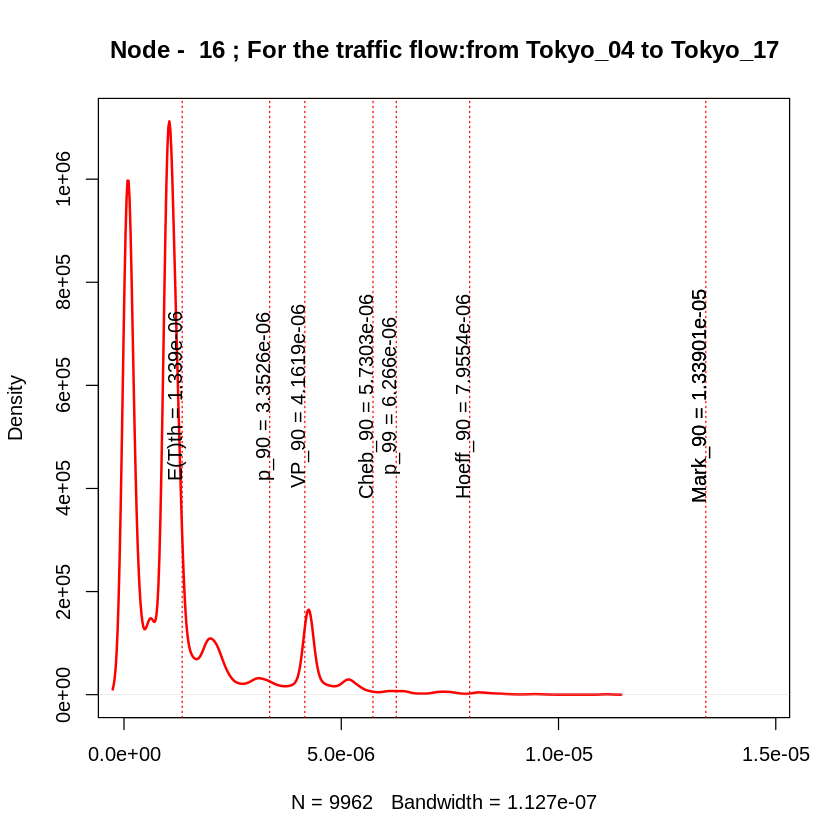

[1] 41
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_05->Tokyo_18
[1] "traffic_Tokyo_05_Tokyo_18_"
[1] 5
[1] "Node -  5 :"
[1] "variance= 1.79247899102957e-12"
[1] "sigma2= 1.33883493793282e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.19721689732598e-06"


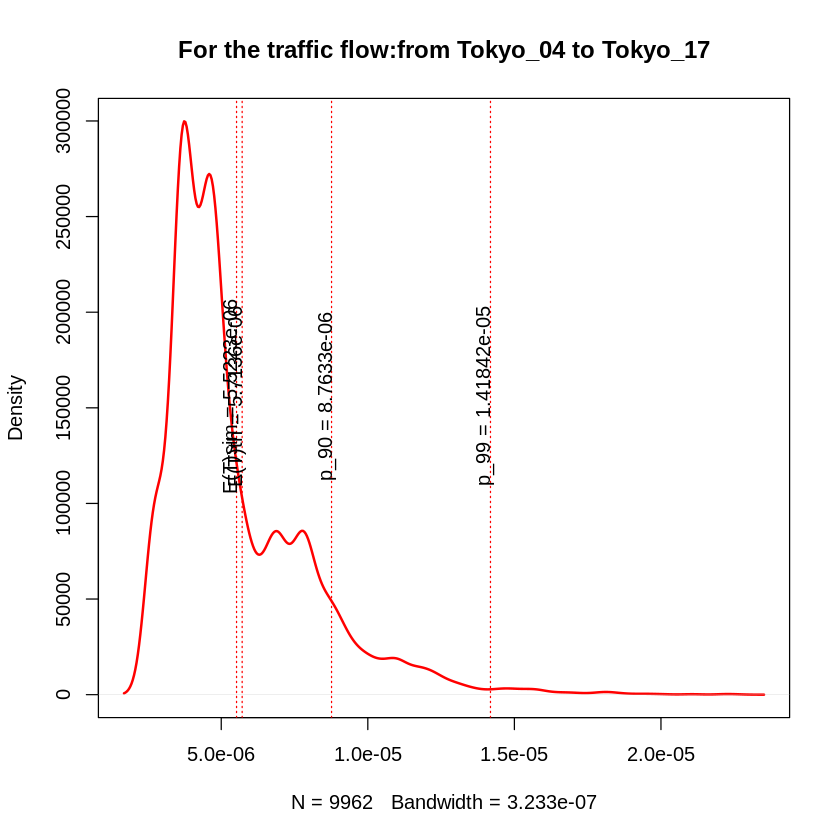

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_05->Tokyo_18
[1] "variance= 1.7927100905616e-12"
[1] "sigma2= 1.33892124135873e-06"
[1] "igraph E(T) = 2.83901479593088e-06"
[1] "simmer E(T) = 2.69734809976231e-06"


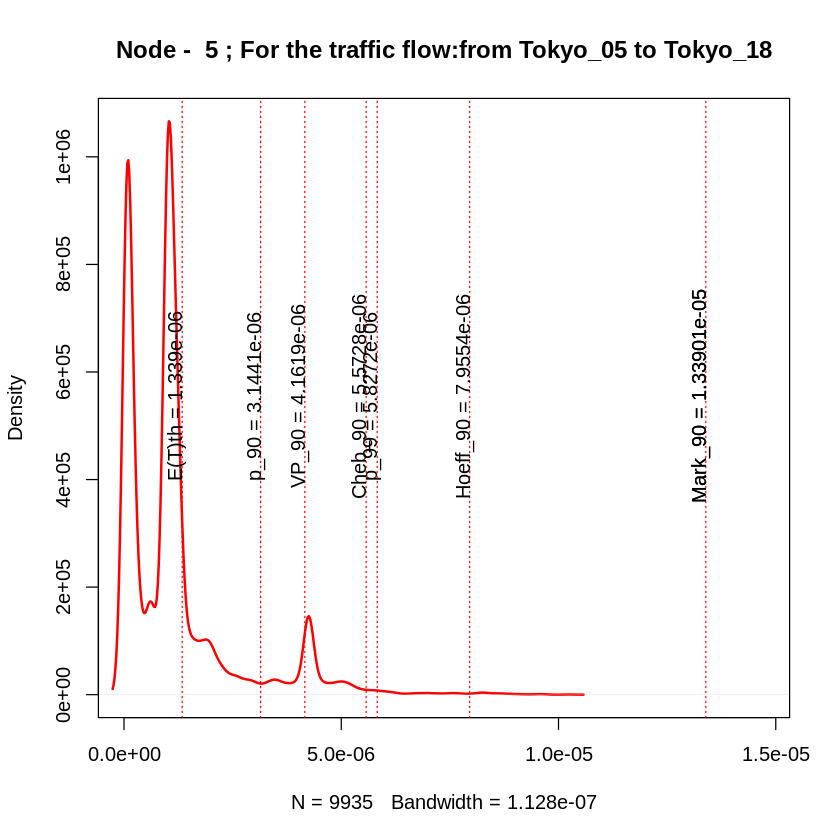

[1] 42
[1] "node_4"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_16
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_19
[1] "traffic_Tokyo_04_Tokyo_19_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 4.28150809793338e-12"
[1] "sigma2= 2.06918053778141e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.820879806877e-06"


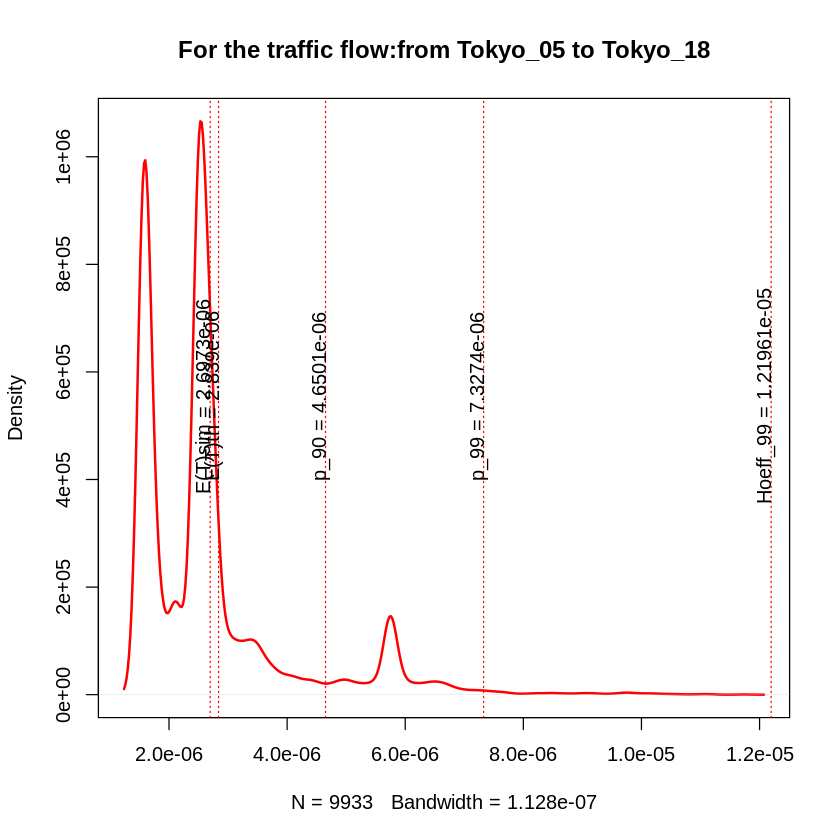

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_16
[1] 16
[1] "Node -  16 :"
[1] "variance= 1.92833874722267e-12"
[1] "sigma2= 1.38864637227145e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.229800804067e-06"


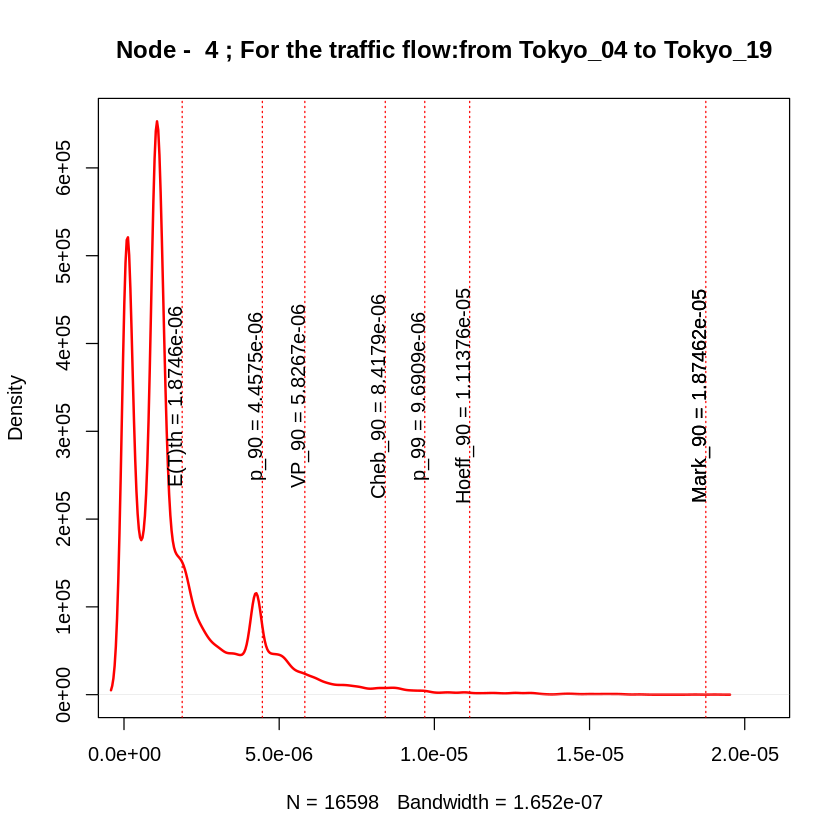

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_16->Tokyo_19
[1] "variance= 6.11179404950399e-12"
[1] "sigma2= 2.47220428959744e-06"
[1] "igraph E(T) = 5.71363551023412e-06"
[1] "simmer E(T) = 5.52233606374804e-06"


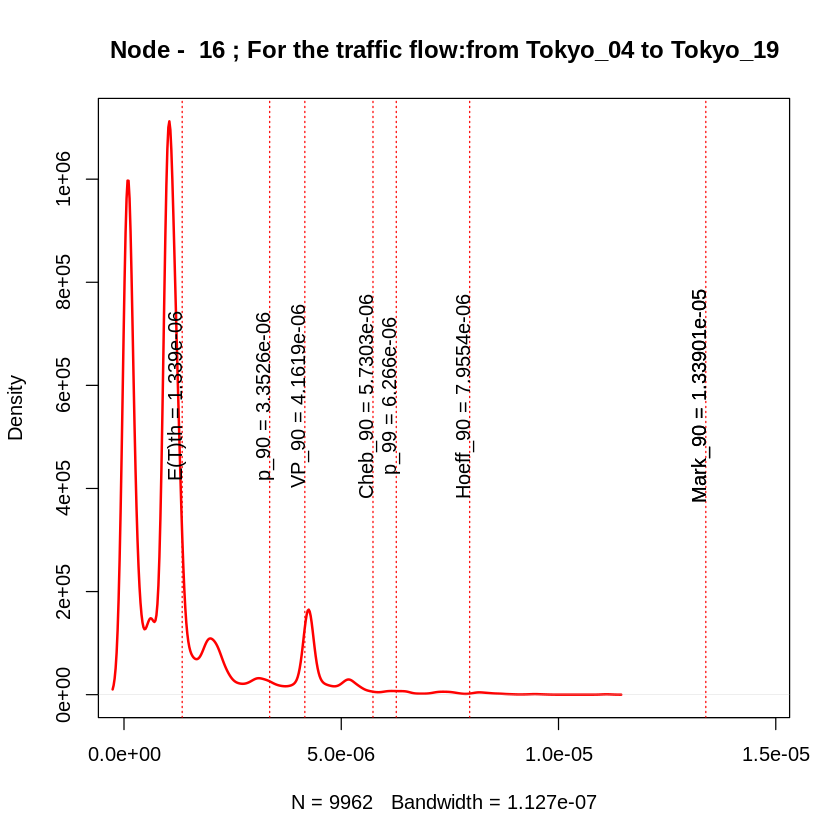

[1] 43
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_14
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_20
[1] "traffic_Tokyo_04_Tokyo_20_"
[1] 4
[1] "Node -  4 :"
[1] "variance= 1.70456457706775e-12"
[1] "sigma2= 1.30558974301568e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.18382144832455e-06"


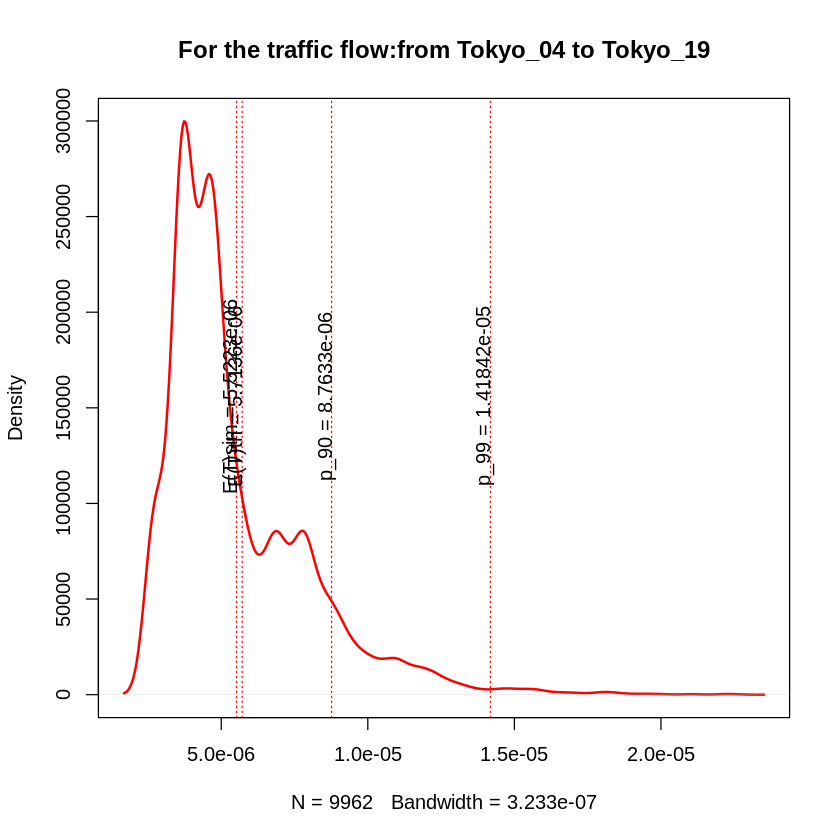

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_04->Tokyo_14
[1] 14
[1] "Node -  14 :"
[1] "variance= 1.72139482374488e-12"
[1] "sigma2= 1.31201936866225e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.18842985292911e-06"


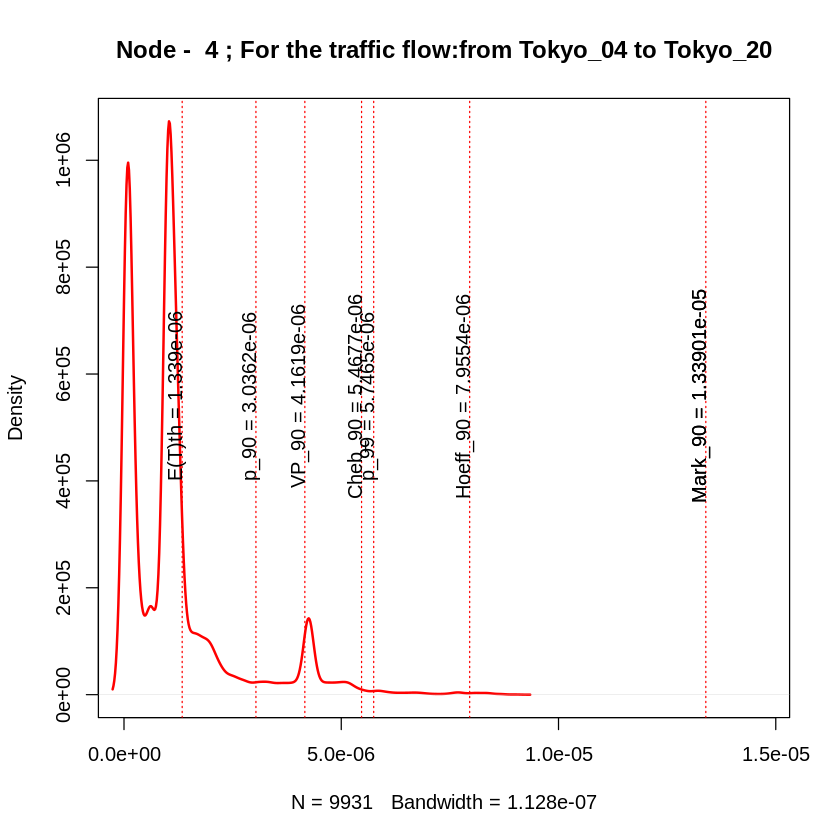

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_14->Tokyo_20
[1] "variance= 3.41492907052045e-12"
[1] "sigma2= 1.84795266998927e-06"
[1] "igraph E(T) = 5.67802959186177e-06"
[1] "simmer E(T) = 5.37227910386691e-06"


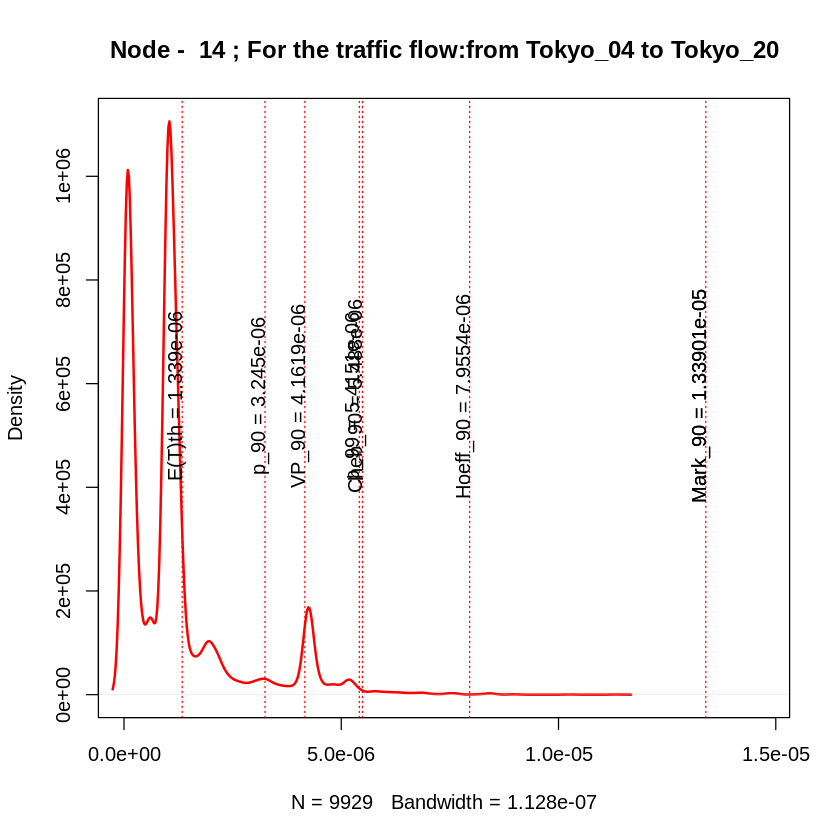

[1] 44
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_05->Tokyo_18
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_18->Tokyo_21
[1] "traffic_Tokyo_05_Tokyo_21_"
[1] 5
[1] "Node -  5 :"
[1] "variance= 1.70456457706775e-12"
[1] "sigma2= 1.30558974301568e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.18382144832455e-06"


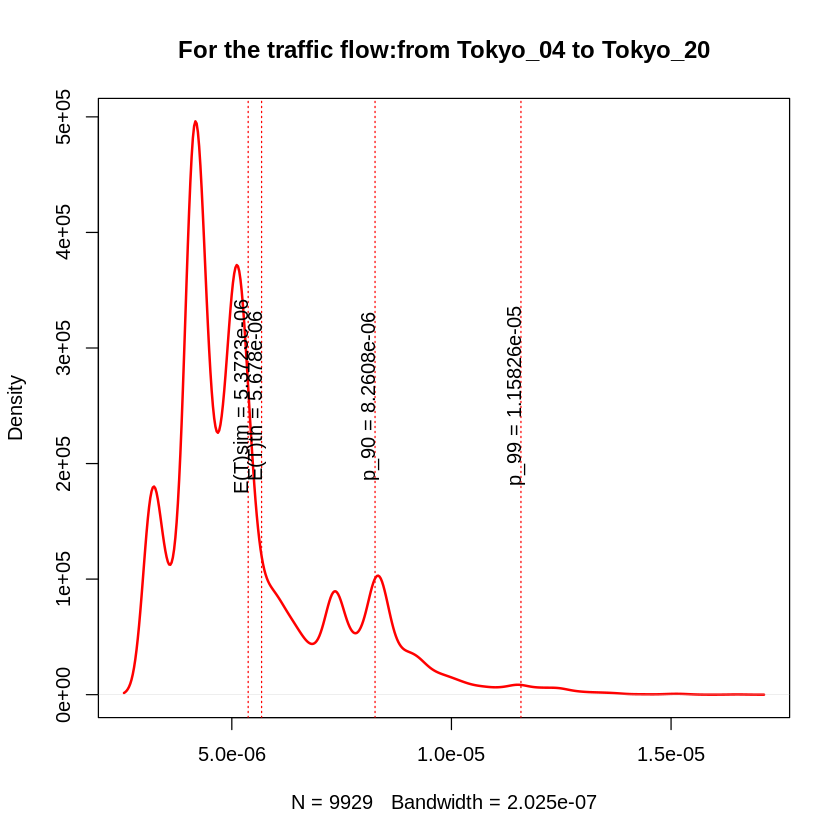

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_05->Tokyo_18
[1] 18
[1] "Node -  18 :"
[1] "variance= 1.72139482374488e-12"
[1] "sigma2= 1.31201936866225e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.18842985292911e-06"


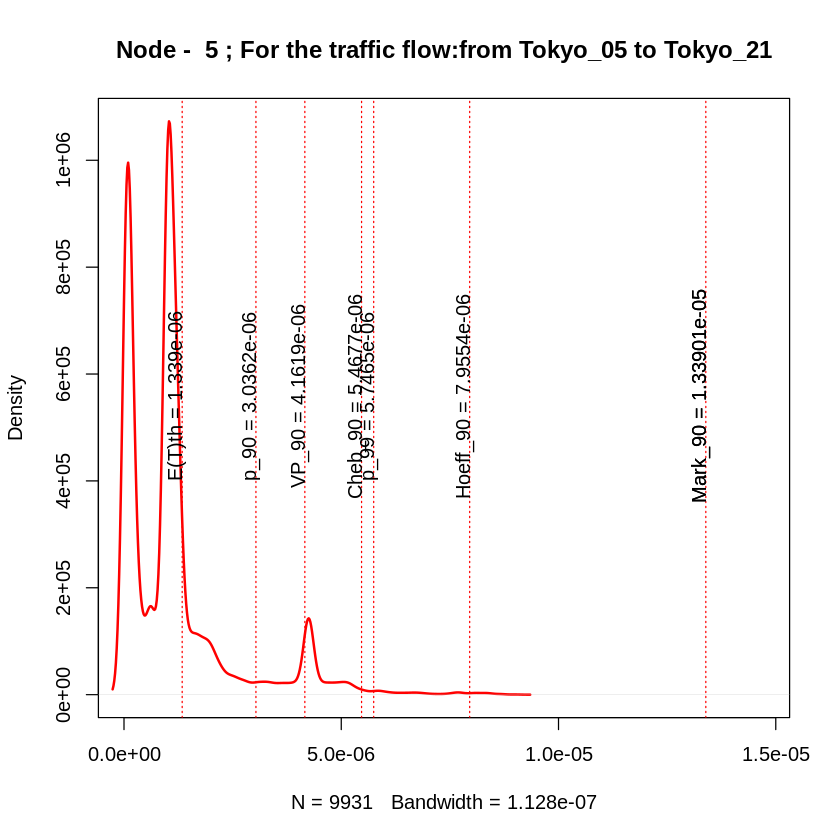

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_18->Tokyo_21
[1] "variance= 3.41492907052045e-12"
[1] "sigma2= 1.84795266998927e-06"
[1] "igraph E(T) = 5.67802959186177e-06"
[1] "simmer E(T) = 5.37227910386691e-06"


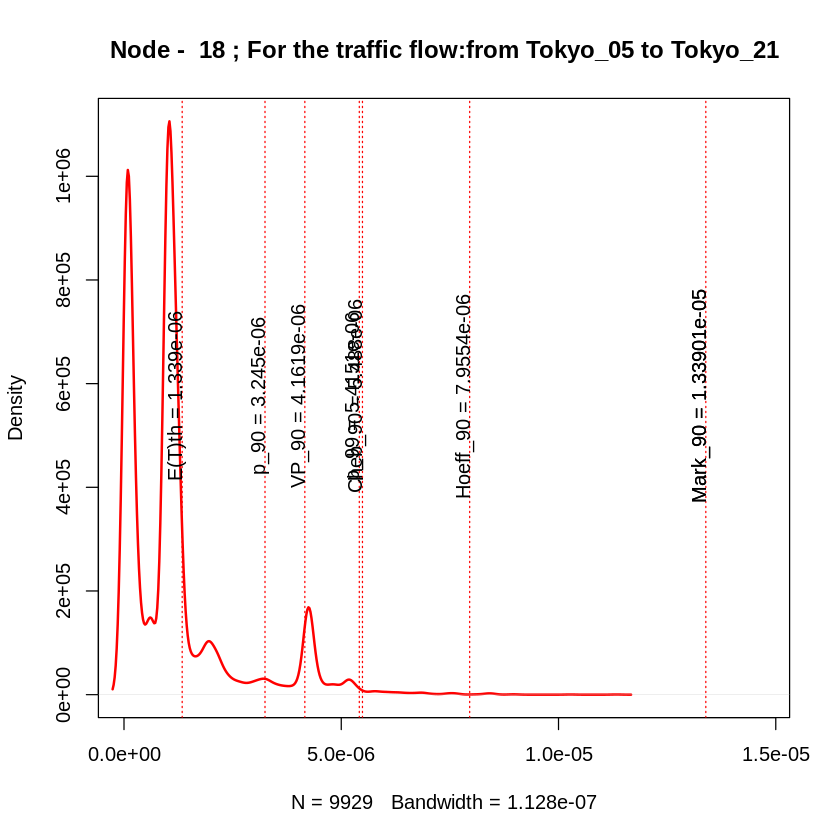

[1] 45
[1] "node_6"
[1] 1226651
[1] 0.5
[1] 245330.1
[1] 367995.2
[1] 613325.4
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_06
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_07
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_07->Tokyo_22
[1] "traffic_Tokyo_01_Tokyo_22_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 2.00343417997715e-12"
[1] "sigma2= 1.41542720758687e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.23937756928158e-06"


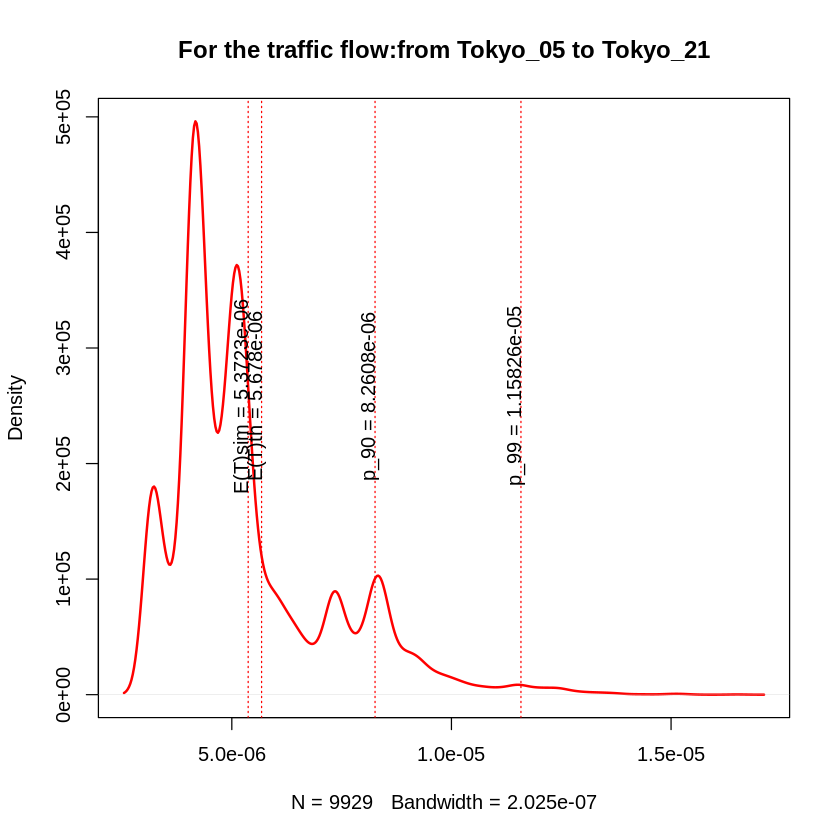

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_06
[1] 6
[1] "Node -  6 :"
[1] "variance= 3.96984949327487e-12"
[1] "sigma2= 1.99244811557914e-06"
[1] "igraph E(T) = 1.87462071430324e-06"
[1] "simmer E(T) = 1.79413464962833e-06"


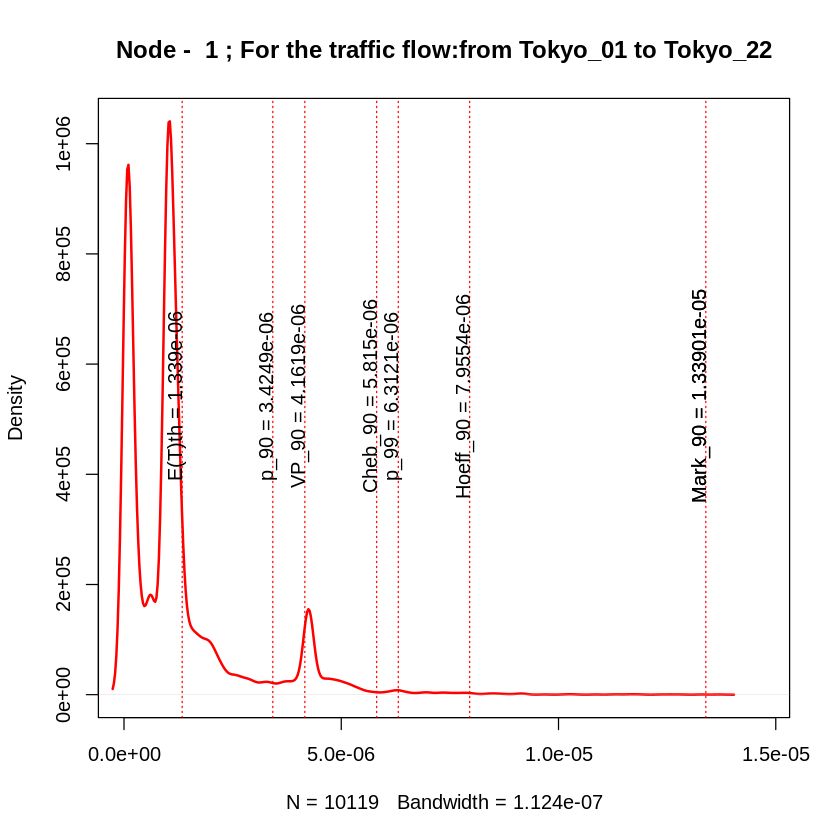

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_06->Tokyo_07
[1] 7
[1] "Node -  7 :"
[1] "variance= 1.9177497005552e-12"
[1] "sigma2= 1.38482840112239e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.2180842783947e-06"


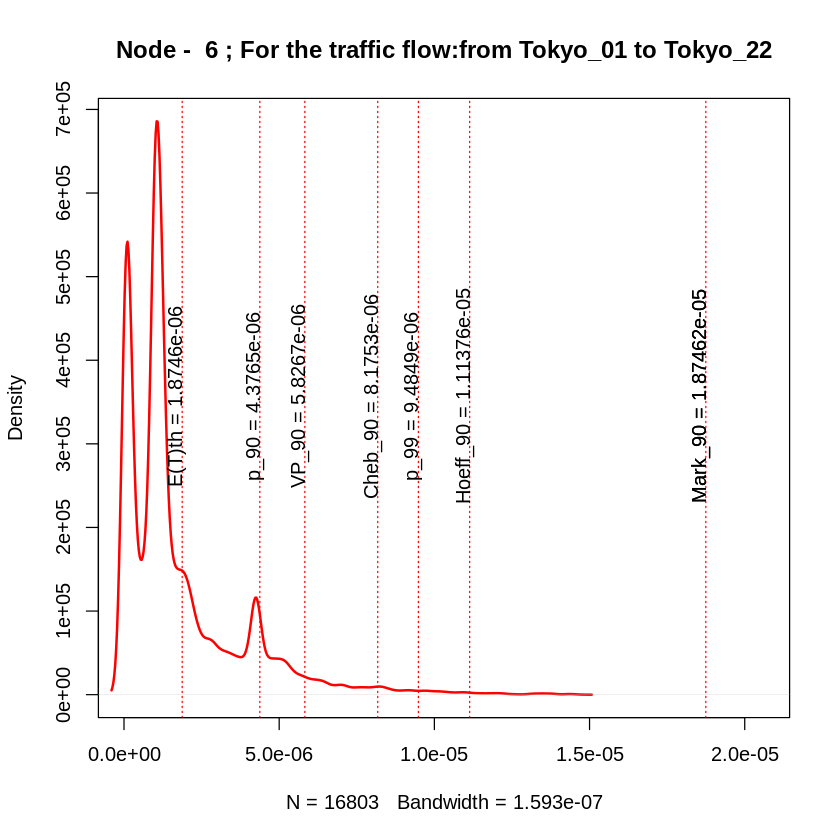

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_07->Tokyo_22
[1] "variance= 7.68301177252703e-12"
[1] "sigma2= 2.77182462874675e-06"
[1] "igraph E(T) = 1.0552650306165e-05"
[1] "simmer E(T) = 1.02590985606159e-05"


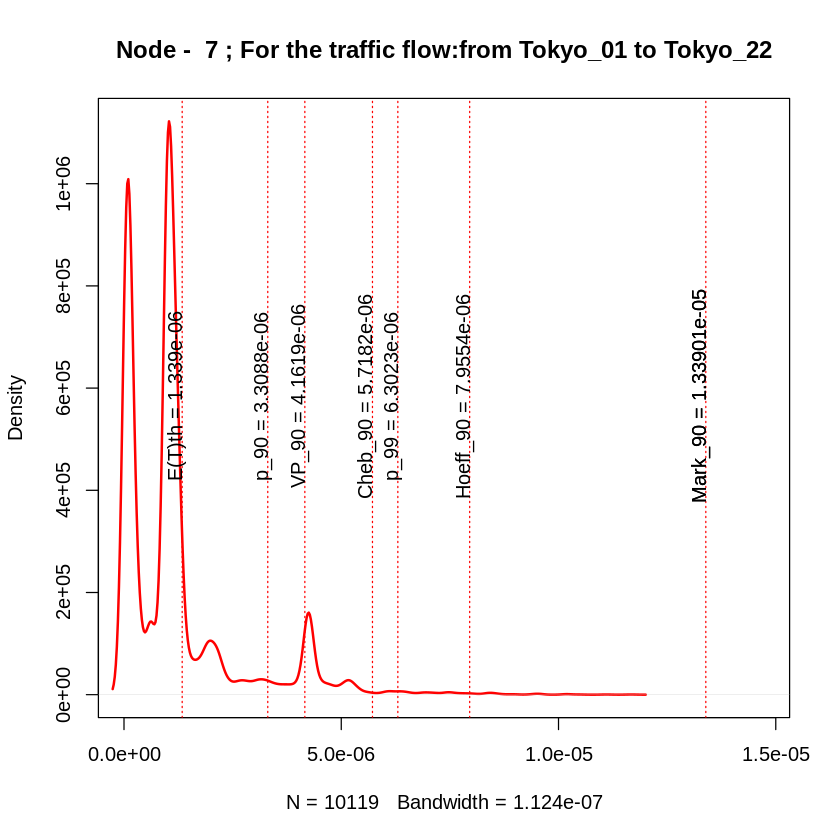

[1] 46
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_02
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_02->Tokyo_08
+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_08->Tokyo_23
[1] "traffic_Tokyo_01_Tokyo_23_"
[1] 1
[1] "Node -  1 :"
[1] "variance= 1.82067203352272e-12"
[1] "sigma2= 1.34932280552977e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.21382230943176e-06"


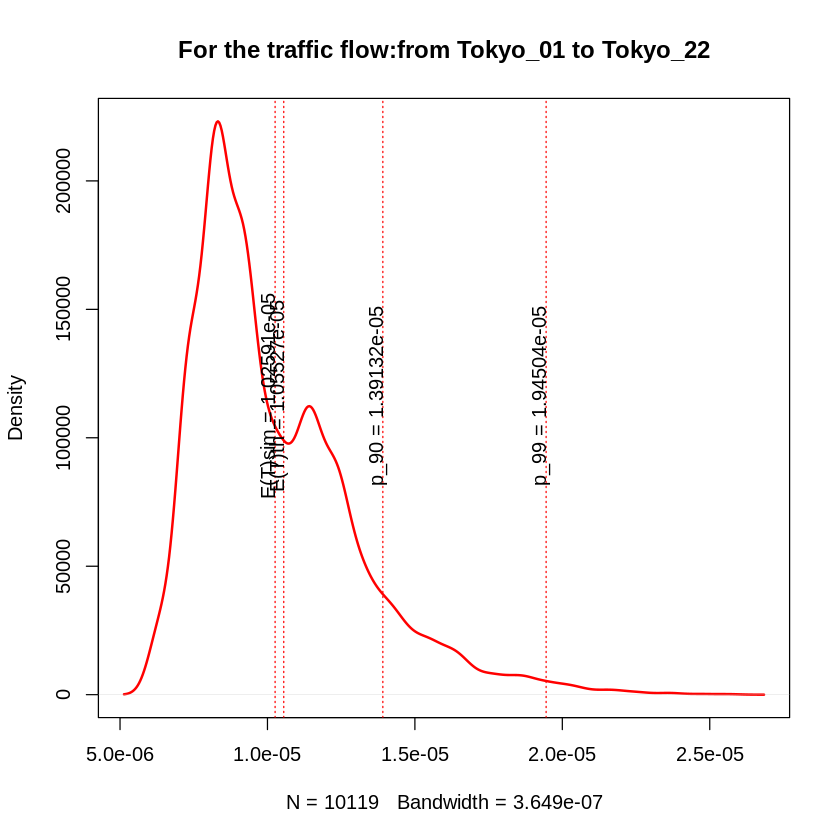

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_01->Tokyo_02
[1] 2
[1] "Node -  2 :"
[1] "variance= 1.70687697250668e-12"
[1] "sigma2= 1.30647501794205e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.18329527683208e-06"


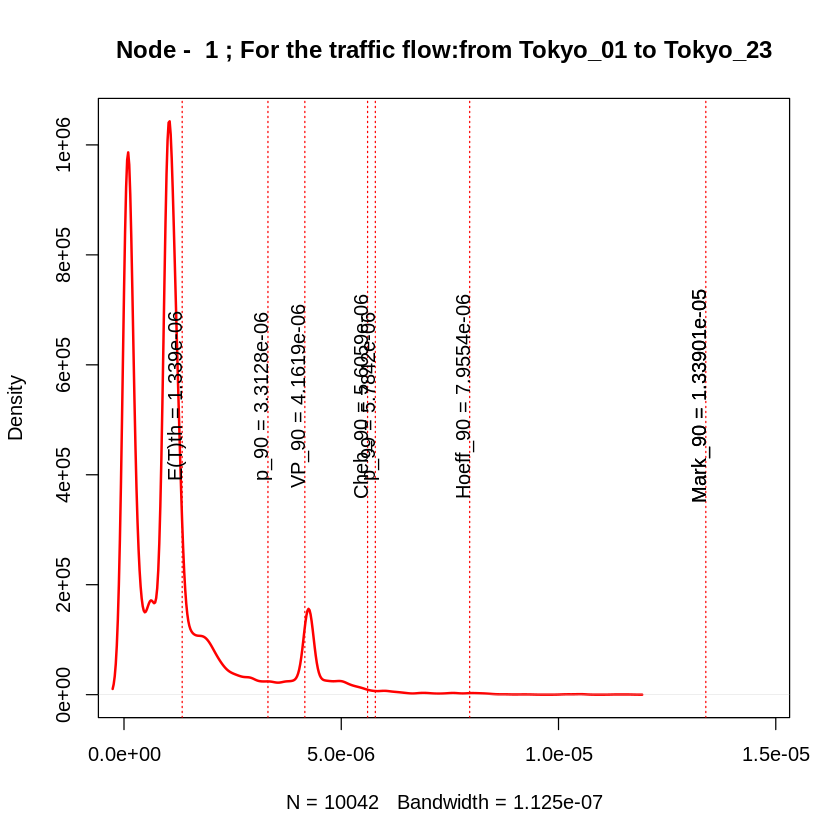

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_02->Tokyo_08
[1] 8
[1] "Node -  8 :"
[1] "variance= 2.06019059975309e-12"
[1] "sigma2= 1.43533640647518e-06"
[1] "igraph E(T) = 1.33901479593088e-06"
[1] "simmer E(T) = 1.27003769586474e-06"


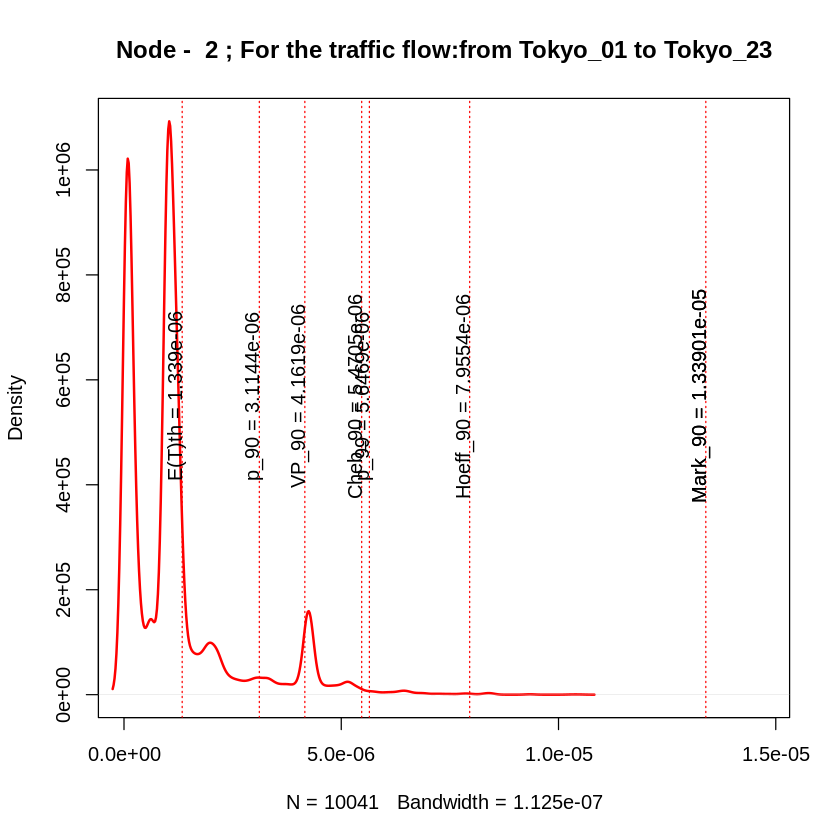

+ 1/86 edge from abab33b (vertex names):
[1] Tokyo_08->Tokyo_23
[1] "variance= 5.46207518340051e-12"
[1] "sigma2= 2.33710829518029e-06"
[1] "igraph E(T) = 1.15170443877927e-05"
[1] "simmer E(T) = 1.11677460322529e-05"


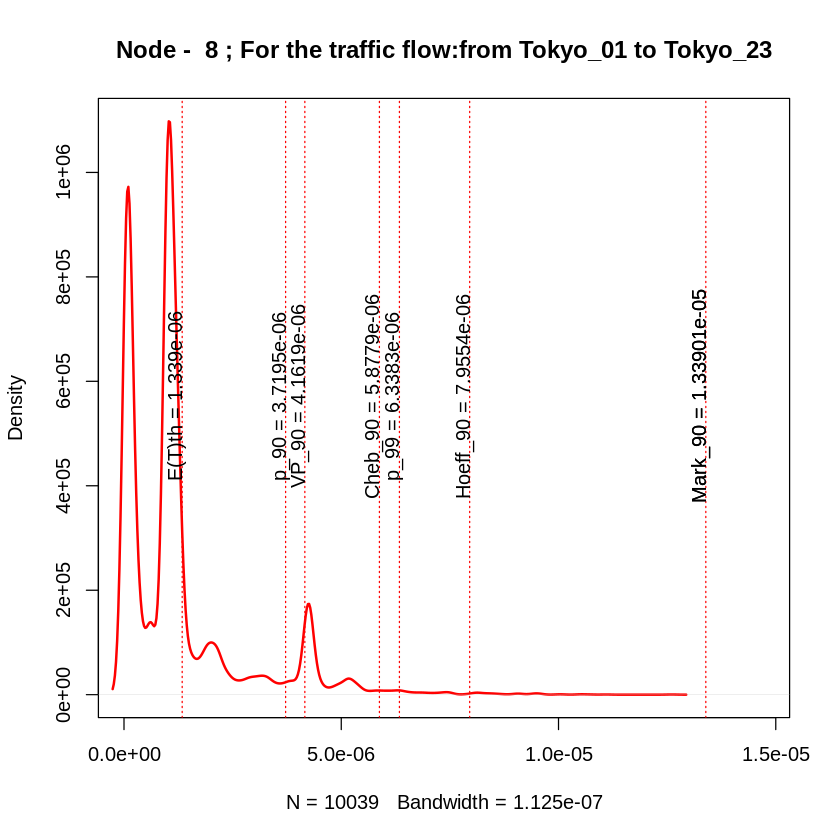

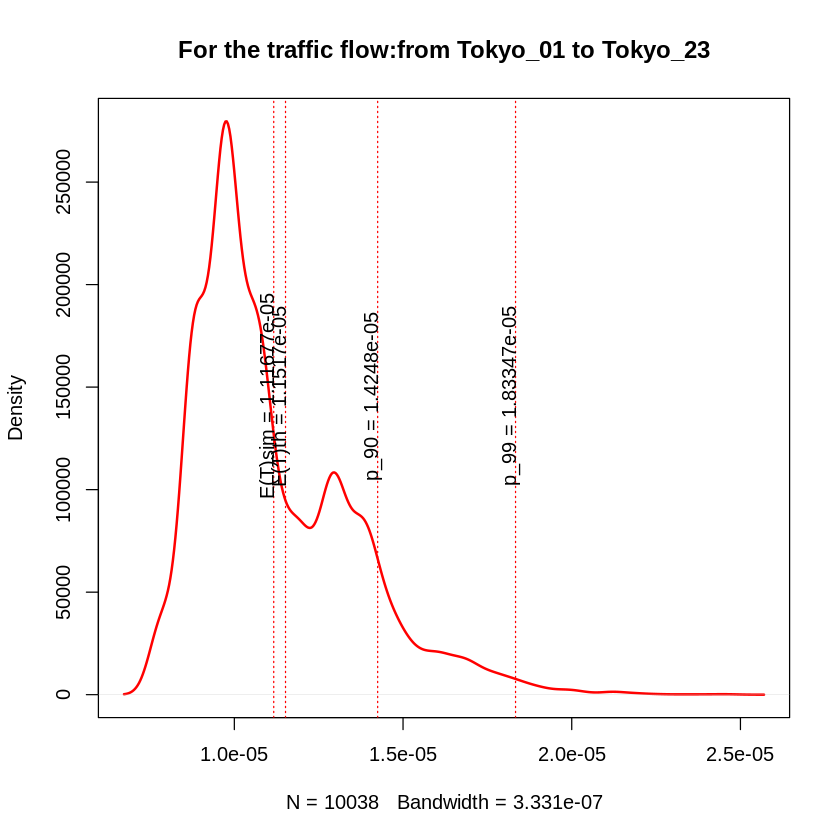

In [121]:
c(traffic_file$Delay_sim_s, traffic_file$Delay_th_s, traffic_file$D99_sim_s, traffic_file$VPbound_99th_s, g_c10) := simulation_simmer(g_c10, traffic_file, PS_size, PS_weights, load = 0.3, CapacityGbps = CapacityGbps)
traffic_file_v2 <- dplyr::filter(traffic_file, VPbound_99th_s != 0)


#Results

In [122]:
links_info_df

sourceID,destinationID,distanceKm,capacityGbps,prop_delay_s
<chr>,<chr>,<dbl>,<dbl>,<dbl>
Tokyo_01,Tokyo_02,1.0,1346.3282,5e-06
Tokyo_01,Tokyo_03,1.0,928.3888,5e-06
Tokyo_01,Tokyo_04,0.8,0.0000,4e-06
Tokyo_01,Tokyo_05,0.8,0.0000,4e-06
Tokyo_01,Tokyo_06,0.8,1750.3771,4e-06
Tokyo_02,Tokyo_01,1.0,8856.2896,5e-06
Tokyo_02,Tokyo_03,1.0,0.0000,5e-06
Tokyo_02,Tokyo_08,1.0,917.3704,5e-06
Tokyo_03,Tokyo_01,1.0,7263.4942,5e-06


In [123]:
traffic_file_v2

sourceID,destinationID,trafficGbps,service,traffic_ps,latencyPropTransQueuing_theor_s_mg1,latencyPercentile99_theor_s_mg1,Delay_sim_s,Delay_th_s,D99_sim_s,VPbound_99th_s
<chr>,<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Tokyo_02,Tokyo_01,3,CWB,367995.2,2.642017e-06,3.588795e-06,2.631339e-06,2.642017e-06,3.141110e-06,3.588795e-06
Tokyo_03,Tokyo_01,3,CWB,367995.2,2.642017e-06,3.588795e-06,2.631339e-06,2.642017e-06,3.141110e-06,3.588795e-06
Tokyo_06,Tokyo_01,3,CWB,367995.2,2.142017e-06,3.088795e-06,2.131339e-06,2.142017e-06,2.641110e-06,3.088795e-06
Tokyo_07,Tokyo_01,3,CWB,367995.2,5.481032e-06,1.445786e-05,5.362629e-06,5.481032e-06,1.018707e-05,1.445786e-05
Tokyo_08,Tokyo_01,3,CWB,367995.2,6.481032e-06,1.545786e-05,6.354782e-06,6.481032e-06,1.097502e-05,1.545786e-05
Tokyo_09,Tokyo_01,3,CWB,367995.2,6.481032e-06,1.545786e-05,6.354782e-06,6.481032e-06,1.097502e-05,1.545786e-05
Tokyo_10,Tokyo_04,3,CWB,367995.2,6.016637e-06,1.854992e-05,5.920128e-06,6.016637e-06,1.290013e-05,1.854992e-05
Tokyo_11,Tokyo_01,3,CWB,367995.2,1.032005e-05,2.297985e-05,1.010755e-05,1.032005e-05,1.667746e-05,2.297985e-05
Tokyo_12,Tokyo_04,3,CWB,367995.2,6.016637e-06,1.854992e-05,5.920128e-06,6.016637e-06,1.290013e-05,1.854992e-05


#Calculation of delays for different capacities

In [124]:

c(g_c10_dg_l05, data_av_c10_dg_l05, data_99_c10_dg_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 10, calc_dist = 0, distance = 5, Load_local = Load_local, Load_regional = Load_regional, Load_national = Load_national, prefix_base, national_nodes, regional_nodes , N, Cs2)
c(g_c40_dg_l05, data_av_c40_dg_l05, data_99_c40_dg_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 40, calc_dist = 0,  distance = 5, Load_local = Load_local, Load_regional = Load_regional, Load_national = Load_national, prefix_base, national_nodes, regional_nodes , N, Cs2)
c(g_c100_dg_l05, data_av_c100_dg_l05, data_99_c100_dg_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 0,  distance = 5, Load_local = Load_local, Load_regional = Load_regional, Load_national = Load_national, prefix_base, national_nodes, regional_nodes , N, Cs2)
c(g_c400_dg_l05, data_av_c400_dg_l05, data_99_c400_dg_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 400, calc_dist = 0,  distance = 5, Load_local = Load_local, Load_regional = Load_regional, Load_national = Load_national, prefix_base, national_nodes, regional_nodes , N, Cs2)

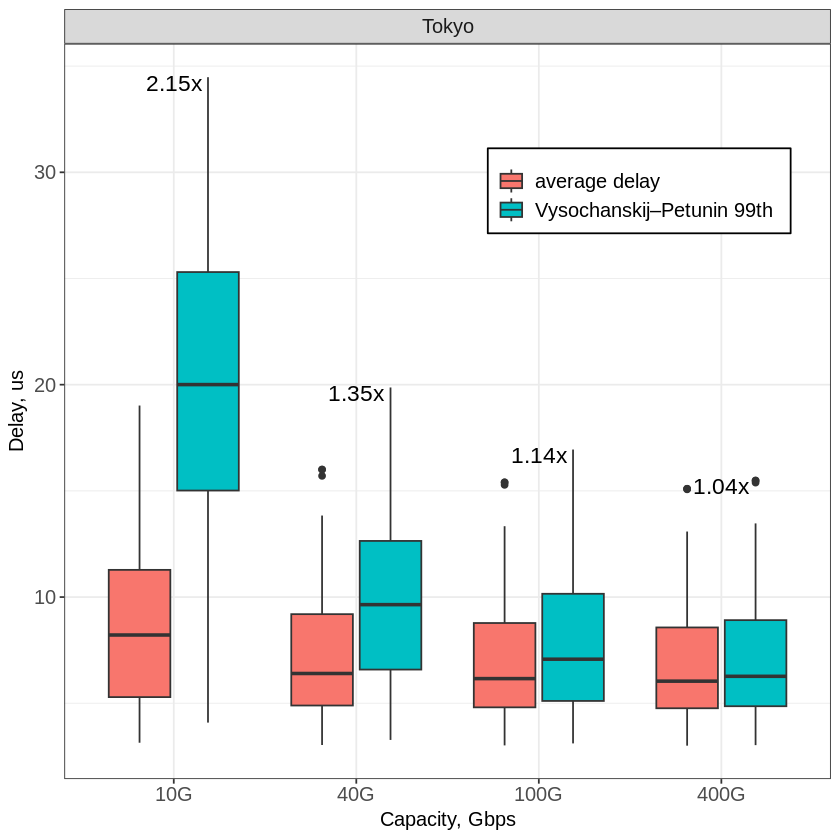

In [125]:
#Boxplots

df_plot_capacity <- data.frame(capacity = c(rep("10G", length(data_99_c10_dg_l05)),
                                            rep("40G", length(data_99_c40_dg_l05)),
                                            rep("100G", length(data_99_c100_dg_l05)),
                                            rep("400G", length(data_99_c400_dg_l05)),
                                            rep("10G", length(data_av_c10_dg_l05)),
                                            rep("40G", length(data_av_c40_dg_l05)),
                                            rep("100G", length(data_av_c100_dg_l05)),
                                            rep("400G", length(data_av_c400_dg_l05))),
                               value = c(data_99_c10_dg_l05,
                                         data_99_c40_dg_l05,
                                         data_99_c100_dg_l05,
                                         data_99_c400_dg_l05,
                                         data_av_c10_dg_l05,
                                         data_av_c40_dg_l05,
                                         data_av_c100_dg_l05,
                                         data_av_c400_dg_l05),
                               type_of_calc = c(rep("Vysochanskij–Petunin 99th",length(data_99_c10_dg_l05)*4),
                                                rep("average delay",length(data_99_c10_dg_l05)*4)),
                               city = c(rep(topology_name,length(data_99_c10_dg_l05)*8)))

# Calculate the mean N values for each capacity group
N_means <- c(mean(data_99_c10_dg_l05)/mean(data_av_c10_dg_l05),
             mean(data_99_c40_dg_l05)/mean(data_av_c40_dg_l05),
             mean(data_99_c100_dg_l05)/mean(data_av_c100_dg_l05),
             mean(data_99_c400_dg_l05)/mean(data_av_c400_dg_l05))
N_means_y <- c(max(data_99_c10_dg_l05),
               max(data_99_c40_dg_l05),
               max(data_99_c100_dg_l05),
               max(data_99_c400_dg_l05))

text_size = 12
# Grouped boxplot
ggplot(df_plot_capacity, aes(x = fct_reorder(capacity, value, .desc = TRUE), y = value * 1000000, fill = type_of_calc)) +
  geom_boxplot() +
  theme_bw() +
  theme(
    legend.title = element_blank(),
    legend.position = c(0.75, 0.8),
    axis.title.y = element_text(size = text_size),
    axis.title.x = element_text(size = text_size),
    legend.text = element_text(size = text_size),
    legend.background = element_rect(colour = "black"),
    axis.text = element_text(size = text_size),
    strip.text = element_text(size = text_size)
  ) +
  facet_grid(. ~ city ) +
  ylab("Delay, us") +
  xlab("Capacity, Gbps") +
  annotate("text", x = c(1,2,3,4), y = N_means_y*1e6 - 1,
           label = paste0(round(N_means, 2), "x"), vjust = -0.5, size = text_size/2.5)

#Calculation of delays for different distances

In [126]:
#Calculation of delays for different distances
c(g_c100_d05g_l05, data_av_c100_d05g_l05, data_99_c100_d05g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 0.5, Load_local = Load_local, Load_regional = Load_regional, Load_national = Load_national, prefix_base, national_nodes, regional_nodes , N, Cs2)
c(g_c100_d2g_l05, data_av_c100_d2g_l05, data_99_c100_d2g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 2, Load_local = Load_local, Load_regional = Load_regional, Load_national = Load_national, prefix_base, national_nodes, regional_nodes , N, Cs2)
c(g_c100_d4g_l05, data_av_c100_d4g_l05, data_99_c100_d4g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 4, Load_local = Load_local, Load_regional = Load_regional, Load_national = Load_national, prefix_base, national_nodes, regional_nodes , N, Cs2)
c(g_c100_d10g_l05, data_av_c100_d10g_l05, data_99_c100_d10g_l05) :=simulation_igraph(nodes_info, links_info, traffic_file, Capacity = 100, calc_dist = 1, distance = 10, Load_local = Load_local, Load_regional = Load_regional, Load_national = Load_national, prefix_base, national_nodes, regional_nodes , N, Cs2)

[1] "0.5x diam 2.6 km av link dist 0.39 km"

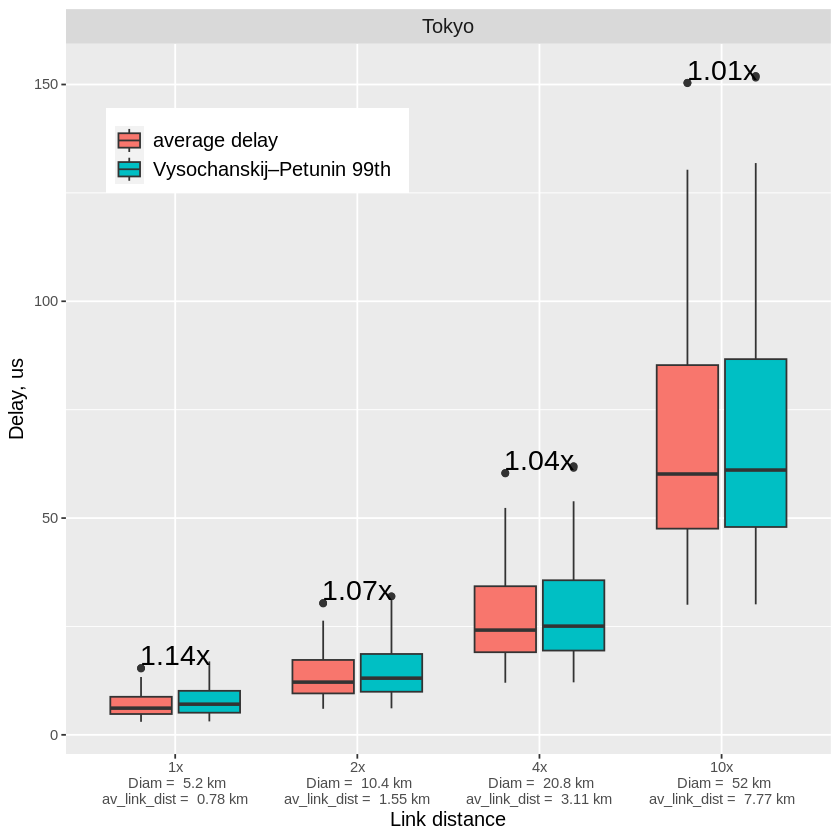

In [127]:
diam_km <-  round(diameter(g_c100_d05g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d05g_l05)$Distance), digits = 2)
av_link_km <- round(mean(E(g_c100_d05g_l05)$Distance), digits = 2)
name_05 <- paste0("0.5x\n", "Diam = ", diam_km, "km\n av_link_dist", " = ", av_link_km, "km")
name_1 <- paste("1x\n", "Diam = ", round(diameter(g_c100_dg_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_dg_l05)$Distance), digits = 2), "km\nav_link_dist = ", round(mean(E(g_c100_dg_l05)$Distance), digits = 2), "km")
name_2 <- paste("2x\n", "Diam = ", round(diameter(g_c100_d2g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d2g_l05)$Distance), digits = 2), "km\nav_link_dist = ", round(mean(E(g_c100_d2g_l05)$Distance), digits = 2), "km")
name_4 <- paste("4x\n", "Diam = ", round(diameter(g_c100_d4g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d4g_l05)$Distance), digits = 2), "km\nav_link_dist = ", round(mean(E(g_c100_d4g_l05)$Distance), digits = 2), "km")
name_10 <- paste("10x\n", "Diam = ", round(diameter(g_c100_d10g_l05, directed = TRUE, unconnected = TRUE, weights = E(g_c100_d10g_l05)$Distance), digits = 2), "km\nav_link_dist = ", round(mean(E(g_c100_d10g_l05)$Distance), digits = 2), "km")

####distanceVSdelay
distance = c(
             rep(name_1, length(data_99_c100_dg_l05)),
             rep(name_2, length(data_99_c100_d2g_l05)),
             rep(name_4, length(data_99_c100_d4g_l05)),
             rep(name_10, length(data_99_c100_d10g_l05)),
             rep(name_1, length(data_av_c100_dg_l05)),
             rep(name_2, length(data_av_c100_d2g_l05)),
             rep(name_4, length(data_av_c100_d4g_l05)),
             rep(name_10, length(data_av_c100_d10g_l05))
  )

type_of_calc = c(rep("Vysochanskij–Petunin 99th",length(distance)/2),
                 rep("average delay",length(distance)/2))

paste("0.5x", "diam", diam_km, "km av link dist", av_link_km, "km")
value = c(
  data_99_c100_dg_l05,
  data_99_c100_d2g_l05,
  data_99_c100_d4g_l05,
  data_99_c100_d10g_l05,
  data_av_c100_dg_l05,
  data_av_c100_d2g_l05,
  data_av_c100_d4g_l05,
  data_av_c100_d10g_l05
  )

df_plot_dist <- data.frame(distance, value, type_of_calc, city = c(rep(topology_name,length(type_of_calc))))

N_means_delay <- c(
  mean(data_99_c100_dg_l05) / mean(data_av_c100_dg_l05),
  mean(data_99_c100_d2g_l05) / mean(data_av_c100_d2g_l05),
  mean(data_99_c100_d4g_l05) / mean(data_av_c100_d4g_l05),
  mean(data_99_c100_d10g_l05) / mean(data_av_c100_d10g_l05)
)

N_means_delay_y <- c(
  max(data_99_c100_dg_l05) ,
  max(data_99_c100_d2g_l05),
  max(data_99_c100_d4g_l05),
  max(data_99_c100_d10g_l05)
)

df_plot_dist$distance <- factor(df_plot_dist$distance, levels = c(name_1, name_2, name_4, name_10))

text_size = 12
# grouped df_plot_dist
ggplot(df_plot_dist, aes(x=distance, y=value*1000000, fill=type_of_calc)) +
  geom_boxplot()+
  theme_gray() +
  theme(
     legend.title = element_blank(), legend.position = c(0.25, 0.85),
     axis.title.y = element_text(size = text_size),
     axis.title.x = element_text(size = text_size),
     legend.text = element_text(size = text_size),
     strip.text = element_text(size = text_size)
   ) +
  facet_grid(.~city)+
  ylab("Delay, us") +
  xlab("Link distance") +
  annotate("text", x = c(1,2,3,4), y = N_means_delay_y*1e6-3,
           label = paste0(round(N_means_delay, 2), "x"), vjust = -0.5, size = text_size/2)



#Creating the report file

In [128]:
update_file <- function(links_info_df, traffic_file, file_name = "Milano_topology_result.xlsx", file_old_name)
{
    wb <- createWorkbook()
    addWorksheet(wb, sheetName = "Nodes")
    writeData(wb, sheet = 1, read_excel(file_old_name, sheet = 1))
    addWorksheet(wb, sheetName = "Links")
    writeData(wb, sheet = 2, links_info_df)
    addWorksheet(wb, sheetName = "Services")
    writeData(wb, sheet = 3, traffic_file)
    saveWorkbook(wb, file_name, overwrite = TRUE)
}




In [129]:
update_file(links_info_df, traffic_file_v2, file_name = paste0(topology_name, "_topology_result.xlsx"), file_old_name = file_name_v2)
